<a href="https://colab.research.google.com/github/PuspitaHelal/Thesis_code/blob/main/Copy_of_Thesis_Code.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import kagglehub
path = kagglehub.dataset_download("puspitahelal/public-private-university-student")

100%|██████████| 188k/188k [00:00<00:00, 801kB/s]

Extracting files...


# Import Libraries

In [ ]:
import numpy as np
import pandas as pd


import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

In [ ]:
import os

import pandas as pd

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter

from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# Classifiers
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.svm import SVC

!pip install catboost
from catboost import CatBoostClassifier

import warnings
warnings.filterwarnings('ignore')
sns.set(style="whitegrid")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 9.5 MB/s eta 0:00:00


# Load Data

In [ ]:
import os

# Use the 'path' variable obtained from kagglehub.dataset_download
# which is available in the kernel state: '/root/.cache/kagglehub/datasets/puspitahelal/public-private-university-student/versions/1'
print(os.listdir(path))

DATA_PATH = os.path.join(path, "Processed.csv")
df = pd.read_csv(DATA_PATH)
df.head(10)

['Depression.csv', 'Raw Dataset.csv', 'Anxiety.csv', 'Stress.csv', 'Processed.csv']


,Age,Gender,University,Department,Academic_Year,Current_CGPA,waiver_or_scholarship,PSS1,PSS2,PSS3,...,PHQ2,PHQ3,PHQ4,PHQ5,PHQ6,PHQ7,PHQ8,PHQ9,Depression Value,Depression Label
0,18-22,Female,"Independent University, Bangladesh (IUB)",Engineering - CS / CSE / CSC / Similar to CS,Second Year or Equivalent,2.50 - 2.99,No,3,4,3,...,2,3,2,2,2,2,3,2,20,Severe Depression
1,18-22,Male,"Independent University, Bangladesh (IUB)",Engineering - CS / CSE / CSC / Similar to CS,Third Year or Equivalent,3.00 - 3.39,No,3,3,4,...,2,2,2,2,2,2,2,2,19,Moderately Severe Depression
2,18-22,Male,American International University Bangladesh (...,Engineering - CS / CSE / CSC / Similar to CS,Third Year or Equivalent,3.00 - 3.39,No,0,0,0,...,0,0,0,0,0,0,0,0,0,No Depression
3,18-22,Male,American International University Bangladesh (...,Engineering - CS / CSE / CSC / Similar to CS,Third Year or Equivalent,3.00 - 3.39,No,3,1,2,...,1,2,1,2,1,2,2,1,14,Moderate Depression
4,18-22,Male,North South University (NSU),Engineering - CS / CSE / CSC / Similar to CS,Second Year or Equivalent,2.50 - 2.99,No,4,4,4,...,3,3,3,1,3,0,3,3,20,Severe Depression
5,23-26,Male,Islamic University of Technology (IUT),Engineering - CS / CSE / CSC / Similar to CS,Other,3.00 - 3.39,No,1,1,1,...,1,1,2,2,1,2,0,0,10,Moderate Depression
6,18-22,Male,American International University Bangladesh (...,Engineering - CS / CSE / CSC / Similar to CS,First Year or Equivalent,3.00 - 3.39,No,2,2,2,...,0,0,1,0,0,0,1,0,3,Minimal Depression
7,18-22,Male,"Independent University, Bangladesh (IUB)",Engineering - EEE/ ECE / Similar to EEE,First Year or Equivalent,3.00 - 3.39,No,0,0,0,...,0,0,2,0,0,1,0,0,3,Minimal Depression
8,18-22,Male,American International University Bangladesh (...,Engineering - CS / CSE / CSC / Similar to CS,First Year or Equivalent,3.40 - 3.79,No,2,3,2,...,3,2,1,2,3,2,1,2,19,Moderately Severe Depression
9,18-22,Male,Islamic University of Technology (IUT),Engineering - CS / CSE / CSC / Similar to CS,Third Year or Equivalent,3.40 - 3.79,No,2,2,3,...,0,0,1,0,0,0,0,0,2,Minimal Depression


# EDA

In [ ]:
# Step 1: Statistical Overview

# Basic info
print(df.info())

# Summary statistics for both numeric and categorical
print(df.describe(include="all").T)

# Define numeric and categorical columns
numeric_cols = df.select_dtypes(include=["int64", "float64"]).columns.tolist()
categorical_cols = df.select_dtypes(include=["object", "category"]).columns.tolist()

print("Numeric columns:", numeric_cols)
print("Categorical columns:", categorical_cols)

# Skewness and kurtosis for numeric features
skewness = df[numeric_cols].skew()
kurtosis = df[numeric_cols].kurt()

print("Skewness:\n", skewness)
print("Kurtosis:\n", kurtosis)

# Missing values
missing = df.isnull().sum().sort_values(ascending=False)
print("Missing values:\n", missing)


# Missing values
print("Missing values per column:\n", df.isnull().sum())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2028 entries, 0 to 2027
Data columns (total 39 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   Age                    2028 non-null   object
 1   Gender                 2028 non-null   object
 2   University             2028 non-null   object
 3   Department             2028 non-null   object
 4   Academic_Year          2028 non-null   object
 5   Current_CGPA           2028 non-null   object
 6   waiver_or_scholarship  2028 non-null   object
 7   PSS1                   2028 non-null   int64 
 8   PSS2                   2028 non-null   int64 
 9   PSS3                   2028 non-null   int64 
 10  PSS4                   2028 non-null   int64 
 11  PSS5                   2028 non-null   int64 
 12  PSS6                   2028 non-null   int64 
 13  PSS7                   2028 non-null   int64 
 14  PSS8                   2028 non-null   int64 
 15  PSS9                 

# Categorical Feature Analysis

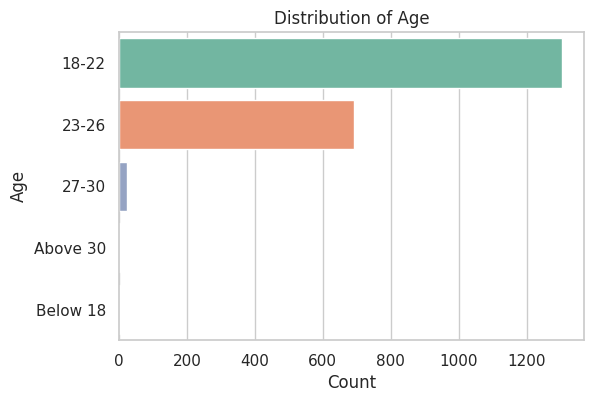

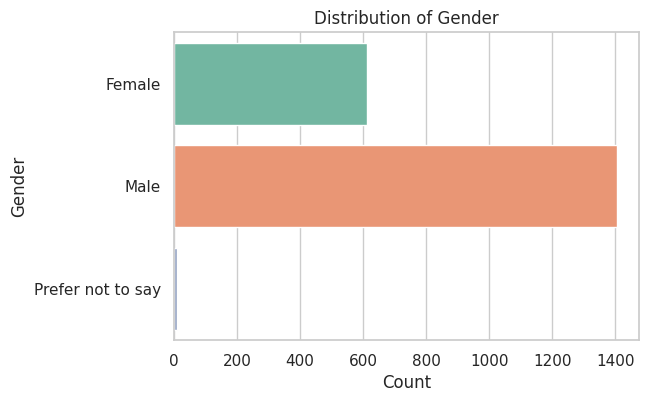

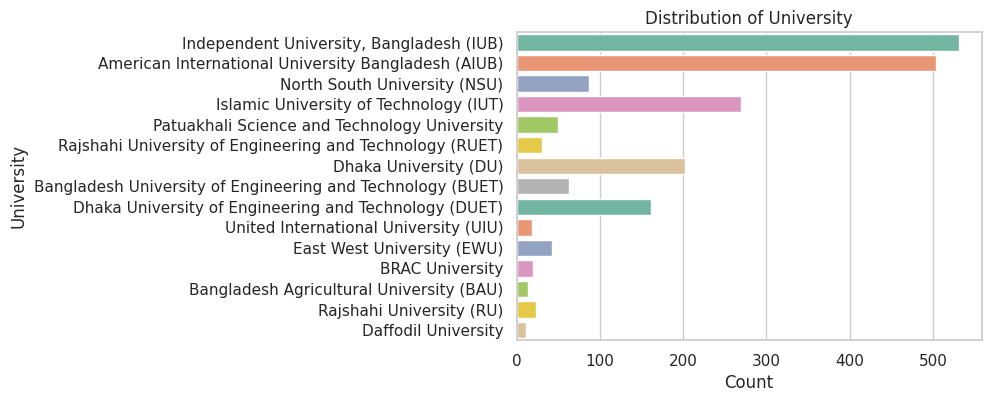

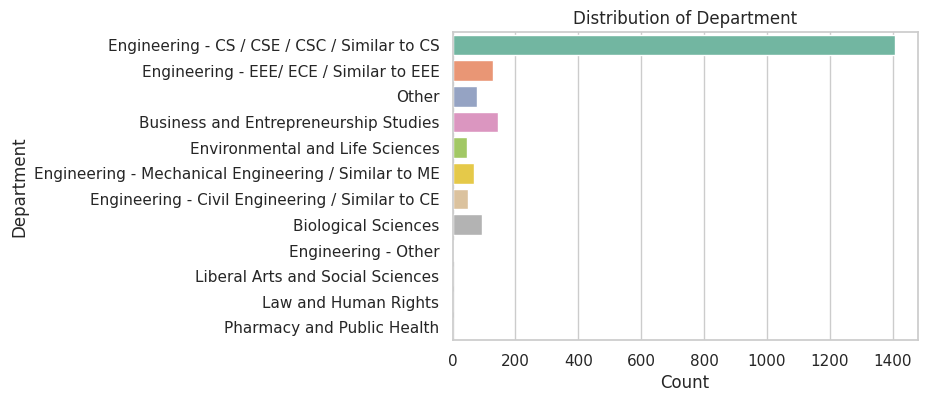

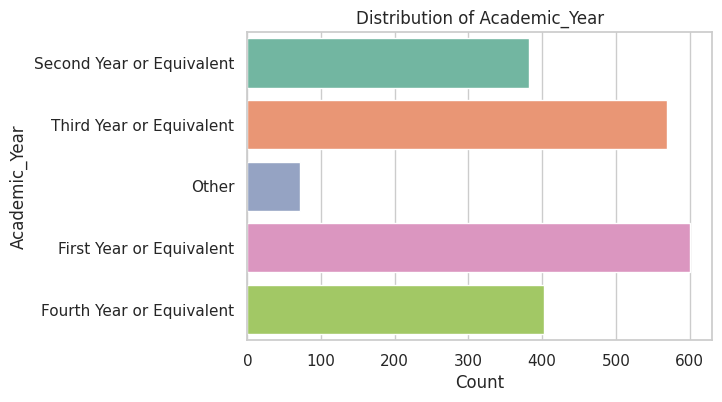

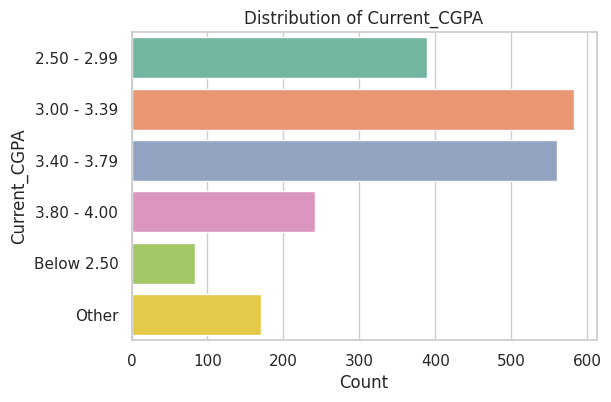

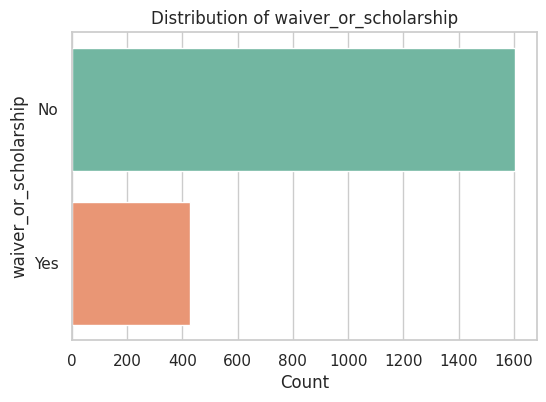

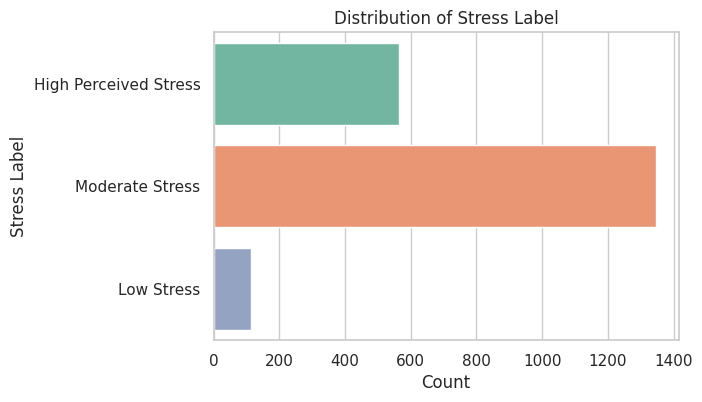

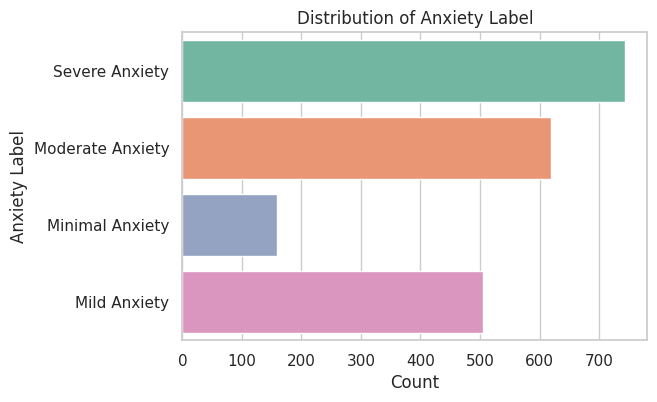

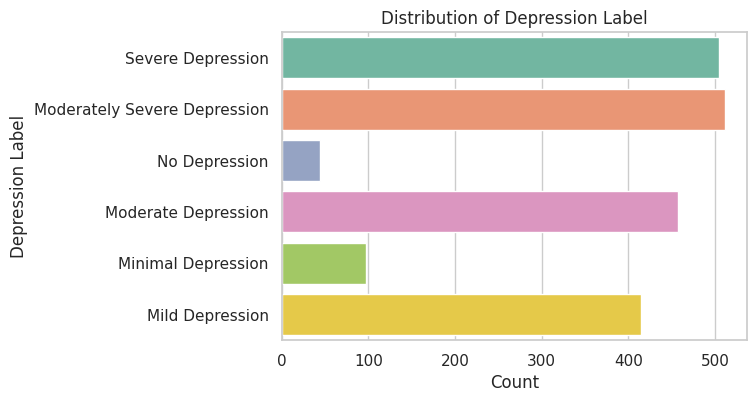

In [ ]:
for col in categorical_cols:
    plt.figure(figsize=(6,4))
    sns.countplot(y=col, data=df, palette="Set2")
    plt.title(f"Distribution of {col}")
    plt.xlabel("Count")
    plt.ylabel(col)
    plt.show()


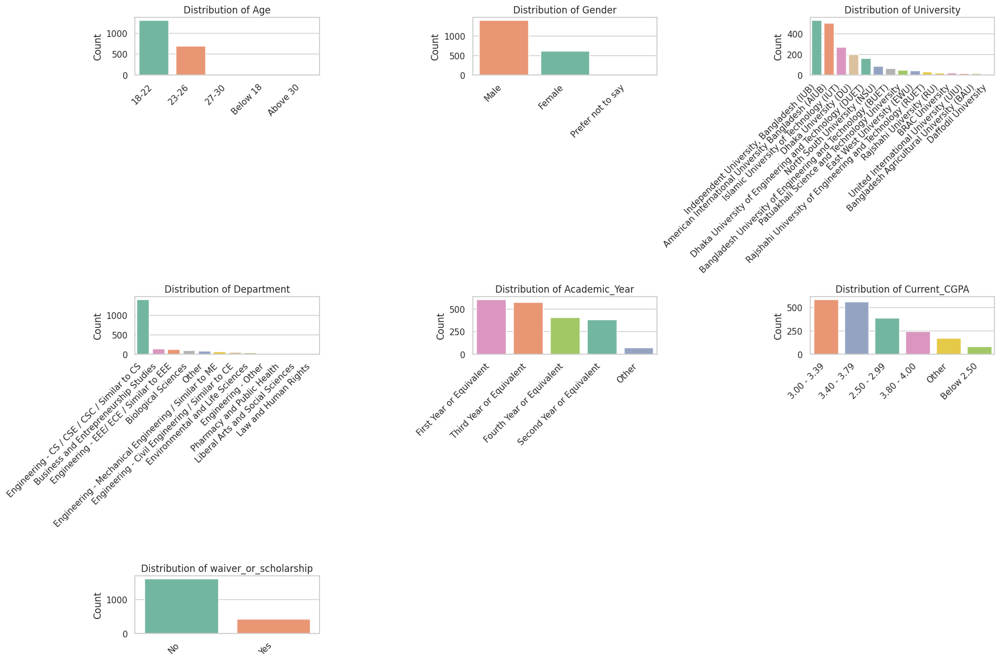

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import os
import kagglehub

# Ensure `path` is defined and data is loaded
if 'path' not in locals():
    path = kagglehub.dataset_download("puspitahelal/public-private-university-student")

DATA_PATH = os.path.join(path, "Processed.csv")
df = pd.read_csv(DATA_PATH)

# List of categorical columns
cat_cols = ['Age', 'Gender', 'University', 'Department', 'Academic_Year', 'Current_CGPA', 'waiver_or_scholarship']

# Set up the figure
plt.figure(figsize=(18, 12))
sns.set_style("whitegrid")

# Loop through columns and plot
for i, col in enumerate(cat_cols, 1):
    plt.subplot(3, 3, i)  # 3x3 grid
    sns.countplot(data=df, x=col, hue=col, palette="Set2", order=df[col].value_counts().index, legend=False)
    plt.xticks(rotation=45, ha='right')
    plt.title(f'Distribution of {col}')
    plt.xlabel('')
    plt.ylabel('Count')

plt.tight_layout()
plt.show()

Categorical columns to plot: ['Age', 'Gender', 'University', 'Department', 'Academic_Year', 'Current_CGPA', 'waiver_or_scholarship', 'Stress Label', 'Anxiety Label', 'Depression Label']


/tmp/ipython-input-3412612639.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, palette="Set2", order=df[col].value_counts().index)
/tmp/ipython-input-3412612639.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, palette="Set2", order=df[col].value_counts().index)
/tmp/ipython-input-3412612639.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, palette="Set2", order=df[col].value_counts().index)
/tmp/ipython-input-3412612639.py:17: FutureWarning: 

Passing `palette` without assignin

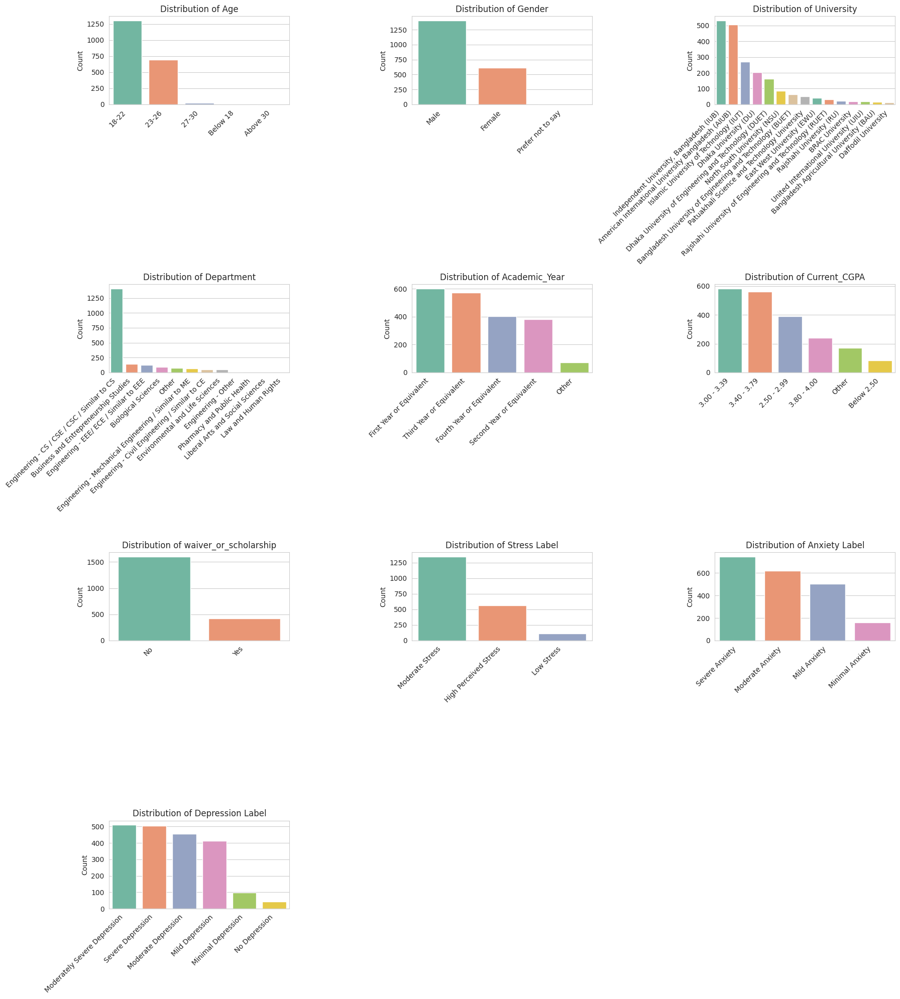

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Automatically detect all categorical columns
cat_cols = df.select_dtypes(include='object').columns.tolist()
print("Categorical columns to plot:", cat_cols)

# Set up the figure
n_cols = 3  # number of subplots per row
n_rows = (len(cat_cols) + n_cols - 1) // n_cols  # calculate required rows
plt.figure(figsize=(6*n_cols, 5*n_rows))
sns.set_style("whitegrid")

# Loop through columns and plot
for i, col in enumerate(cat_cols, 1):
    plt.subplot(n_rows, n_cols, i)
    sns.countplot(data=df, x=col, palette="Set2", order=df[col].value_counts().index)
    plt.xticks(rotation=45, ha='right')
    plt.title(f'Distribution of {col}')
    plt.xlabel('')
    plt.ylabel('Count')

plt.tight_layout()
plt.show()


# Gender vs anxiety,stress,depression

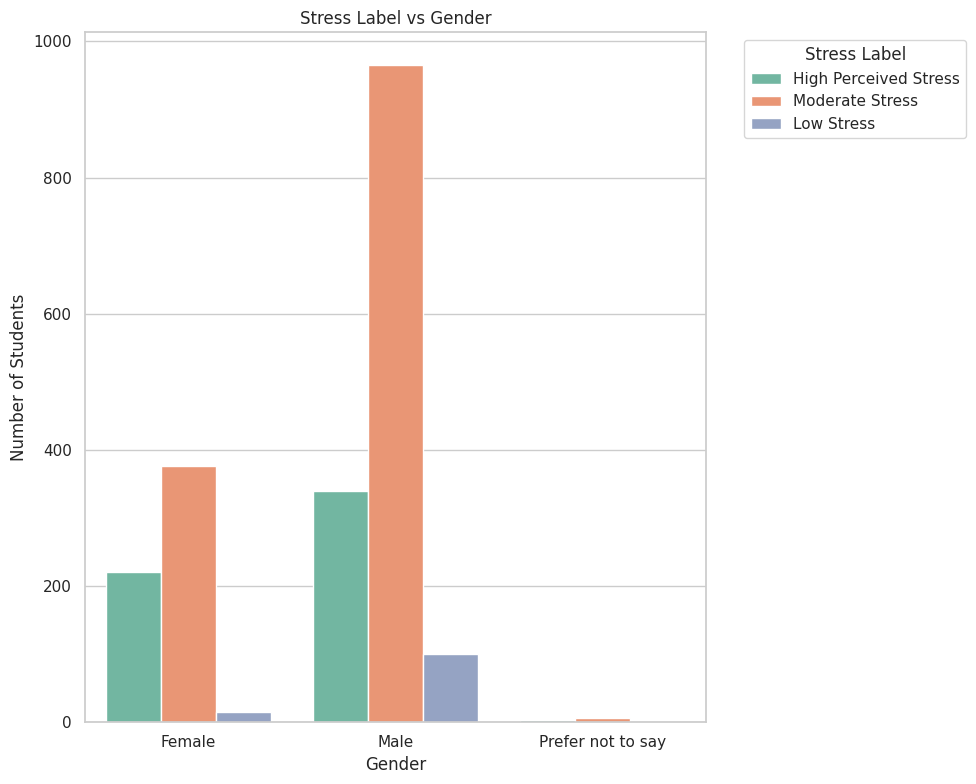

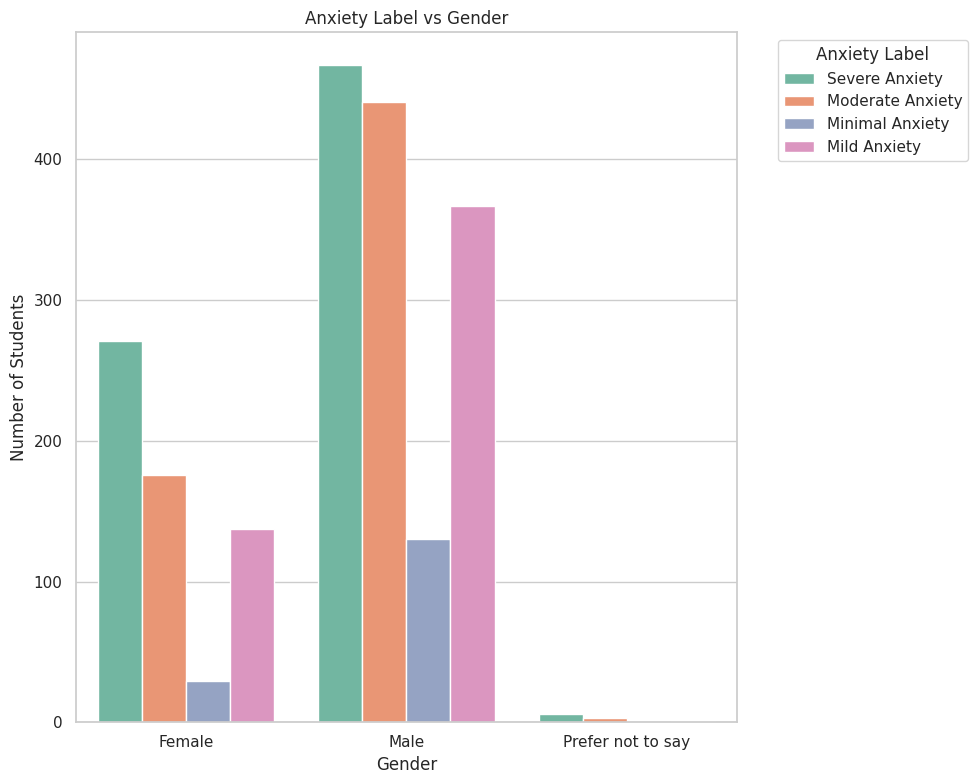

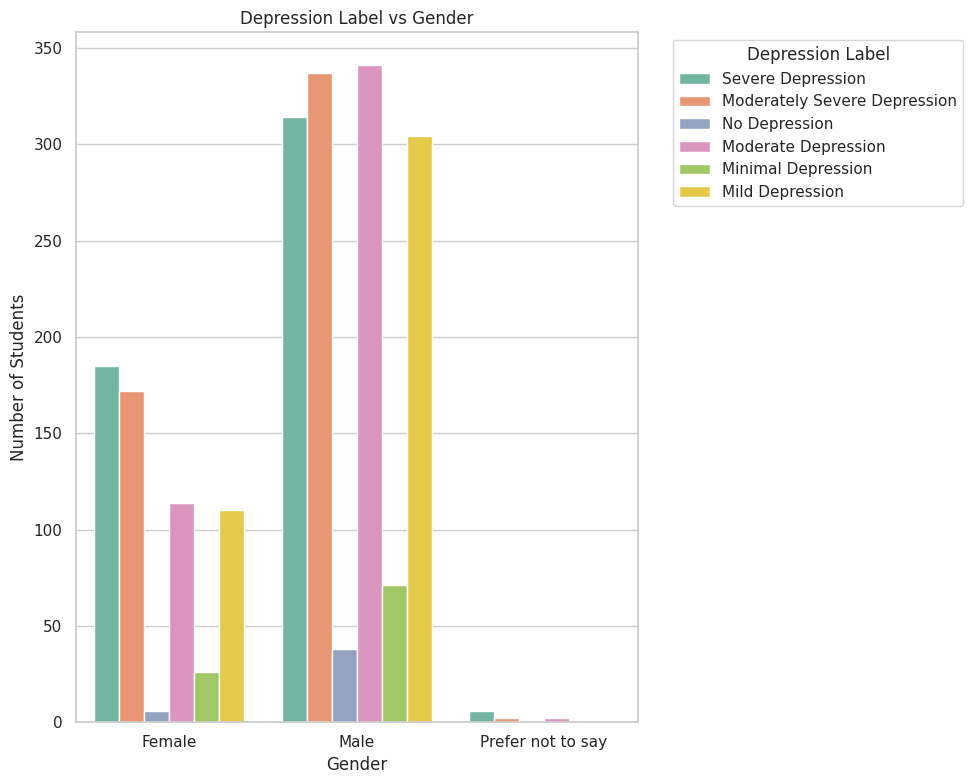

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

gender_col = 'Gender'
targets = ['Stress Label', 'Anxiety Label', 'Depression Label']

for target in targets:
    plt.figure(figsize=(10,8))

    # Count plot for Gender vs target label
    sns.countplot(x=gender_col, hue=target, data=df, palette="Set2")

    plt.title(f"{target} vs {gender_col}")
    plt.xlabel("Gender")
    plt.ylabel("Number of Students")
    plt.legend(title=target, bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()


# Age vs stress,depression,anxiety

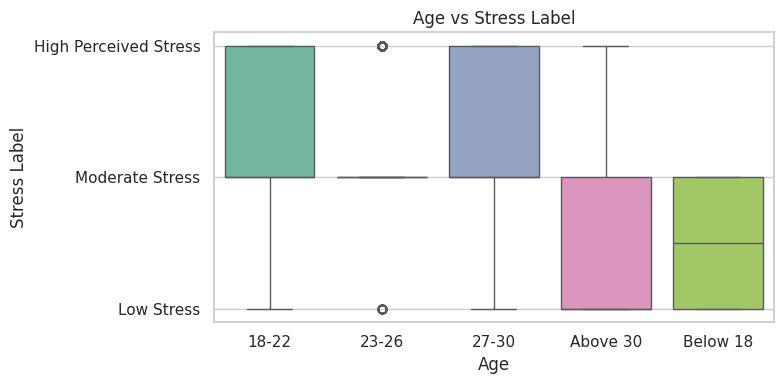

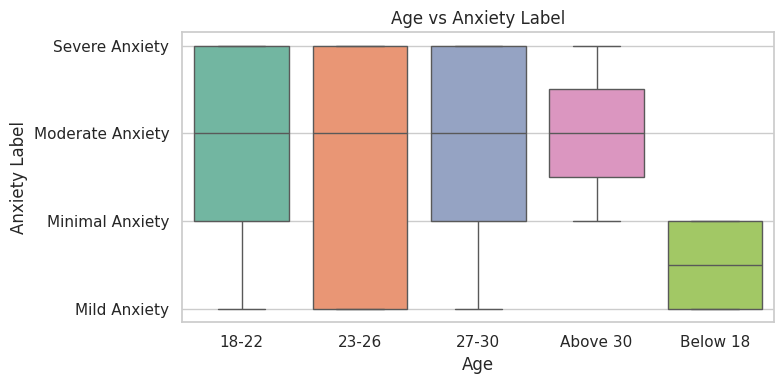

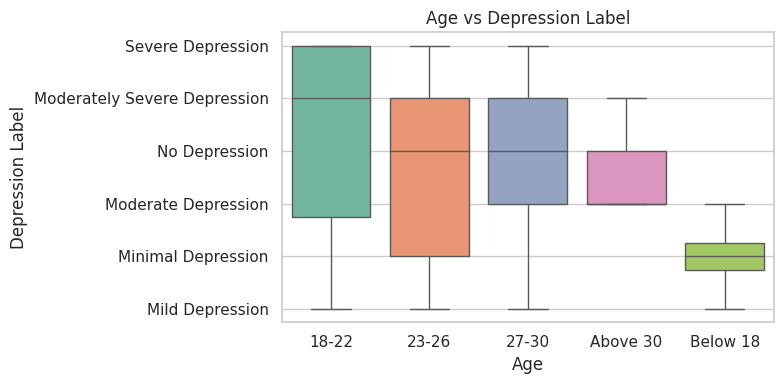

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

age_col = 'Age'
targets = ['Stress Label', 'Anxiety Label', 'Depression Label']

for target in targets:
    plt.figure(figsize=(8,4))
    sns.boxplot(y=target, x=age_col, data=df, palette="Set2")
    plt.title(f"Age vs {target}")
    plt.xlabel("Age")
    plt.ylabel(target)
    plt.tight_layout()
    plt.show()


# University vs target

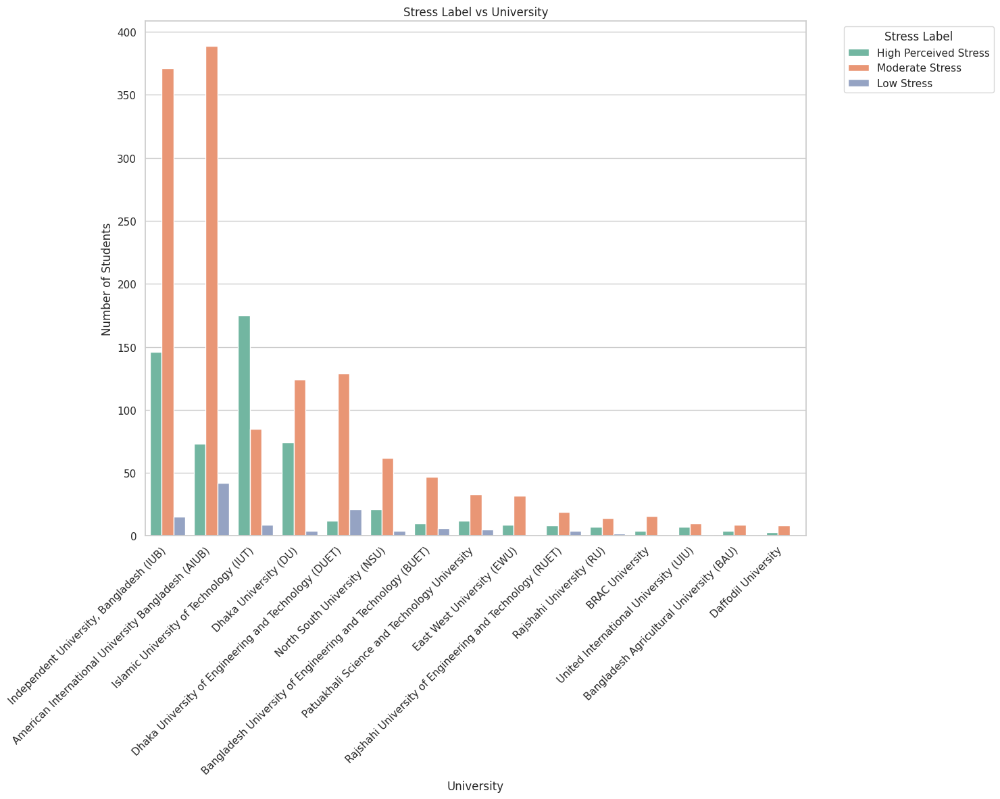

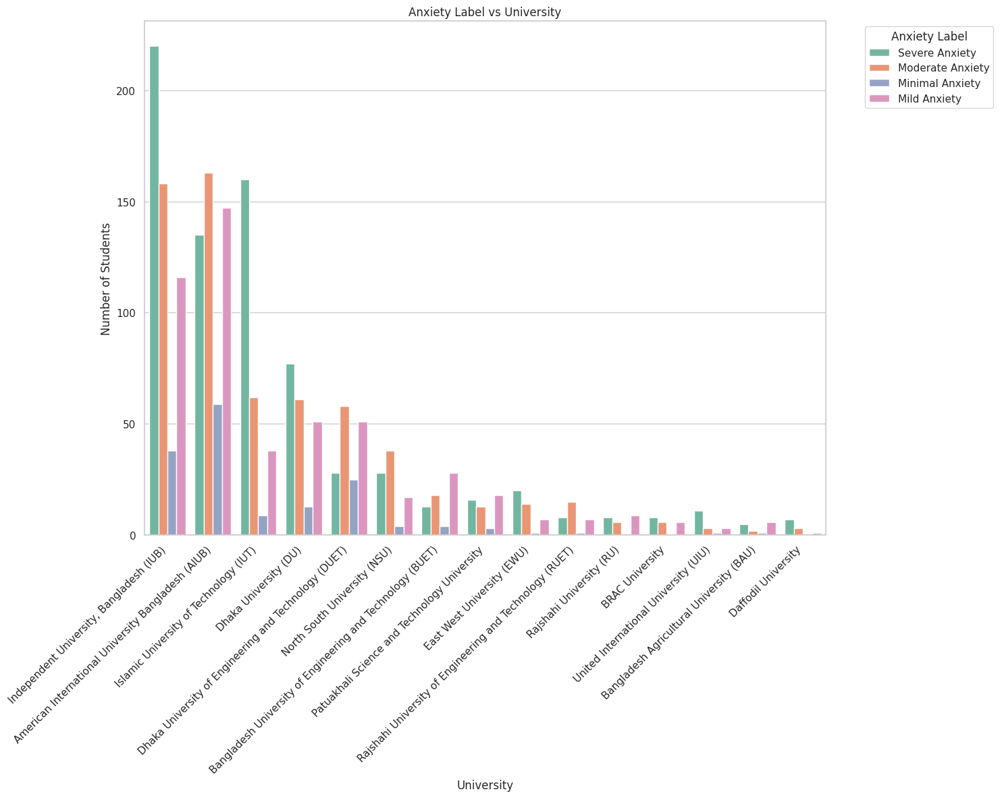

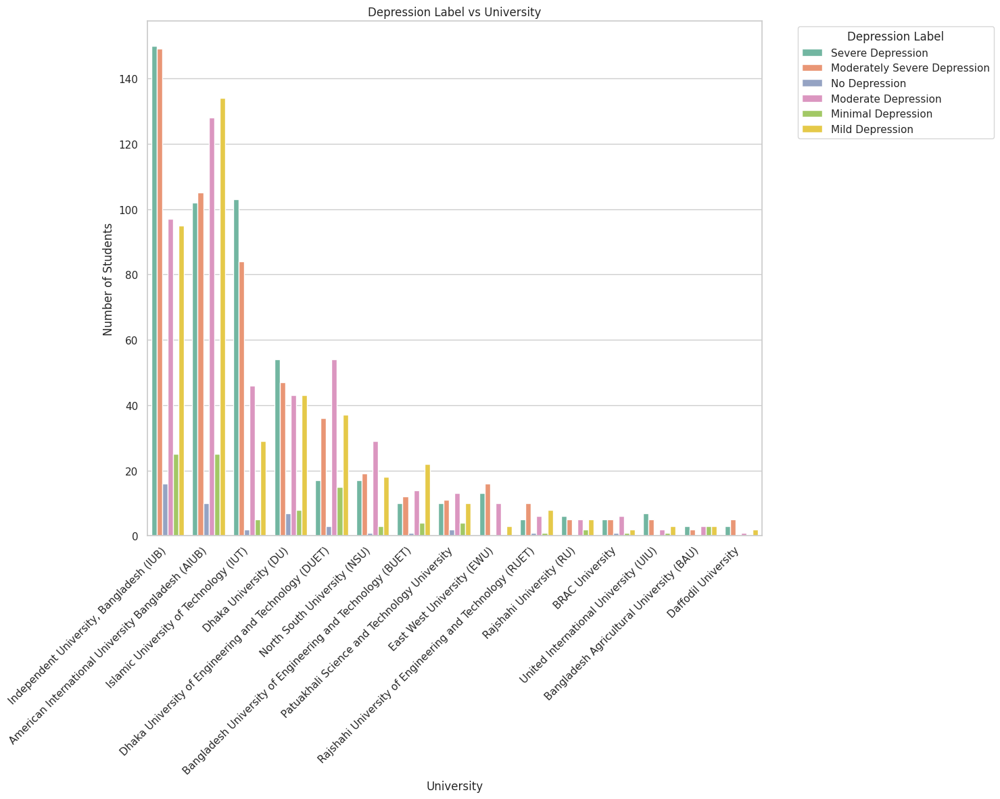

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

uni_col = 'University'
targets = ['Stress Label', 'Anxiety Label', 'Depression Label']

# Optional: sort universities by number of students
uni_order = df[uni_col].value_counts().index

for target in targets:
    plt.figure(figsize=(15,12))

    # Count plot
    sns.countplot(x=uni_col, hue=target, data=df, palette="Set2", order=uni_order)

    plt.title(f"{target} vs {uni_col}")
    plt.xlabel("University")
    plt.ylabel("Number of Students")
    plt.xticks(rotation=45, ha='right')
    plt.legend(title=target, bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()


# University (horizontal)

100%|██████████| 188k/188k [00:00<00:00, 33.2MB/s]

Extracting files...


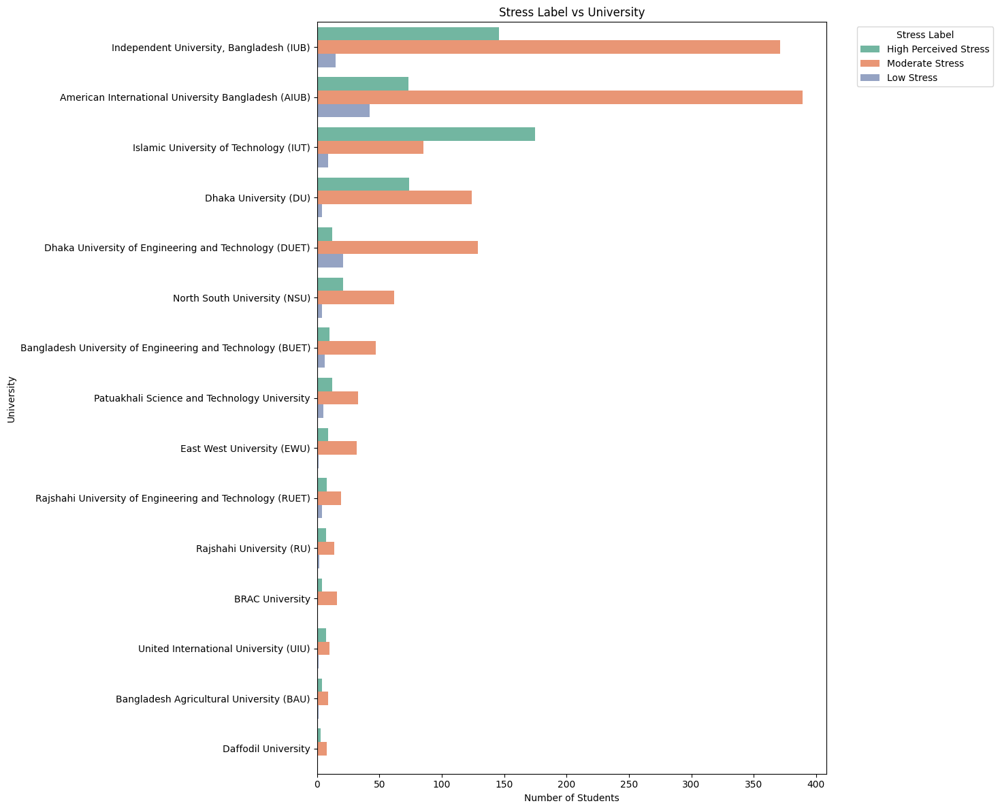

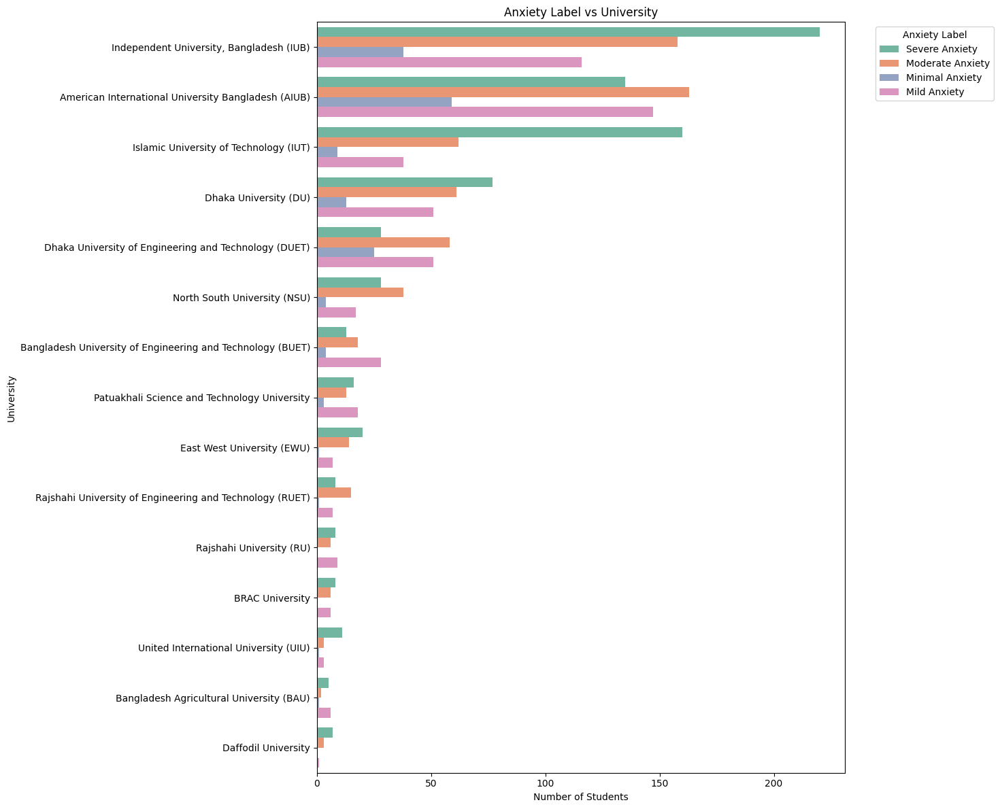

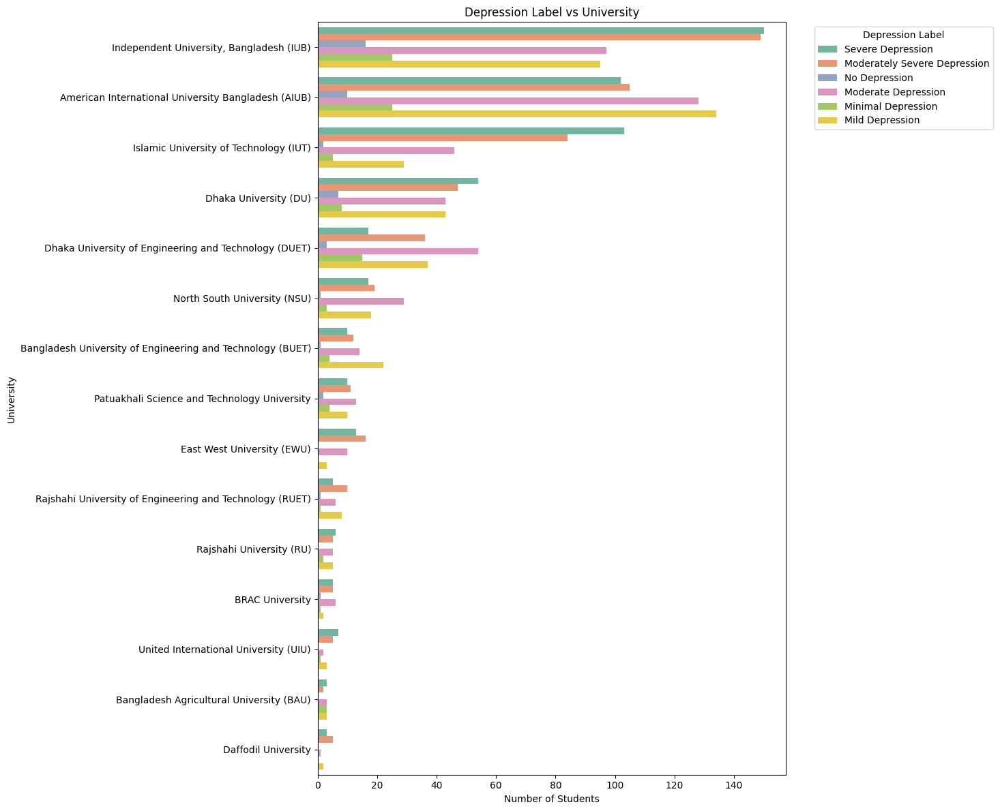

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import os
import kagglehub

# Ensure `path` is defined if the kernel was reset or run out of order
if 'path' not in locals():
    path = kagglehub.dataset_download("puspitahelal/public-private-university-student")

DATA_PATH = os.path.join(path, "Processed.csv")
df = pd.read_csv(DATA_PATH)

uni_col = 'University'
targets = ['Stress Label', 'Anxiety Label', 'Depression Label']

# Optional: sort universities by number of students
uni_order = df[uni_col].value_counts().index

for target in targets:
    plt.figure(figsize=(15, 12))

    # Horizontal count plot
    sns.countplot(
        y=uni_col,          # 👈 horizontal
        hue=target,
        data=df,
        palette="Set2",
        order=uni_order
    )

    plt.title(f"{target} vs {uni_col}")
    plt.xlabel("Number of Students")
    plt.ylabel("University")
    plt.legend(title=target, bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.tight_layout()
    plt.show()

# Dept vs

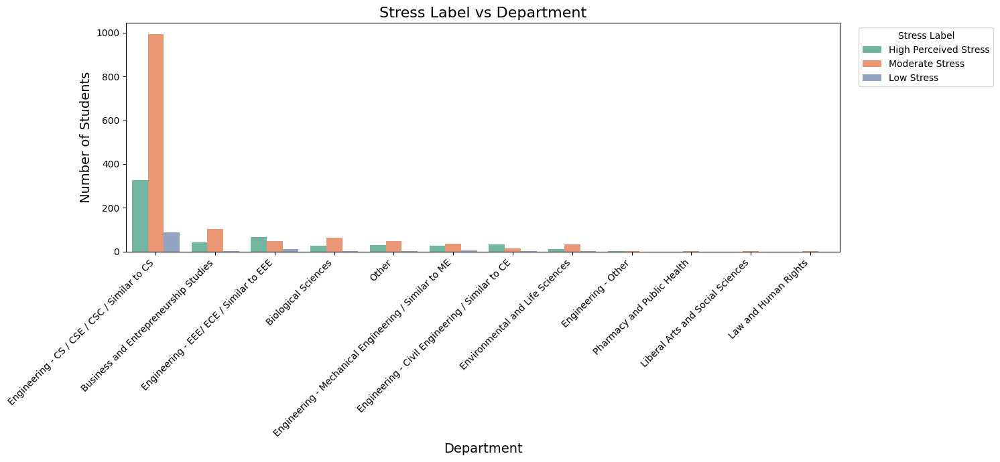

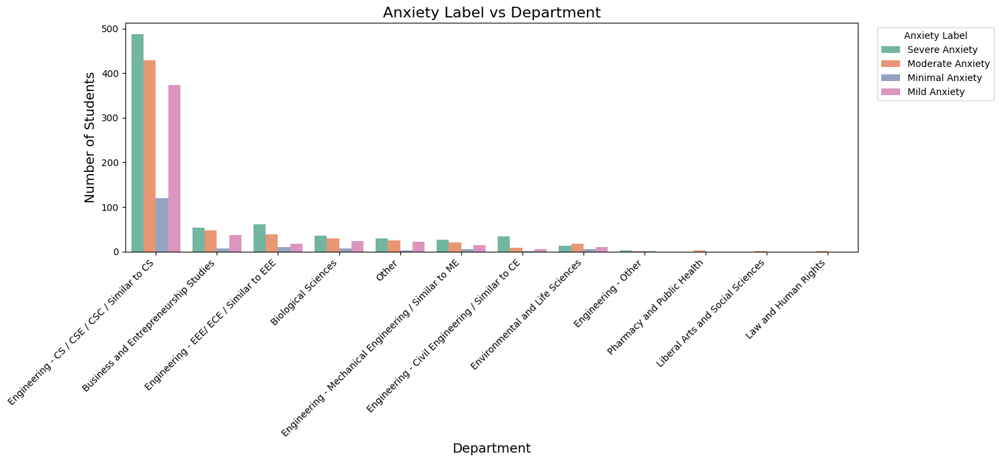

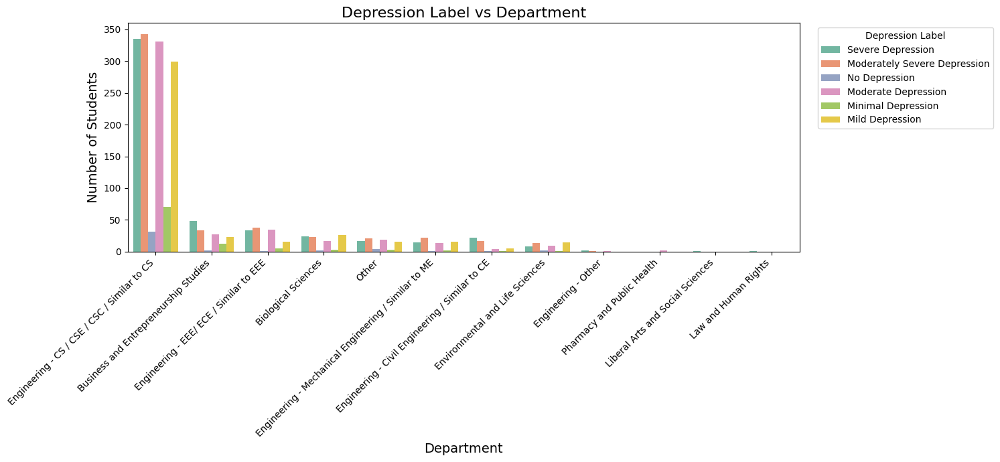

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import os
import kagglehub

# Load dataset
if 'path' not in locals():
    path = kagglehub.dataset_download("puspitahelal/public-private-university-student")

DATA_PATH = os.path.join(path, "Processed.csv")
df = pd.read_csv(DATA_PATH)

dept_col = 'Department'
targets = ['Stress Label', 'Anxiety Label', 'Depression Label']

# Sort departments by number of students
dept_order = df[dept_col].value_counts().index

for target in targets:
    plt.figure(figsize=(15, 7))

    sns.countplot(
        x=dept_col,           # ← vertical
        hue=target,
        data=df,
        palette="Set2",
        order=dept_order
    )

    plt.title(f"{target} vs Department", fontsize=16)
    plt.xlabel("Department", fontsize=14)
    plt.ylabel("Number of Students", fontsize=14)
    plt.xticks(rotation=45, ha='right')
    plt.legend(title=target, bbox_to_anchor=(1.02, 1), loc='upper left')

    plt.tight_layout()
    plt.show()


# Cgpa Vs target

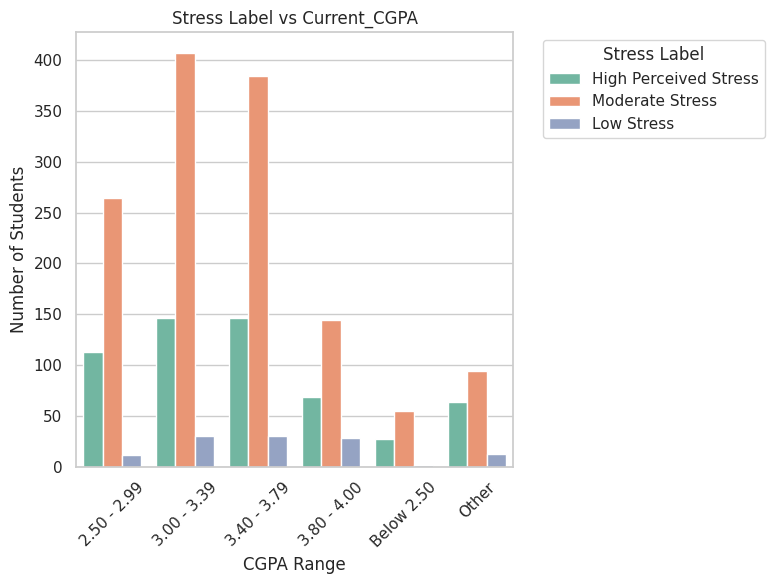

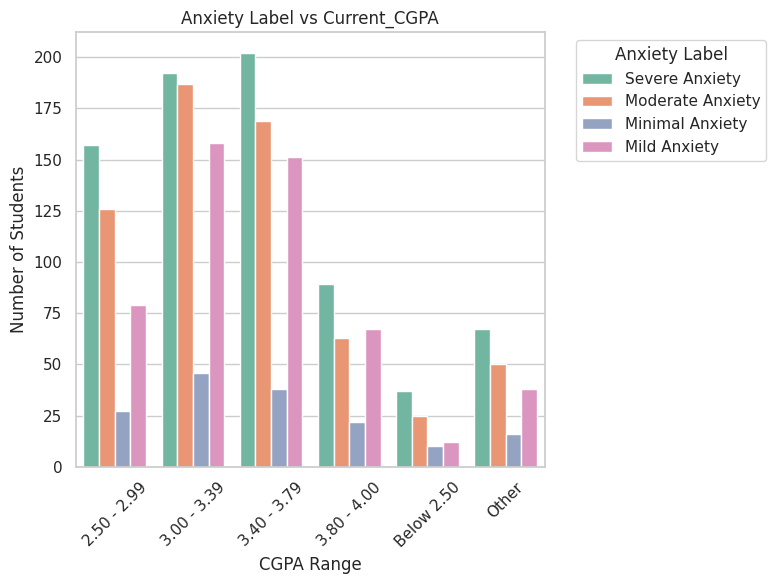

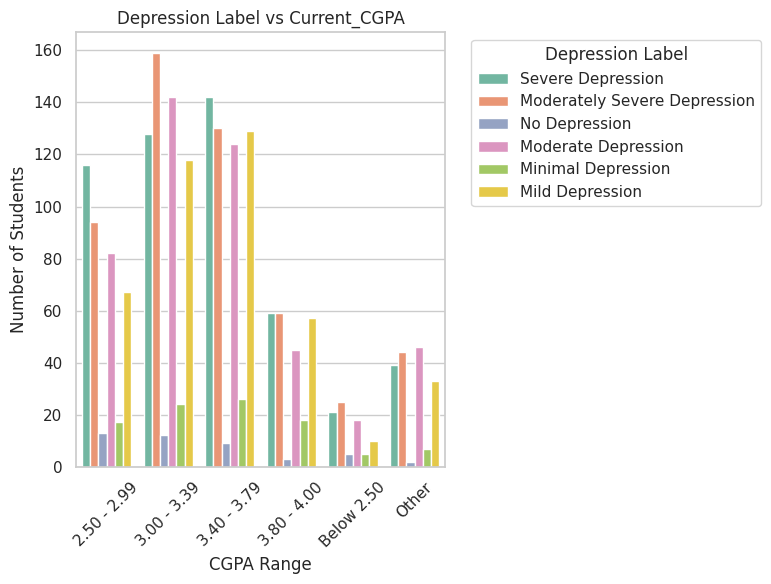

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

df.columns = df.columns.str.strip()  # remove spaces from column names
cgpa_col = 'Current_CGPA'
targets = ['Stress Label', 'Anxiety Label', 'Depression Label']

for target in targets:
    plt.figure(figsize=(8,6))
    sns.countplot(x=cgpa_col, hue=target, data=df, palette="Set2")
    plt.title(f"{target} vs {cgpa_col}")
    plt.xlabel("CGPA Range")
    plt.ylabel("Number of Students")
    plt.xticks(rotation=45)
    plt.legend(title=target, bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()


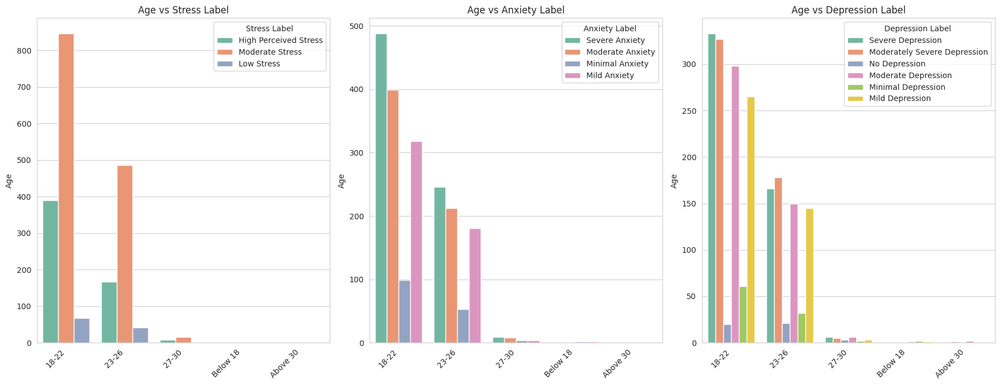

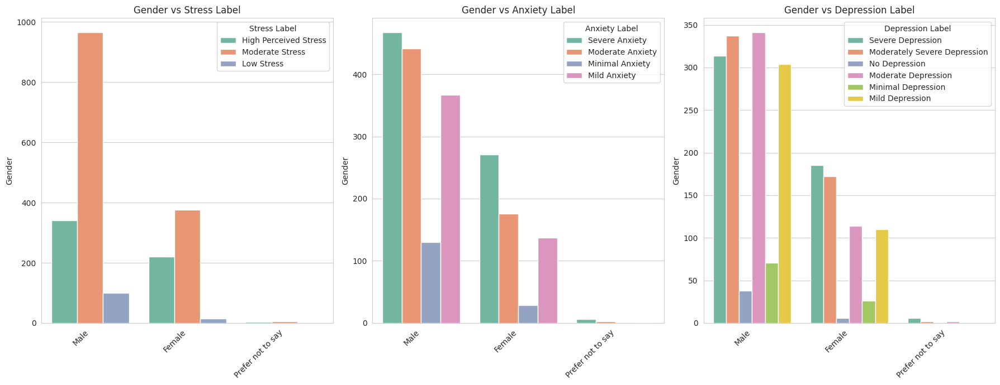

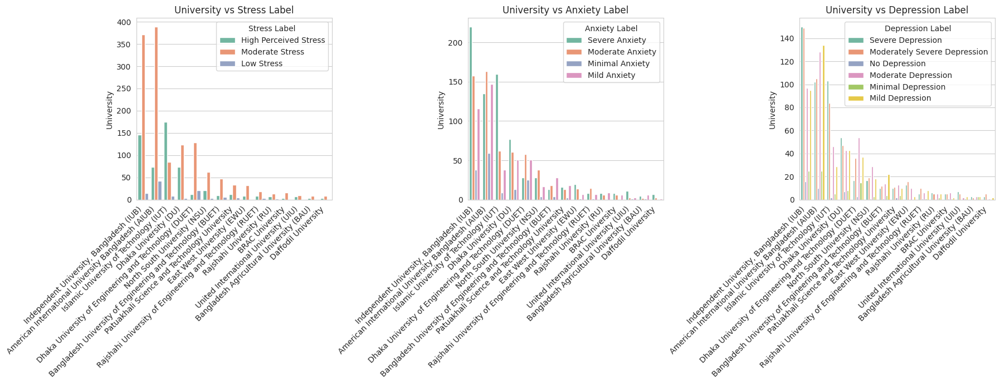

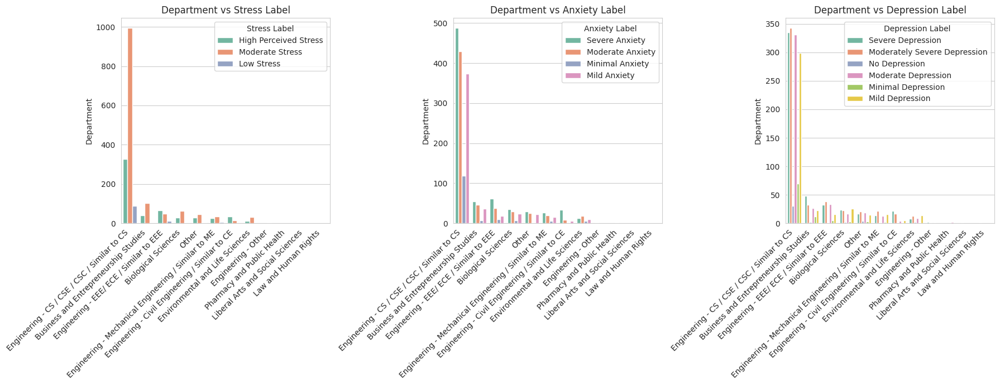

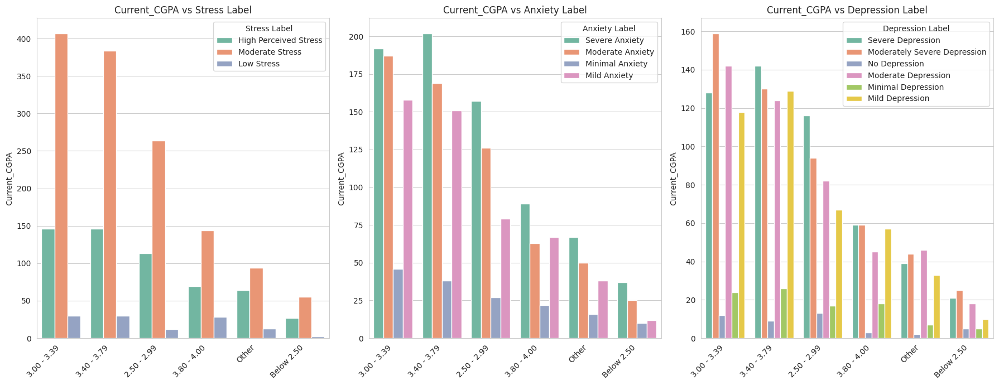

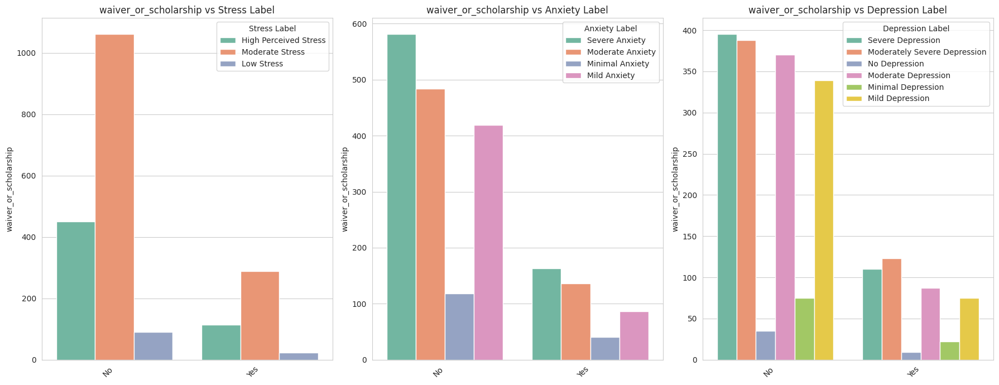

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Features to compare
features = ['Age', 'Gender', 'University', 'Department', 'Current_CGPA', 'waiver_or_scholarship']
targets = ['Stress Label', 'Anxiety Label', 'Depression Label']

# Loop through features and targets
for feature in features:
    plt.figure(figsize=(18,7))

    for i, target in enumerate(targets):
        plt.subplot(1, 3, i+1)

        if df[feature].dtype == 'object' or len(df[feature].unique()) < 10:
            # Categorical: countplot
            sns.countplot(x=feature, hue=target, data=df, palette="Set2",
                          order=df[feature].value_counts().index)
        else:
            # Numerical: boxplot
            sns.boxplot(x=target, y=feature, data=df, palette="Set3")

        plt.title(f"{feature} vs {target}")
        plt.xlabel("")
        plt.ylabel(feature)
        plt.xticks(rotation=45, ha='right')

    plt.tight_layout()
    plt.show()


# Distribution Plot

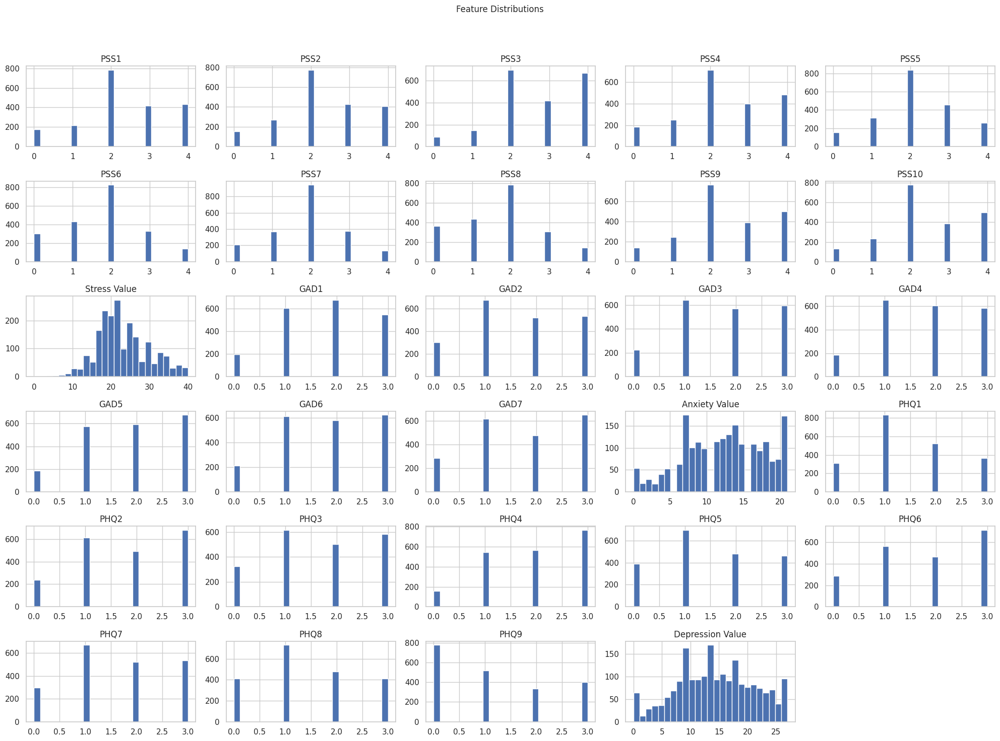

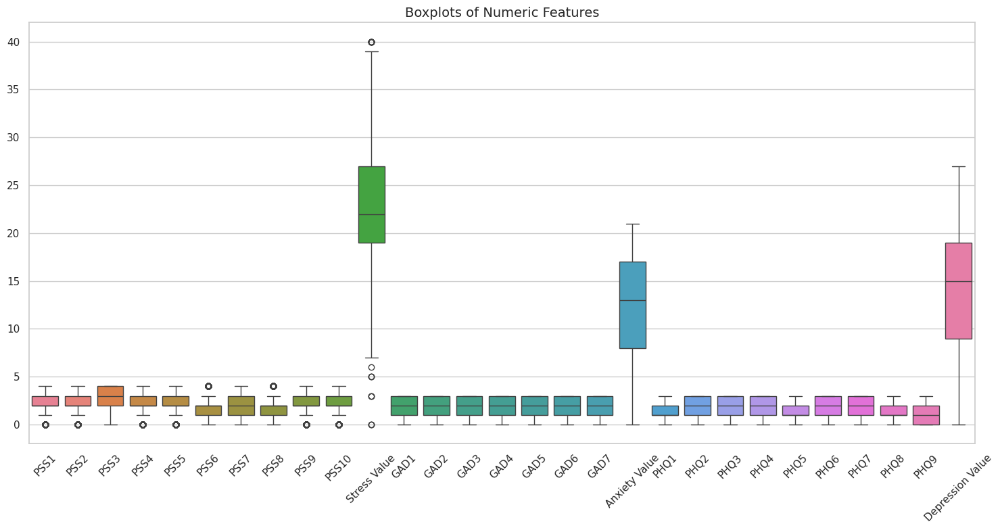

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Histograms for numeric features
df[numeric_cols].hist(bins=25, figsize=(20, 15))
plt.suptitle("Feature Distributions", fontsize=12)
plt.tight_layout(rect=[0, 0, 1, 0.95])  # keeps spacing neat
plt.show()

# Boxplots for outlier detection
plt.figure(figsize=(15, 8))
sns.boxplot(data=df[numeric_cols])
plt.title("Boxplots of Numeric Features", fontsize=14)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Heatmap

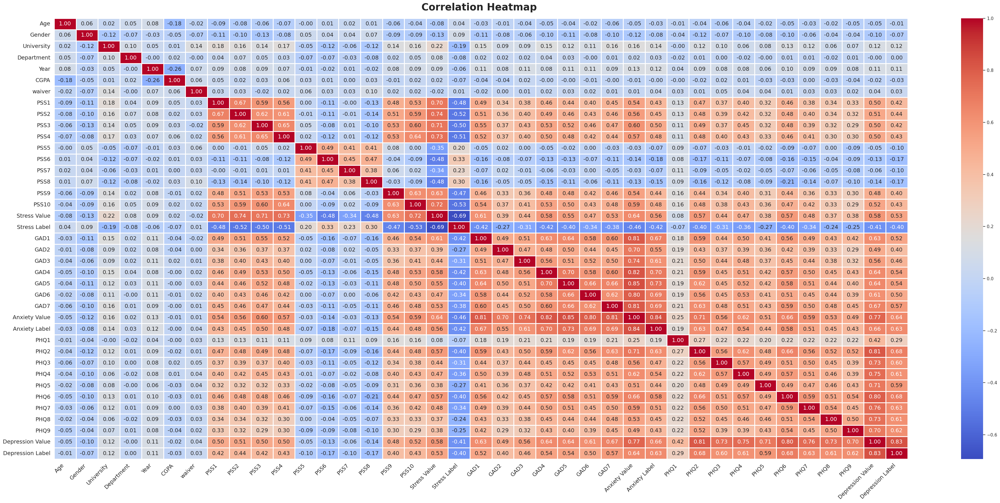

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
import numpy as np

# Step 0: Rename columns for academic clarity
df = df.rename(columns={
    "Academic_Year": "Year",
    "Current_CGPA": "CGPA",
    "waiver_or_scholarship": "waiver"
})

# Step 1: Encode categorical columns
cat_cols = df.select_dtypes(include=['object']).columns.tolist()
le = LabelEncoder()
for col in cat_cols:
    df[col] = le.fit_transform(df[col])

# Step 2: Select numeric columns (including encoded categorical)
num_cols = df.select_dtypes(include=np.number).columns.tolist()


plt.figure(figsize=(40, 18))
sns.heatmap(
    df[num_cols].corr(),
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    annot_kws={"size": 14},
    linewidths=1
)

plt.title(
    "Correlation Heatmap ",
    fontsize=25,
    fontweight="bold",
    pad=20
)

plt.xticks(rotation=45, ha="right", fontsize=14)
plt.yticks(rotation=0, fontsize=14)

plt.tight_layout()
plt.show()

# Numeric heatmap

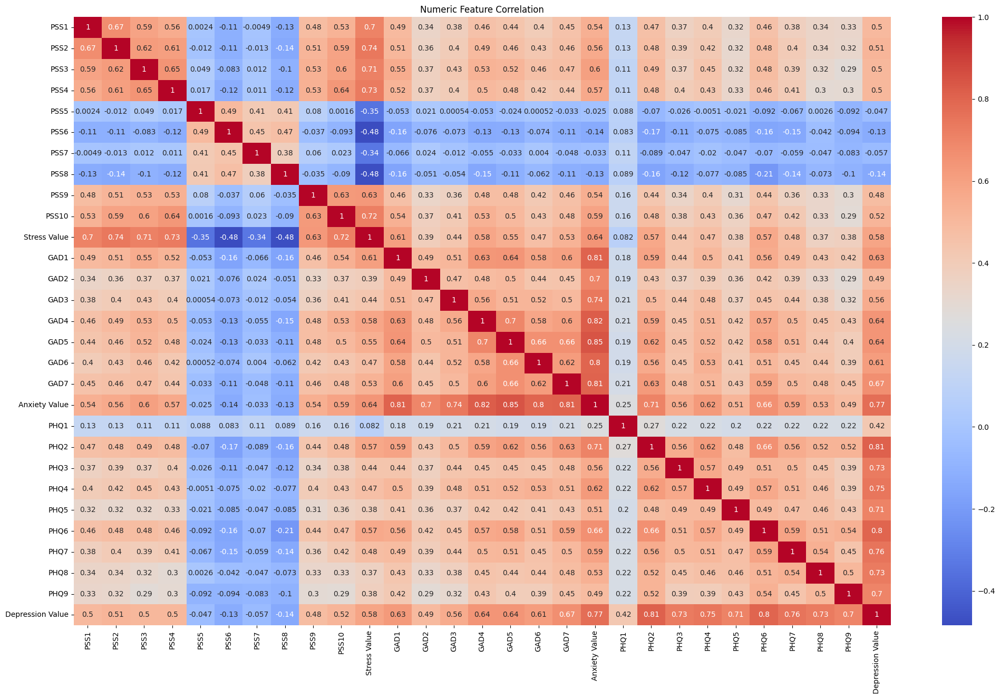

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Define numeric columns for the whole df
num_cols = df.select_dtypes(include=np.number).columns.tolist()

# Plot correlation heatmap
plt.figure(figsize=(25,15))
sns.heatmap(df[num_cols].corr(), annot=True, cmap='coolwarm')
plt.title("Numeric Feature Correlation")
plt.show()

# Anxiety,stress,depression heatmap

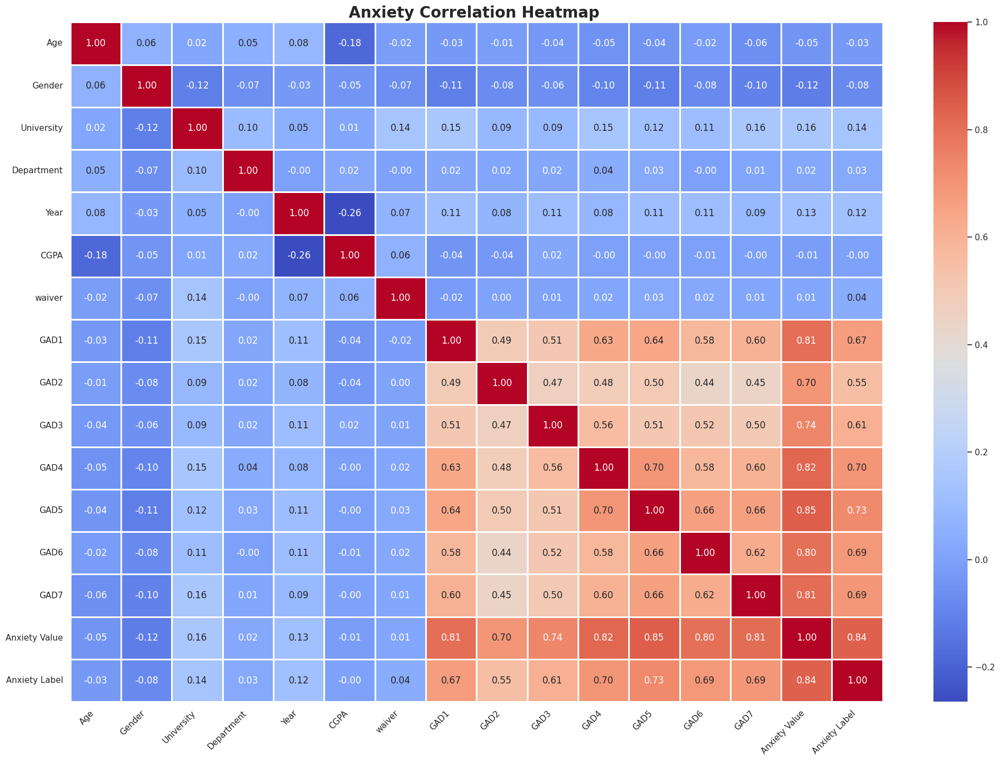

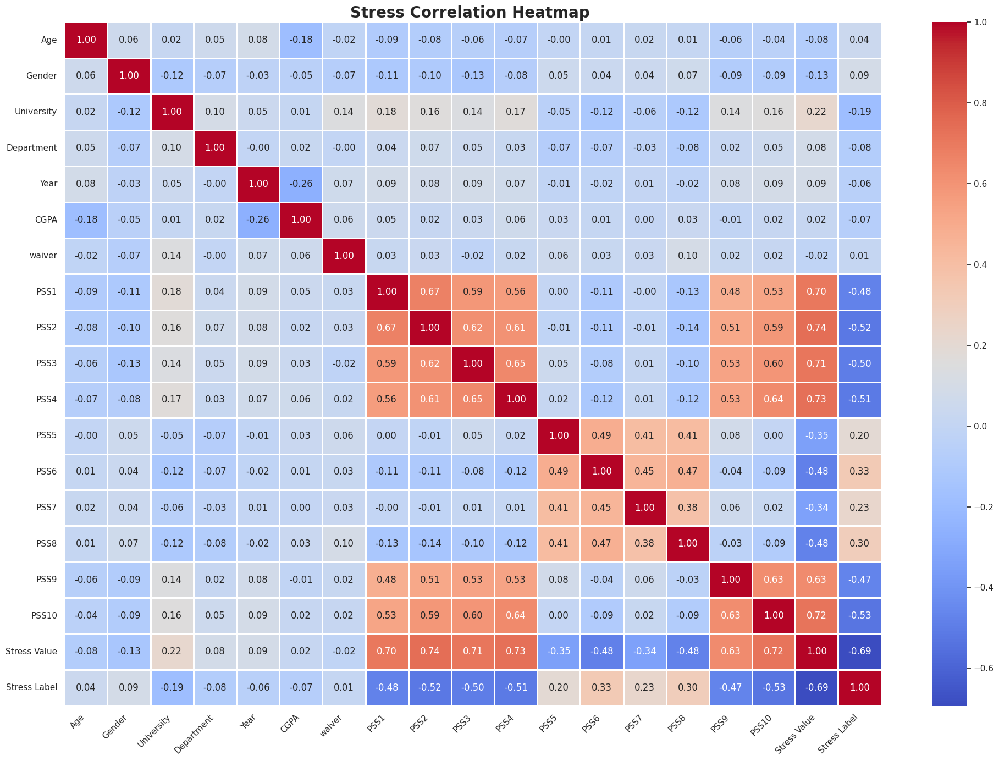

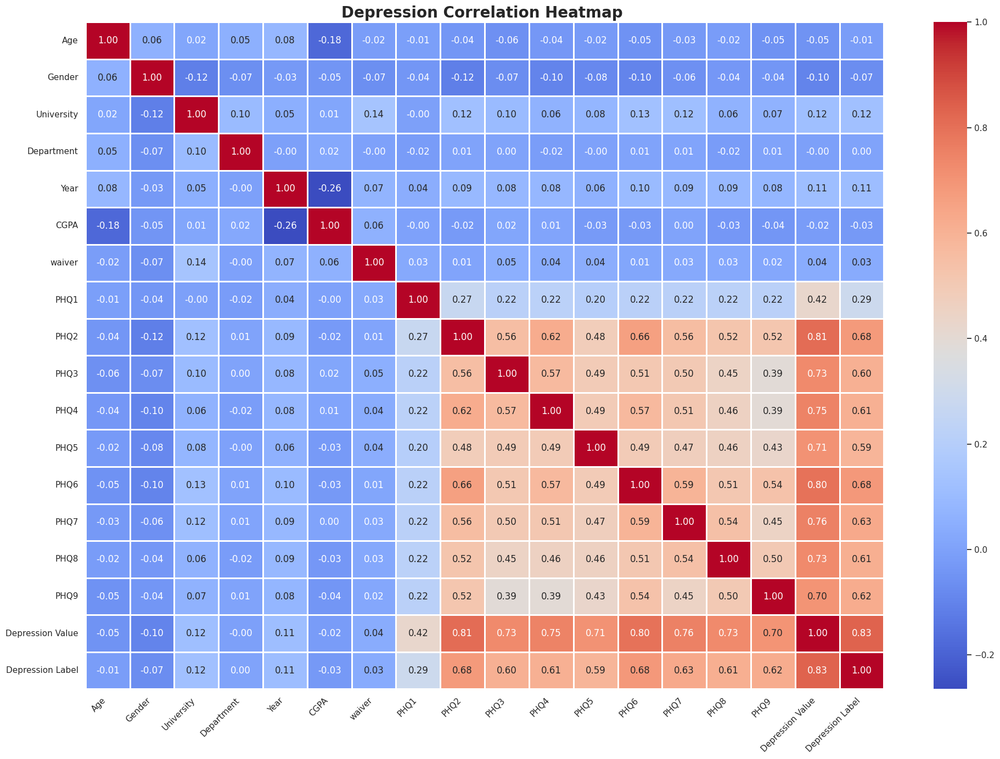

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
import numpy as np


# Step 0: Rename columns for clarity
df = df.rename(columns={
    "Academic_Year": "Year",
    "Current_CGPA": "CGPA",
    "waiver_or_scholarship": "waiver"
})

# Step 1: Encode categorical columns as numeric
cat_cols = df.select_dtypes(include=['object']).columns.tolist()
le = LabelEncoder()
for col in cat_cols:
    df[col] = le.fit_transform(df[col])

# Step 2: Get all numeric columns (including encoded categorical)
num_cols = df.select_dtypes(include=np.number).columns.tolist()

# Step 3: Identify demographic numeric columns (exclude mental health scales)
demographic_cols = [
    c for c in num_cols if not (
        c.startswith("PSS") or
        c.startswith("GAD") or
        c.startswith("PHQ") or
        "Stress" in c or
        "Anxiety" in c or
        "Depression" in c
    )
]



# Anxiety heatmap columns
anxiety_cols = demographic_cols + [c for c in num_cols if c.startswith("GAD") or "Anxiety" in c]

# Stress heatmap columns
stress_cols = demographic_cols + [c for c in num_cols if c.startswith("PSS") or "Stress" in c]

# Depression heatmap columns
depression_cols = demographic_cols + [c for c in num_cols if c.startswith("PHQ") or "Depression" in c]

# Step 5: Plot Anxiety Heatmap
plt.figure(figsize=(20, 14))
sns.heatmap(
    df[anxiety_cols].corr(),
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    annot_kws={"size": 12},
    linewidths=1
)
plt.title("Anxiety Correlation Heatmap ", fontsize=20, fontweight="bold")
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# Step 6: Plot Stress Heatmap
plt.figure(figsize=(20, 14))
sns.heatmap(
    df[stress_cols].corr(),
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    annot_kws={"size": 12},
    linewidths=1
)
plt.title("Stress Correlation Heatmap ", fontsize=20, fontweight="bold")
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# Step 7: Plot Depression Heatmap
plt.figure(figsize=(20, 14))
sns.heatmap(
    df[depression_cols].corr(),
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    annot_kws={"size": 12},
    linewidths=1
)
plt.title("Depression Correlation Heatmap ", fontsize=20, fontweight="bold")
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# Train Test split

In [ ]:
from sklearn.model_selection import train_test_split

# ==============================
# Define Features & Target
# ==============================
target_col = 'Stress Label'  # example target
X = df.drop(columns=['Stress Label', 'Anxiety Label', 'Depression Label'])
y = df[target_col]

# Encode target if categorical
from sklearn.preprocessing import LabelEncoder
le_target = LabelEncoder()
y_encoded = le_target.fit_transform(y)

# ==============================
# Train-Test Split (Prevent Leakage)
# ==============================
X_train, X_test, y_train, y_test = train_test_split(
    X, y_encoded,
    test_size=0.2,
    random_state=42,    # for reproducibility
    stratify=y_encoded  # maintain class distribution
)

print("Train shape:", X_train.shape)
print("Test shape:", X_test.shape)

Train shape: (1622, 36)
Test shape: (406, 36)


# Data Preprocessing

In [ ]:
def preprocess_data(X_train, X_test):
    # Convert to DataFrame if NumPy
    if isinstance(X_train, np.ndarray):
        X_train = pd.DataFrame(X_train, columns=df.drop(columns=target_cols).columns)
    if isinstance(X_test, np.ndarray):
        X_test = pd.DataFrame(X_test, columns=df.drop(columns=target_cols).columns)

    # 1️⃣ Identify numeric and categorical columns
    num_cols = X_train.select_dtypes(include=np.number).columns.tolist()
    cat_cols = X_train.select_dtypes(include='object').columns.tolist()

    # 2️⃣ Numeric imputation (median)
    num_imputer = SimpleImputer(strategy='median')
    X_train[num_cols] = num_imputer.fit_transform(X_train[num_cols])
    X_test[num_cols] = num_imputer.transform(X_test[num_cols])

    # 3️⃣ Categorical imputation (most frequent)
    if cat_cols:  # only if categorical columns exist
        cat_imputer = SimpleImputer(strategy='most_frequent')
        X_train[cat_cols] = cat_imputer.fit_transform(X_train[cat_cols])
        X_test[cat_cols] = cat_imputer.transform(X_test[cat_cols])

        # 4️⃣ Encoding categorical columns
        # Binary → LabelEncoder, Multi-class → One-hot
        binary_cols = [col for col in cat_cols if X_train[col].nunique() == 2]
        multi_cols = [col for col in cat_cols if X_train[col].nunique() > 2]

        # Encode binary categorical
        for col in binary_cols:
            le = LabelEncoder()
            X_train[col] = le.fit_transform(X_train[col])
            X_test[col] = le.transform(X_test[col])

        # One-hot encode multi-class categorical
        if multi_cols:
            X_train = pd.get_dummies(X_train, columns=multi_cols, drop_first=True)
            X_test = pd.get_dummies(X_test, columns=multi_cols, drop_first=True)

    # 5️⃣ Align train and test (important after one-hot encoding)
    X_train, X_test = X_train.align(X_test, join='left', axis=1, fill_value=0)

    # 6️⃣ Scale numeric features
    # Re-identify numeric columns after encoding
    num_cols = X_train.select_dtypes(include=np.number).columns.tolist()
    scaler = StandardScaler()
    X_train[num_cols] = scaler.fit_transform(X_train[num_cols])
    X_test[num_cols] = scaler.transform(X_test[num_cols])

    return X_train, X_test

# Model design


===== TARGET: Stress Label =====


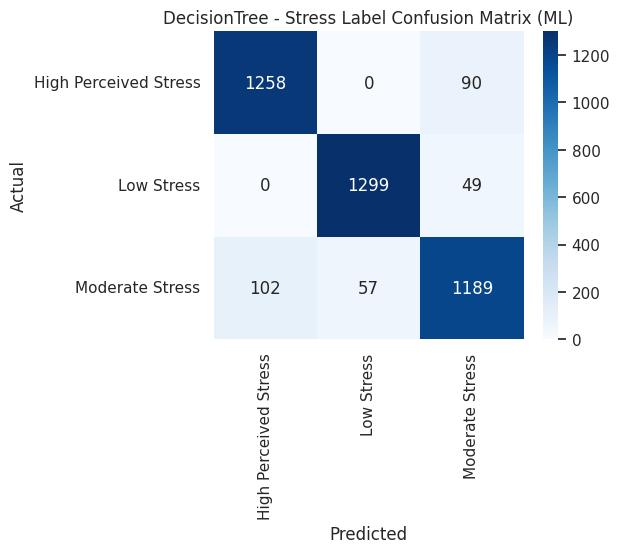

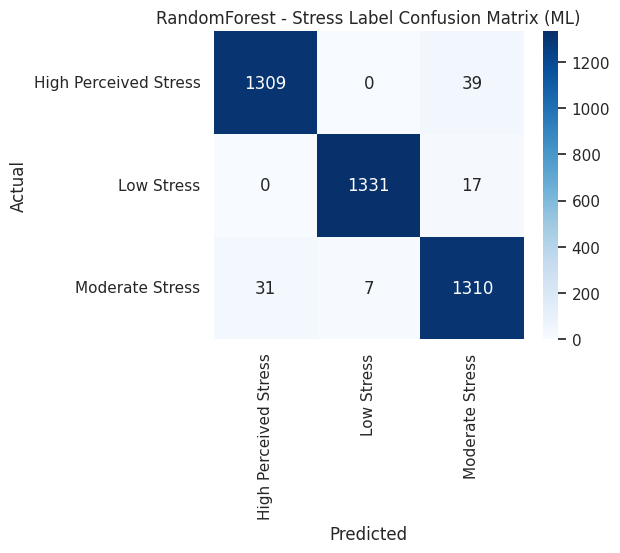

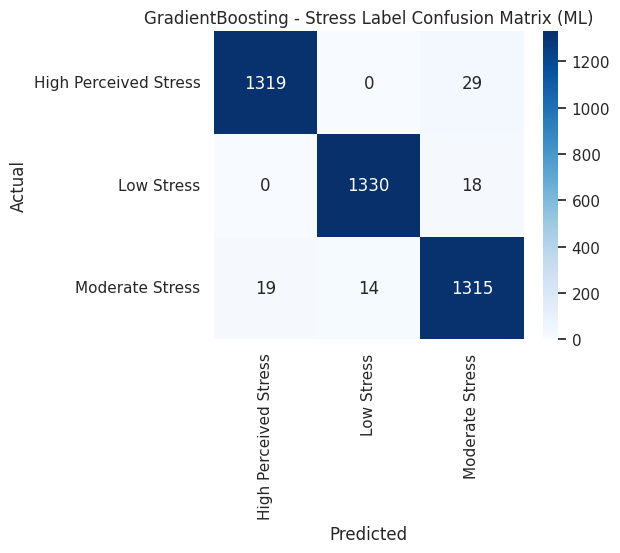

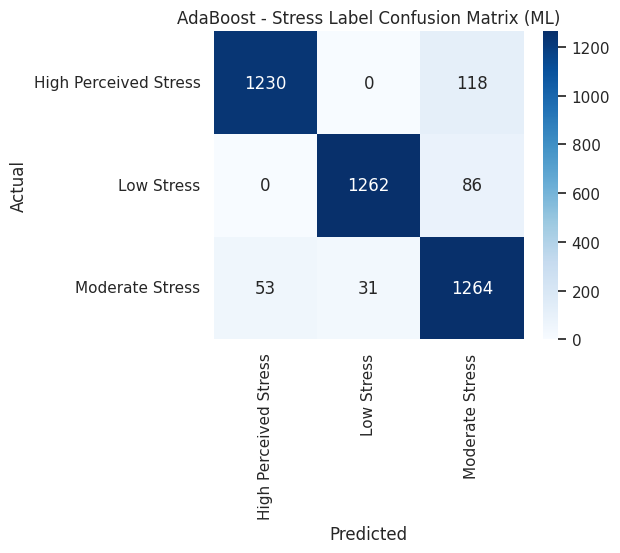

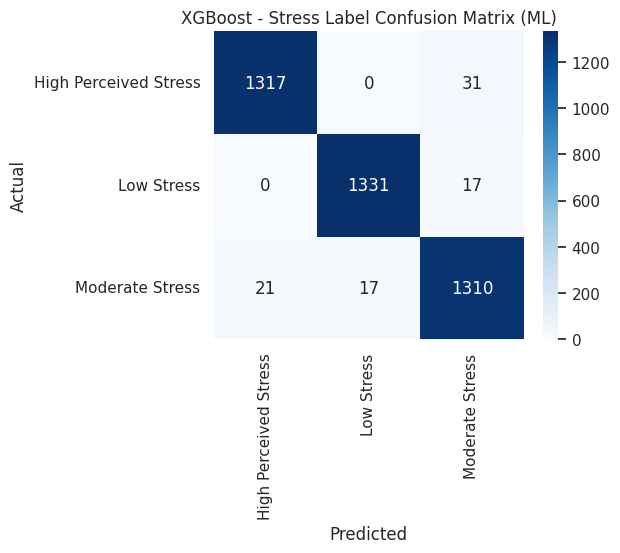

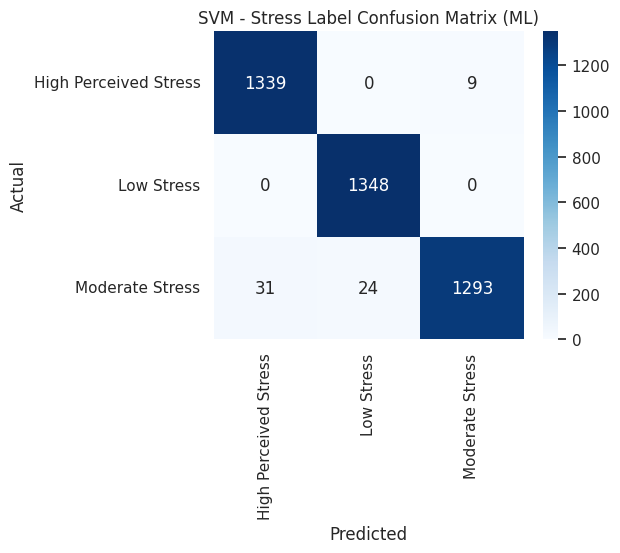

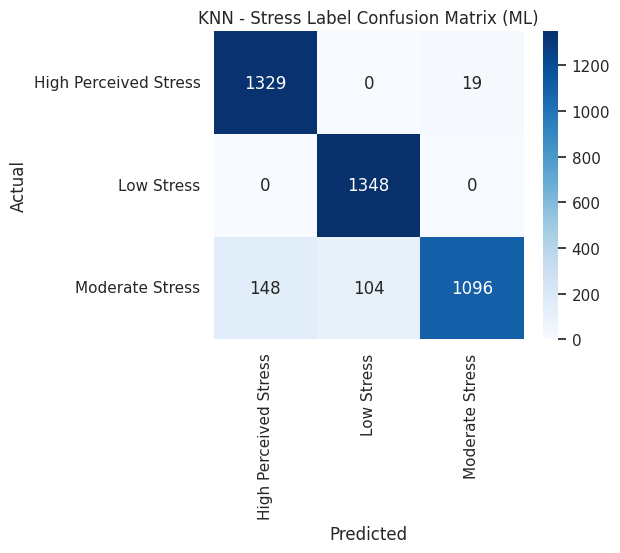

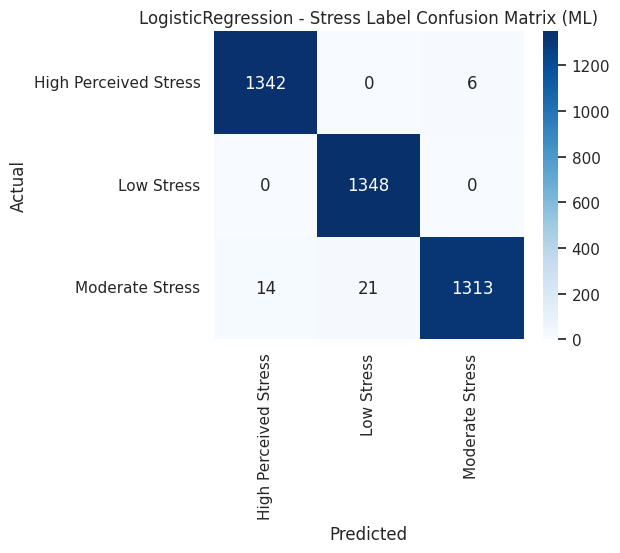

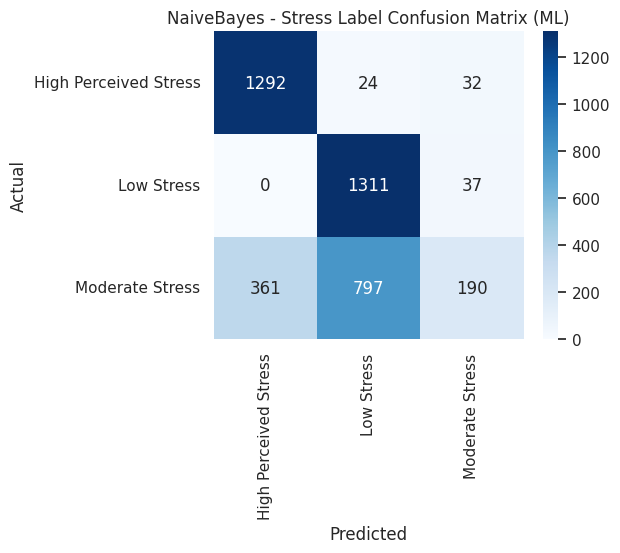

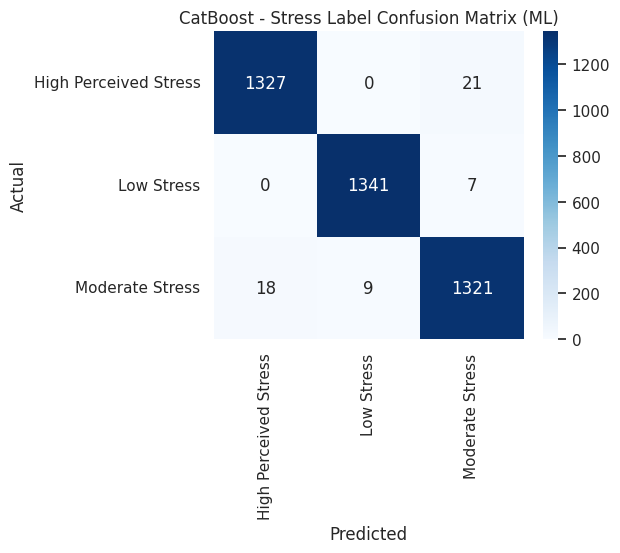

,Accuracy,F1-weighted,Precision-weighted,Recall-weighted
Model,,,,
DecisionTree,0.926311,0.926179,0.926099,0.926311
RandomForest,0.976756,0.976796,0.976879,0.976756
GradientBoosting,0.980218,0.980241,0.980292,0.980218
AdaBoost,0.928783,0.929477,0.931917,0.928783
XGBoost,0.978734,0.978749,0.978783,0.978734
SVM,0.984174,0.984103,0.984322,0.984174
KNN,0.932987,0.931238,0.937044,0.932987
LogisticRegression,0.989862,0.989834,0.989929,0.989862
NaiveBayes,0.690653,0.616987,0.710039,0.690653


Best ML Model: LogisticRegression


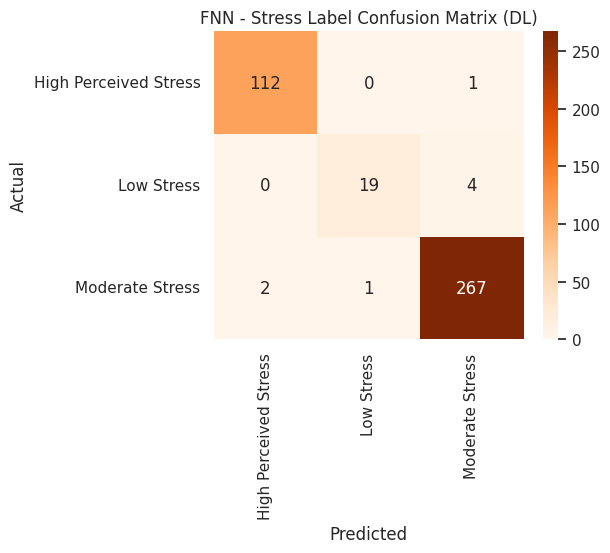

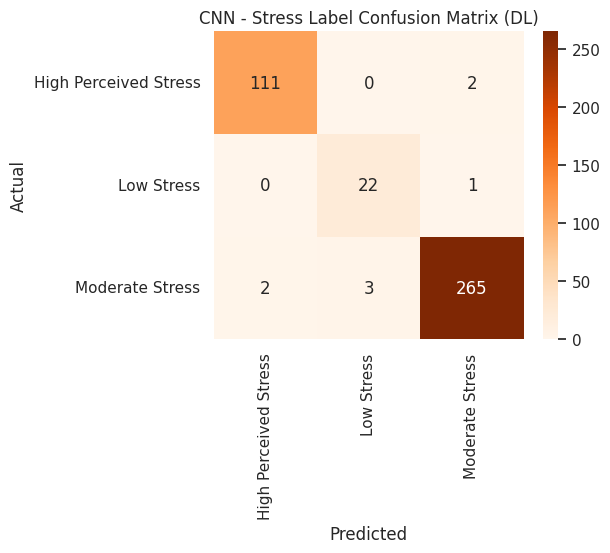

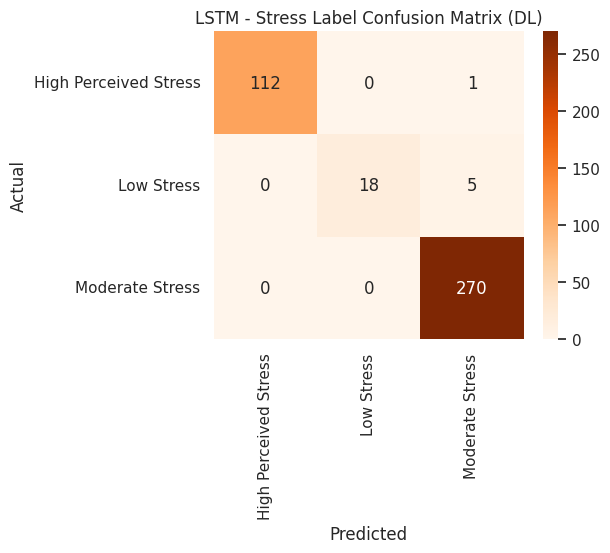

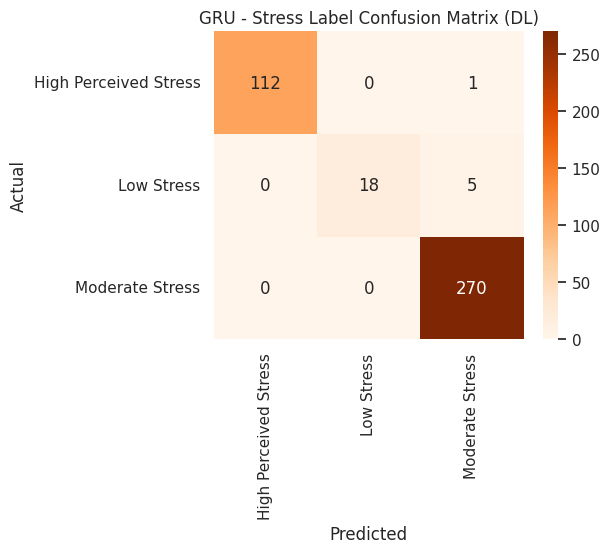

,Accuracy,F1-weighted,Precision-weighted,Recall-weighted
Model,,,,
FNN,0.980296,0.979919,0.980060,0.980296
CNN,0.980296,0.980464,0.980832,0.980296
LSTM,0.985222,0.984546,0.985543,0.985222
GRU,0.985222,0.984546,0.985543,0.985222


Best DL Model: LSTM
Best hyperparameters: {'C': 10}


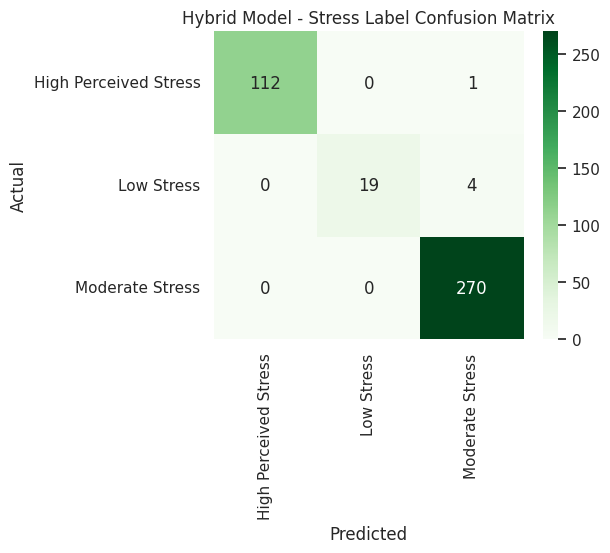

,Accuracy,F1-weighted,Precision-weighted,Recall-weighted
Model,,,,
Hybrid (LogisticRegression+LSTM),0.987685,0.987267,0.987909,0.987685


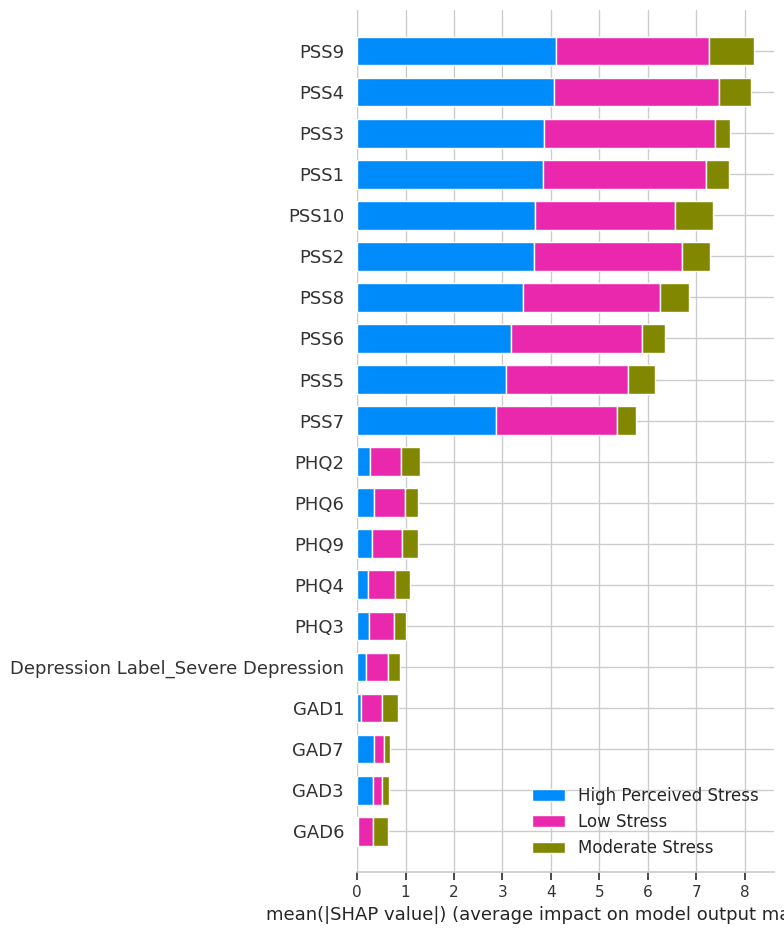

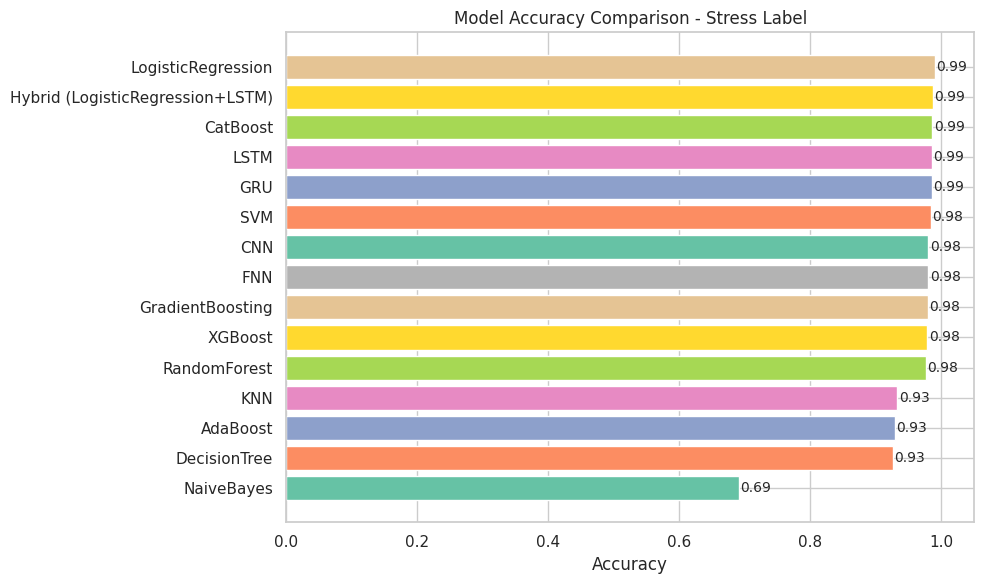


===== TARGET: Anxiety Label =====


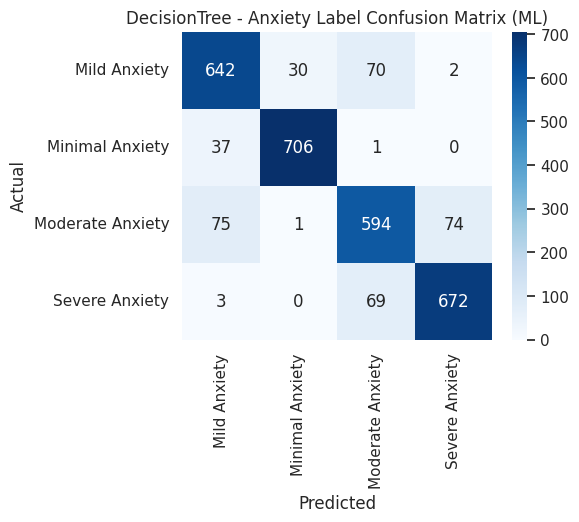

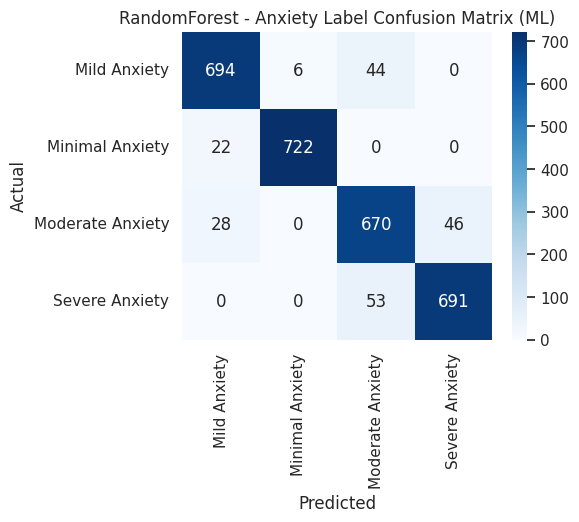

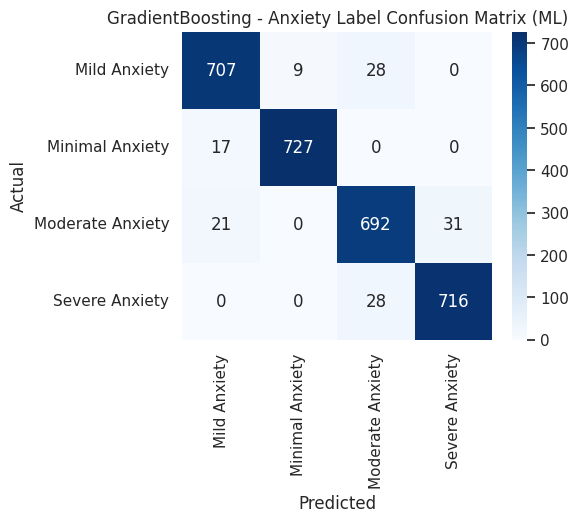

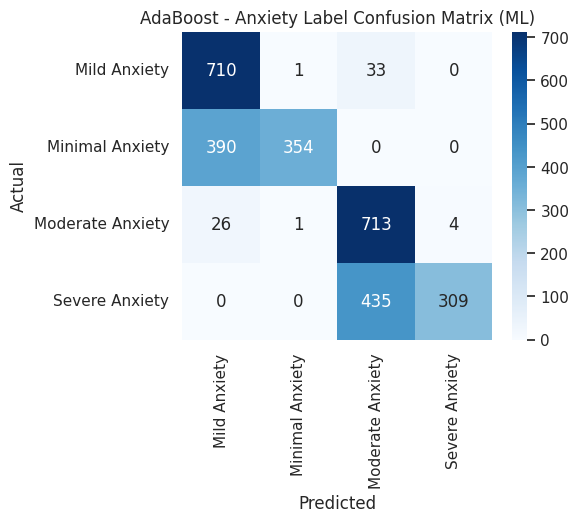

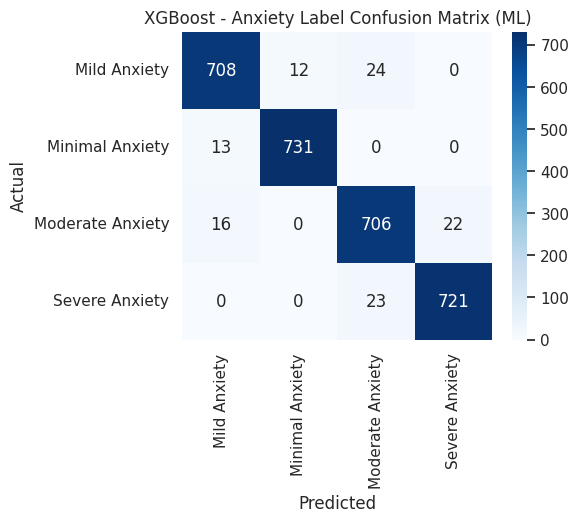

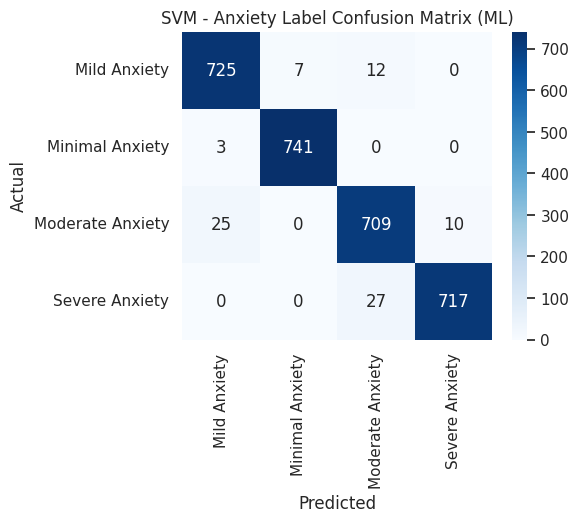

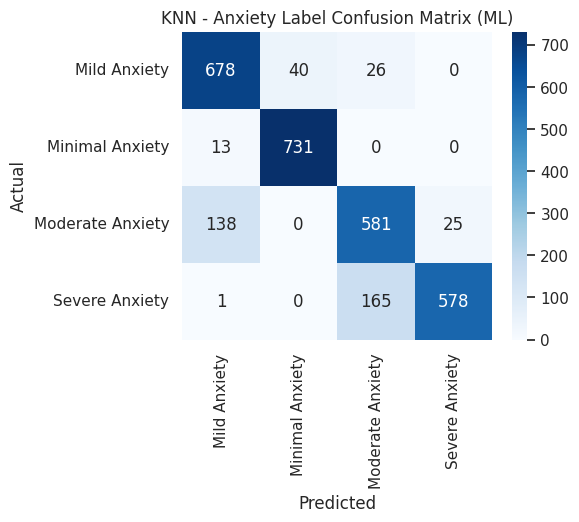

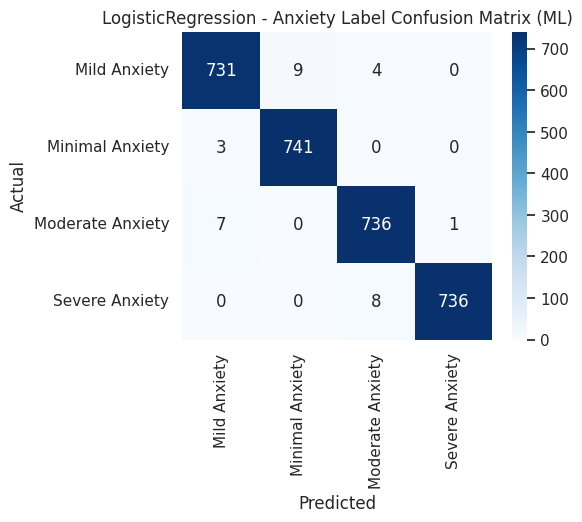

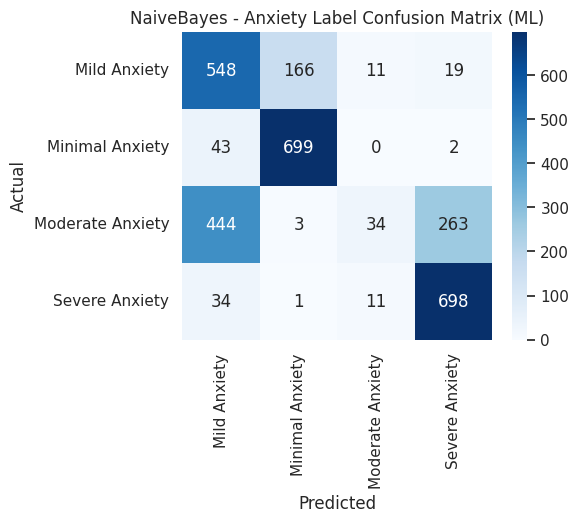

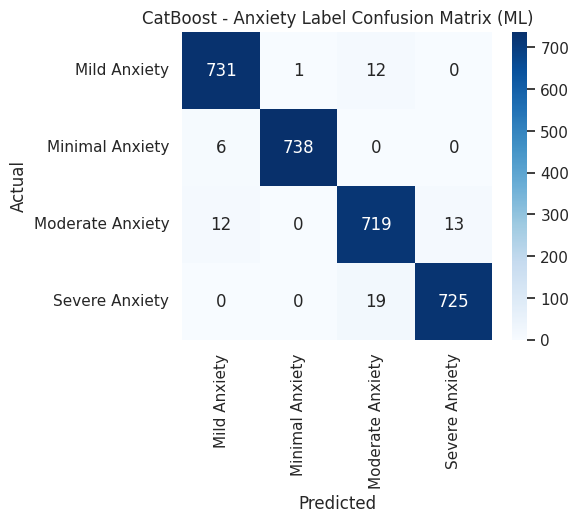

,Accuracy,F1-weighted,Precision-weighted,Recall-weighted
Model,,,,
DecisionTree,0.878360,0.878358,0.878421,0.878360
RandomForest,0.933132,0.933439,0.933918,0.933132
GradientBoosting,0.954973,0.955027,0.955100,0.954973
AdaBoost,0.700941,0.682112,0.803970,0.700941
XGBoost,0.963038,0.963064,0.963118,0.963038
SVM,0.971774,0.971788,0.971891,0.971774
KNN,0.862903,0.862803,0.869030,0.862903
LogisticRegression,0.989247,0.989249,0.989276,0.989247
NaiveBayes,0.664987,0.591259,0.658735,0.664987


Best ML Model: LogisticRegression


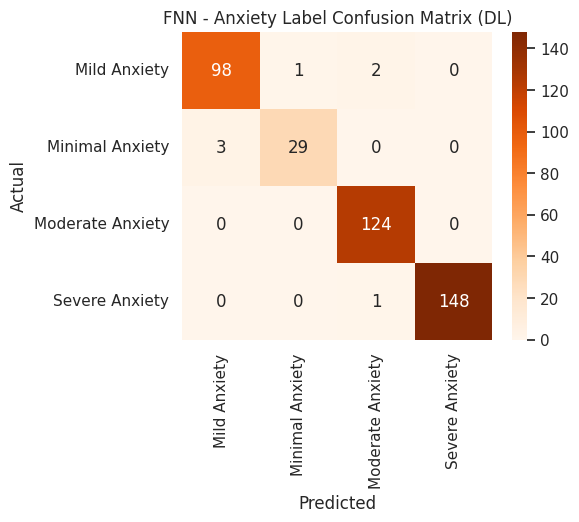

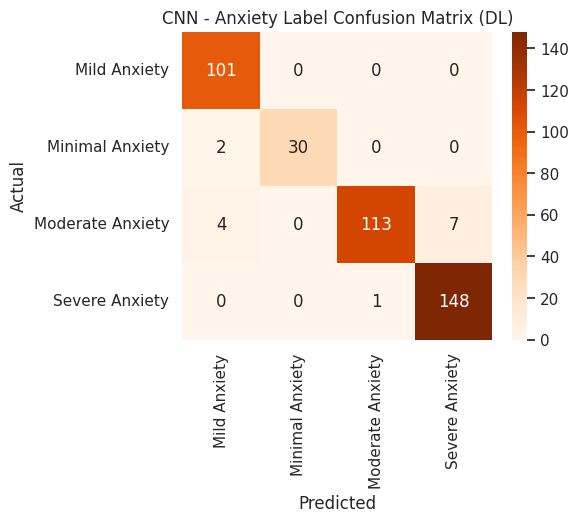

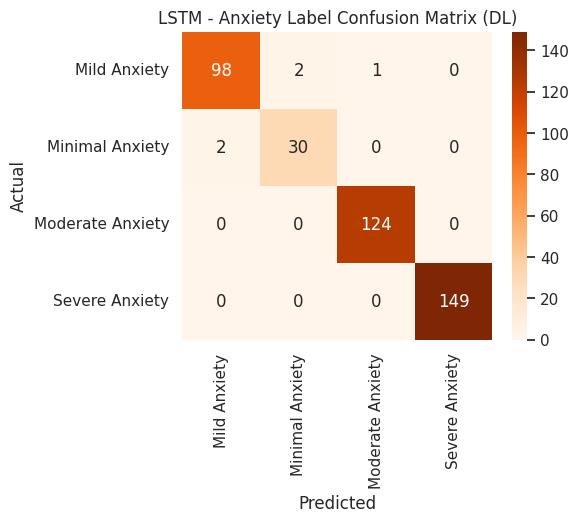

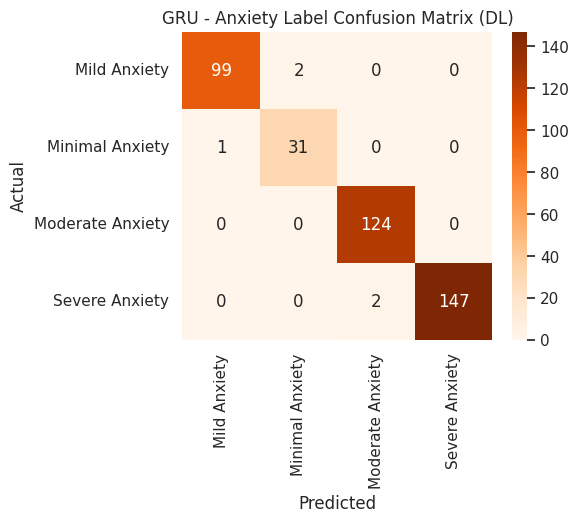

,Accuracy,F1-weighted,Precision-weighted,Recall-weighted
Model,,,,
FNN,0.982759,0.982640,0.982769,0.982759
CNN,0.965517,0.965224,0.966797,0.965517
LSTM,0.987685,0.987659,0.987655,0.987685
GRU,0.987685,0.987726,0.987888,0.987685


Best DL Model: GRU
Best hyperparameters: {'C': 10}


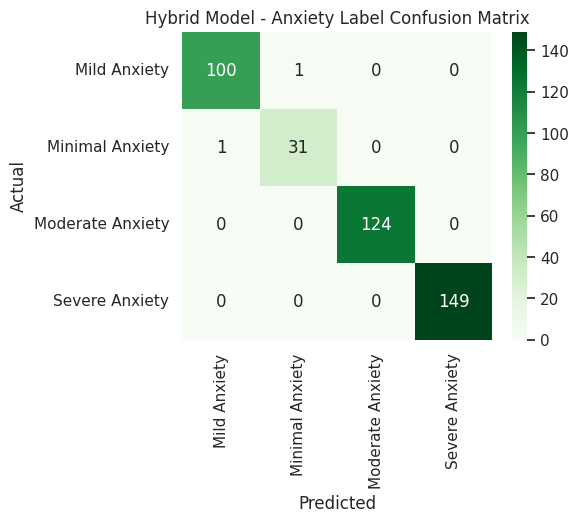

,Accuracy,F1-weighted,Precision-weighted,Recall-weighted
Model,,,,
Hybrid (LogisticRegression+GRU),0.995074,0.995074,0.995074,0.995074


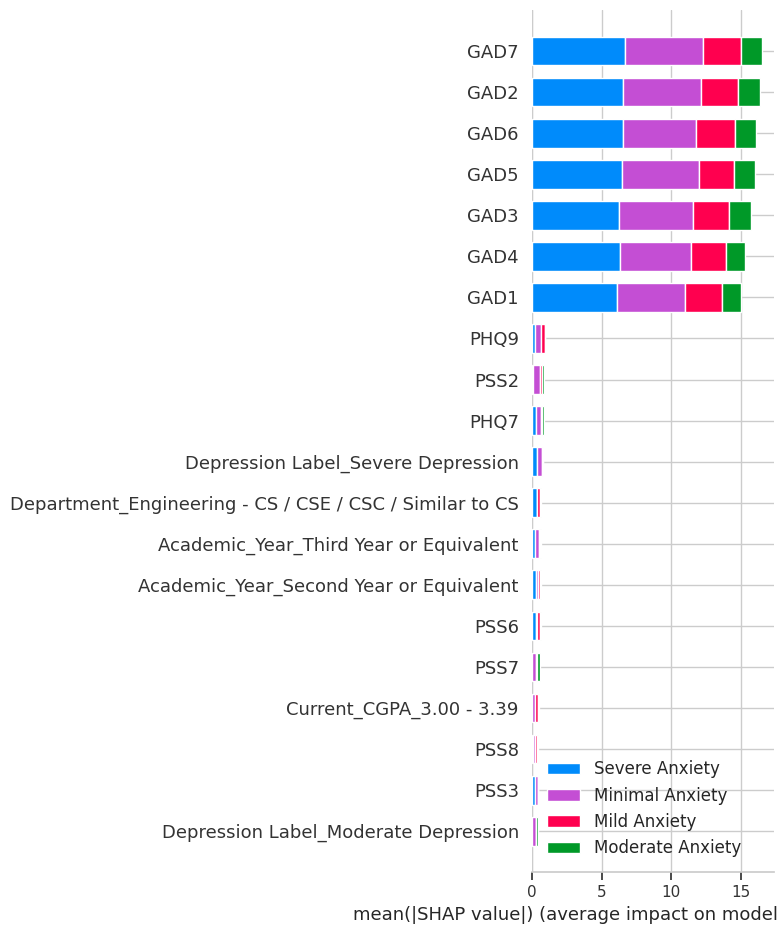

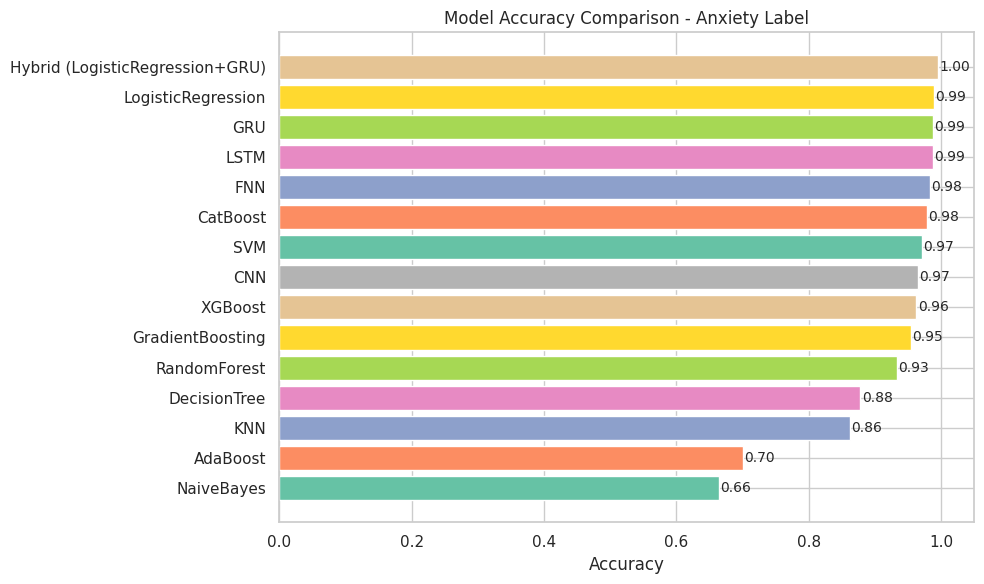

In [ ]:
!pip install torchviz shap imbalanced-learn -q

# ===============================
# IMPORTS
# ===============================
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import TensorDataset, DataLoader

from sklearn.model_selection import StratifiedKFold, cross_val_predict, train_test_split, GridSearchCV
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.metrics import classification_report, confusion_matrix, f1_score, accuracy_score, precision_score, recall_score
from sklearn.base import clone
import warnings
warnings.filterwarnings("ignore", category=UserWarning)
warnings.simplefilter(action='ignore', category=FutureWarning)

# ML models
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from imblearn.over_sampling import SMOTE

# Visualizations
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="whitegrid")
from torchviz import make_dot
import shap

# ===============================
# RANDOM SEED
# ===============================
RANDOM_STATE = 42
torch.manual_seed(RANDOM_STATE)
np.random.seed(RANDOM_STATE)

# ===============================
# LOAD DATA
# ===============================
# Use the 'path' variable obtained from kagglehub.dataset_download
DATA_PATH = os.path.join(path, "Processed.csv")
df = pd.read_csv(DATA_PATH)

# ===============================
# FEATURES & TARGETS
# ===============================
X = df.drop(columns=[
    'Stress Label', 'Stress Value',
    'Anxiety Label', 'Anxiety Value'

])
targets = ['Stress Label', 'Anxiety Label'
          ]

# ===============================
# PREPROCESSING
# ===============================
num_cols = X.select_dtypes(include=np.number).columns
cat_cols = X.select_dtypes(include='object').columns

# Impute missing values
X[num_cols] = SimpleImputer(strategy='median').fit_transform(X[num_cols])
X[cat_cols] = SimpleImputer(strategy='most_frequent').fit_transform(X[cat_cols])

# Encode categorical
for col in cat_cols:
    if X[col].nunique() == 2:
        X[col] = LabelEncoder().fit_transform(X[col])
    else:
        X = pd.get_dummies(X, columns=[col], drop_first=True)

# Scale numeric
X[num_cols] = StandardScaler().fit_transform(X[num_cols])
X_np = X.values.astype(np.float32)

# ===============================
# ML MODELS
# ===============================
models = {
    "DecisionTree": DecisionTreeClassifier(random_state=RANDOM_STATE),
    "RandomForest": RandomForestClassifier(random_state=RANDOM_STATE),
    "GradientBoosting": GradientBoostingClassifier(random_state=RANDOM_STATE),
    "AdaBoost": AdaBoostClassifier(random_state=RANDOM_STATE),
    "XGBoost": XGBClassifier(eval_metric='mlogloss', random_state=RANDOM_STATE),
    "SVM": SVC(probability=True, random_state=RANDOM_STATE),
    "KNN": KNeighborsClassifier(),
    "LogisticRegression": LogisticRegression(max_iter=1000, random_state=RANDOM_STATE),
    "NaiveBayes": GaussianNB(),
    "CatBoost": CatBoostClassifier(verbose=0, random_state=RANDOM_STATE)
}

# Hyperparameter grids
param_grids = {
    "DecisionTree": {"max_depth": [3, 5, 10, None], "min_samples_split": [2, 5, 10]},
    "RandomForest": {"n_estimators": [50, 100], "max_depth": [5, 10, None]},
    "GradientBoosting": {"n_estimators": [50, 100], "learning_rate": [0.01, 0.1], "max_depth": [3, 5]},
    "AdaBoost": {"n_estimators": [50, 100], "learning_rate": [0.01, 0.1]},
    "XGBoost": {"n_estimators": [50, 100], "learning_rate": [0.01, 0.1], "max_depth": [3, 5]},
    "SVM": {"C": [0.1, 1, 10], "kernel": ["linear", "rbf"]},
    "KNN": {"n_neighbors": [3, 5, 7]},
    "LogisticRegression": {"C": [0.1, 1, 10]},
    "NaiveBayes": {},
    "CatBoost": {"iterations": [50, 100], "learning_rate": [0.01, 0.1]}
}

# ===============================
# DEEP LEARNING MODELS
# ===============================
class FNN(nn.Module):
    def __init__(self, input_dim, output_dim, hidden_dim=64):
        super(FNN, self).__init__()
        self.fc1 = nn.Linear(input_dim, hidden_dim)
        self.fc2 = nn.Linear(hidden_dim, hidden_dim)
        self.out = nn.Linear(hidden_dim, output_dim)
    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        return self.out(x)

class CNN(nn.Module):
    def __init__(self, input_dim, output_dim):
        super(CNN, self).__init__()
        self.conv1 = nn.Conv1d(1, 16, 3, padding=1)
        self.conv2 = nn.Conv1d(16, 32, 3, padding=1)
        self.fc = nn.Linear(32*input_dim, output_dim)
    def forward(self, x):
        x = x.unsqueeze(1)
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        x = x.view(x.size(0), -1)
        return self.fc(x)

class LSTM(nn.Module):
    def __init__(self, input_dim, output_dim, hidden_dim=64):
        super(LSTM, self).__init__()
        self.lstm = nn.LSTM(input_dim, hidden_dim, batch_first=True)
        self.fc = nn.Linear(hidden_dim, output_dim)
    def forward(self, x):
        x = x.unsqueeze(1)
        out, _ = self.lstm(x)
        return self.fc(out[:, -1, :])

class GRU(nn.Module):
    def __init__(self, input_dim, output_dim, hidden_dim=64):
        super(GRU, self).__init__()
        self.gru = nn.GRU(input_dim, hidden_dim, batch_first=True)
        self.fc = nn.Linear(hidden_dim, output_dim)
    def forward(self, x):
        x = x.unsqueeze(1)
        out, _ = self.gru(x)
        return self.fc(out[:, -1, :])



def create_loader(X, y, batch_size=32):
    dataset = TensorDataset(torch.tensor(X, dtype=torch.float32),
                            torch.tensor(y, dtype=torch.long))
    return DataLoader(dataset, batch_size=batch_size, shuffle=True)

def train_dl(model, X, y, epochs=20, lr=0.001):
    loader = create_loader(X, y)
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    model.train()
    for _ in range(epochs):
        for xb, yb in loader:
            optimizer.zero_grad()
            loss = criterion(model(xb), yb)
            loss.backward()
            optimizer.step()
    return model

# ===============================
# TRAINING AND EVALUATION
# ===============================
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=RANDOM_STATE)

for target_col in targets:
    print(f"\n===== TARGET: {target_col} =====")

    # Encode target
    y = df[target_col].values
    le = LabelEncoder()
    y_encoded = le.fit_transform(y)
    class_names = le.classes_
    num_classes = len(class_names)

    # ----------------------
    # ML MODELS
    # ----------------------
    ml_results = []
    for name, model in models.items():
        sm = SMOTE(random_state=RANDOM_STATE)
        X_res, y_res = sm.fit_resample(X_np, y_encoded)
        y_pred = cross_val_predict(model, X_res, y_res, cv=kf)

        report = classification_report(y_res, y_pred, output_dict=True, zero_division=0)
        ml_results.append({
            'Model': name,
            'Accuracy': report['accuracy'],
            'F1-weighted': report['weighted avg']['f1-score'],
            'Precision-weighted': report['weighted avg']['precision'],
            'Recall-weighted': report['weighted avg']['recall']
        })

        cm = confusion_matrix(y_res, y_pred)
        plt.figure(figsize=(5,4))
        sns.heatmap(cm, annot=True, fmt='d', xticklabels=class_names, yticklabels=class_names, cmap='Blues')
        plt.title(f"{name} - {target_col} Confusion Matrix (ML)")
        plt.xlabel("Predicted")
        plt.ylabel("Actual")
        plt.show()

    ml_df = pd.DataFrame(ml_results).set_index('Model')
    display(ml_df)
    best_ml_name = ml_df['F1-weighted'].idxmax()
    print(f"Best ML Model: {best_ml_name}")

    # ----------------------
    # DL MODELS
    # ----------------------
    Xtr, Xte, ytr, yte = train_test_split(X_np, y_encoded, test_size=0.2, stratify=y_encoded, random_state=RANDOM_STATE)
    dl_models = {"FNN": FNN, "CNN": CNN, "LSTM": LSTM, "GRU": GRU,}

    dl_results = []
    dl_trained = {}

    for name, cls in dl_models.items():
        model = cls(X_np.shape[1], num_classes)
        model = train_dl(model, Xtr, ytr, epochs=15)
        model.eval()
        y_prob = torch.softmax(model(torch.tensor(Xte)),1).detach().numpy()
        y_pred = y_prob.argmax(1)

        report = classification_report(yte, y_pred, output_dict=True, zero_division=0)
        dl_results.append({
            'Model': name,
            'Accuracy': report['accuracy'],
            'F1-weighted': report['weighted avg']['f1-score'],
            'Precision-weighted': report['weighted avg']['precision'],
            'Recall-weighted': report['weighted avg']['recall']
        })
        dl_trained[name] = model

        cm = confusion_matrix(yte, y_pred)
        plt.figure(figsize=(5,4))
        sns.heatmap(cm, annot=True, fmt='d', xticklabels=class_names, yticklabels=class_names, cmap='Oranges')
        plt.title(f"{name} - {target_col} Confusion Matrix (DL)")
        plt.xlabel("Predicted")
        plt.ylabel("Actual")
        plt.show()

    dl_df = pd.DataFrame(dl_results).set_index('Model')
    display(dl_df)
    best_dl_name = dl_df['F1-weighted'].idxmax()
    print(f"Best DL Model: {best_dl_name}")

    # ----------------------
    # Hyperparameter tuning for best ML model
    # ----------------------
    best_model = models[best_ml_name]
    if best_ml_name in param_grids and param_grids[best_ml_name]:
        grid = GridSearchCV(best_model, param_grids[best_ml_name], cv=5, scoring='f1_weighted', n_jobs=-1)
        grid.fit(Xtr, ytr)
        best_ml_model = grid.best_estimator_
        print(f"Best hyperparameters: {grid.best_params_}")
    else:
        best_ml_model = clone(best_model)
        best_ml_model.fit(Xtr, ytr)

    # ----------------------
    # HYBRID MODEL
    # ----------------------
    best_dl_model = dl_trained[best_dl_name]

    if hasattr(best_ml_model, "predict_proba"):
        ml_prob = best_ml_model.predict_proba(Xte)
    else:
        ml_prob = best_ml_model.decision_function(Xte)
        ml_prob = np.exp(ml_prob)/np.sum(np.exp(ml_prob), axis=1, keepdims=True)

    dl_prob = torch.softmax(best_dl_model(torch.tensor(Xte)),1).detach().numpy()
    hybrid_prob = (ml_prob + dl_prob)/2
    hybrid_pred = hybrid_prob.argmax(1)

    cm = confusion_matrix(yte, hybrid_pred)
    plt.figure(figsize=(5,4))
    sns.heatmap(cm, annot=True, fmt='d', xticklabels=class_names, yticklabels=class_names, cmap='Greens')
    plt.title(f"Hybrid Model - {target_col} Confusion Matrix")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

    hybrid_acc = accuracy_score(yte, hybrid_pred)
    hybrid_prec = precision_score(yte, hybrid_pred, average='weighted', zero_division=0)
    hybrid_rec = recall_score(yte, hybrid_pred, average='weighted', zero_division=0)
    hybrid_f1 = f1_score(yte, hybrid_pred, average='weighted', zero_division=0)

    hybrid_df = pd.DataFrame([{
        'Model': f'Hybrid ({best_ml_name}+{best_dl_name})',
        'Accuracy': hybrid_acc,
        'F1-weighted': hybrid_f1,
        'Precision-weighted': hybrid_prec,
        'Recall-weighted': hybrid_rec
    }]).set_index('Model')
    display(hybrid_df)

    # ----------------------
    # SHAP VALUES (Best Tuned ML Model)
    # ----------------------
    explainer = shap.Explainer(best_ml_model, Xtr)
    shap_values = explainer(Xte)

    plt.figure(figsize=(12, 8))
    shap.summary_plot(shap_values, Xte, feature_names=X.columns, class_names=class_names, show=False)
    plt.tight_layout()
    plt.show()

    # ===============================
    # HORIZONTAL BAR PLOT - ACCURACY
    # ===============================
    all_results = pd.concat([ml_df[['Accuracy']], dl_df[['Accuracy']], hybrid_df[['Accuracy']]])
    all_results = all_results.sort_values('Accuracy')

    plt.figure(figsize=(10,6))
    bars = plt.barh(all_results.index, all_results['Accuracy'], color=sns.color_palette("Set2", len(all_results)))

    for bar in bars:
        width = bar.get_width()
        plt.text(width + 0.002, bar.get_y() + bar.get_height()/2, f"{width:.2f}",
                 va='center', ha='left', fontsize=10)

    plt.xlabel("Accuracy")
    plt.title(f"Model Accuracy Comparison - {target_col}")
    plt.xlim(0, 1.05)
    plt.tight_layout()
    plt.show()

# Parcentage

            Students  Percentage (%)
Stress          1863           91.86
Depression       142            7.00
Anxiety           23            1.13


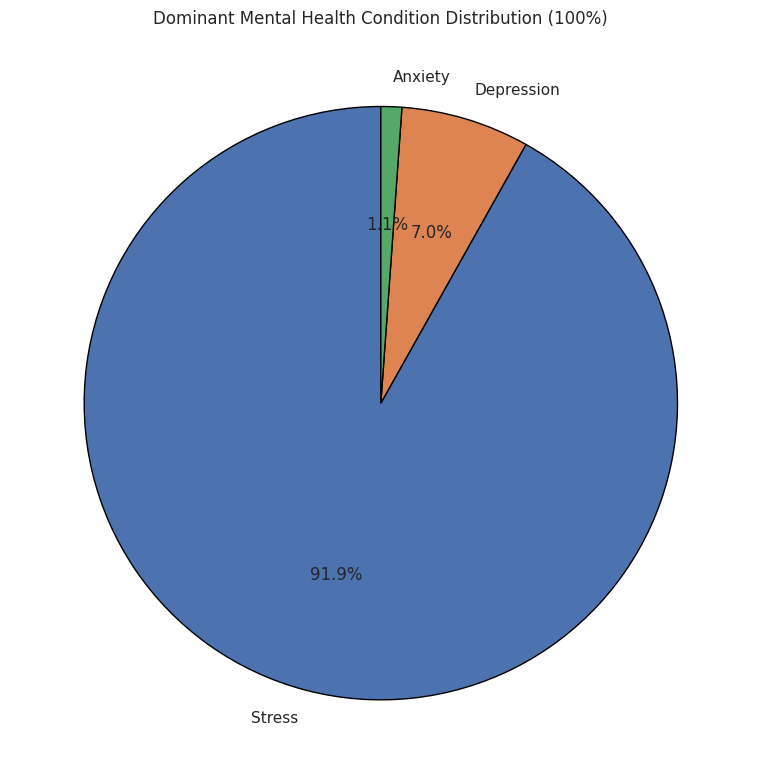

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load data
df = pd.read_csv(DATA_PATH)

# Find dominant condition per student
dominant = df[["Stress Value", "Anxiety Value", "Depression Value"]].idxmax(axis=1)

# Rename for clarity
dominant = dominant.replace({
    "Stress Value": "Stress",
    "Anxiety Value": "Anxiety",
    "Depression Value": "Depression"
})

# Count students per dominant condition
dominant_counts = dominant.value_counts()
dominant_percent = dominant_counts / len(df) * 100

summary = pd.DataFrame({
    "Students": dominant_counts,
    "Percentage (%)": dominant_percent.round(2)
})

print(summary)

# 100% Pie chart
plt.figure(figsize=(8,8))
plt.pie(
    dominant_percent,
    labels=dominant_percent.index,
    autopct="%1.1f%%",
    startangle=90,
    wedgeprops={"edgecolor": "black"}
)
plt.title("Dominant Mental Health Condition Distribution (100%)")
plt.tight_layout()
plt.show()

# For depression high accuracy

Using Colab cache for faster access to the 'public-private-university-student' dataset.
Classes: ['Mild Depression' 'Minimal Depression' 'Moderate Depression'
 'Moderately Severe Depression' 'No Depression' 'Severe Depression']
DecisionTree best params: {'max_depth': 5, 'min_samples_split': 2}
RandomForest best params: {'max_depth': 5, 'n_estimators': 50}
GradientBoosting best params: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50}
AdaBoost best params: {'learning_rate': 0.1, 'n_estimators': 50}
XGBoost best params: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50}
SVM best params: {'C': 1, 'kernel': 'linear'}
KNN best params: {'n_neighbors': 3}
LogisticRegression best params: {'C': 1}
CatBoost best params: {'iterations': 50, 'learning_rate': 0.1}


,Accuracy,F1-weighted,Precision-weighted,Recall-weighted
Model,,,,
DecisionTree,0.763209,0.761199,0.761860,0.763209
RandomForest,0.850946,0.848798,0.850732,0.850946
GradientBoosting,0.889106,0.889272,0.889767,0.889106
AdaBoost,0.510763,0.455367,0.472188,0.510763
XGBoost,0.860404,0.858664,0.860075,0.860404
SVM,0.994129,0.994129,0.994132,0.994129
KNN,0.820287,0.816968,0.819522,0.820287
LogisticRegression,0.961513,0.961461,0.961969,0.961513
NaiveBayes,0.776582,0.778434,0.781041,0.776582


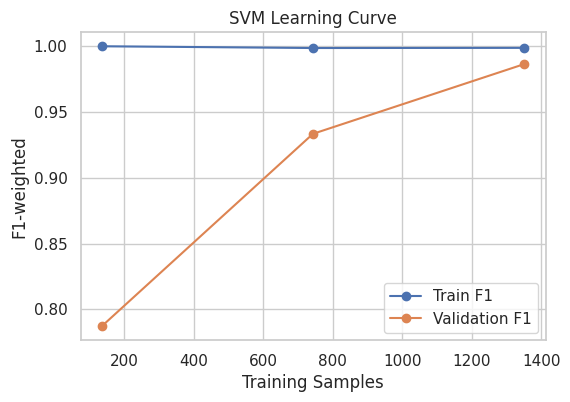

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


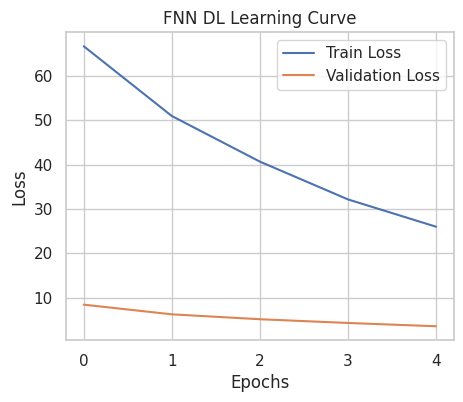

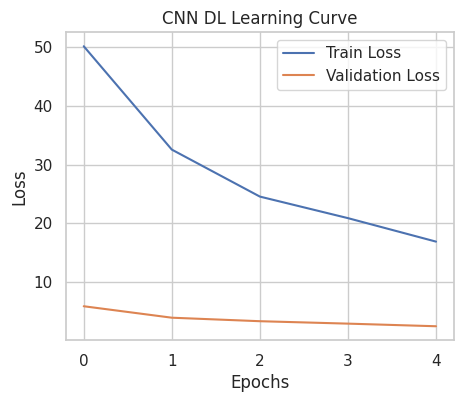

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


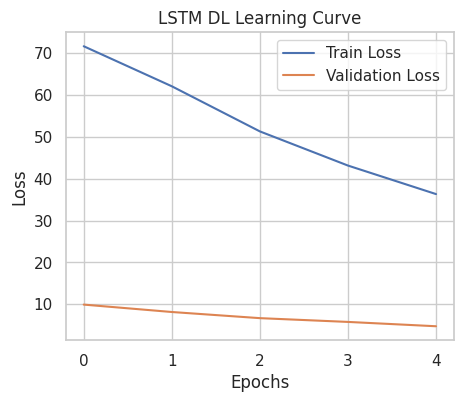

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


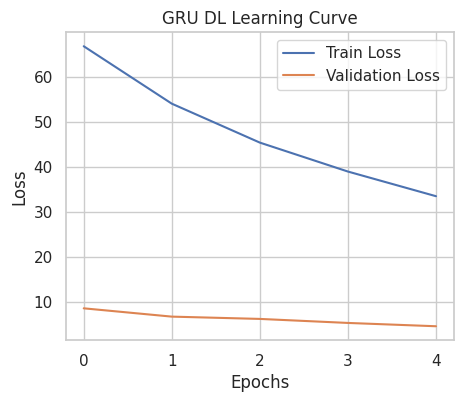

,Model,Accuracy,F1-weighted,Precision-weighted,Recall-weighted
0,FNN,0.832512,0.805363,0.787745,0.832512
1,CNN,0.842365,0.836589,0.856526,0.842365
2,LSTM,0.748768,0.719433,0.713325,0.748768
3,GRU,0.738916,0.710673,0.698366,0.738916


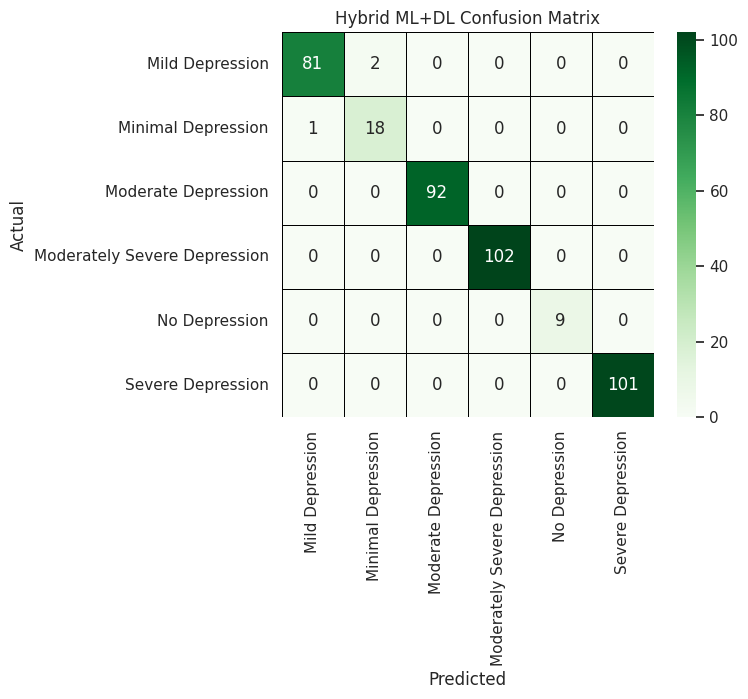

,Model,Accuracy,F1-weighted,Precision-weighted,Recall-weighted
0,Hybrid ML+DL,0.992611,0.992683,0.992827,0.992611


ML Confusion Matrices:


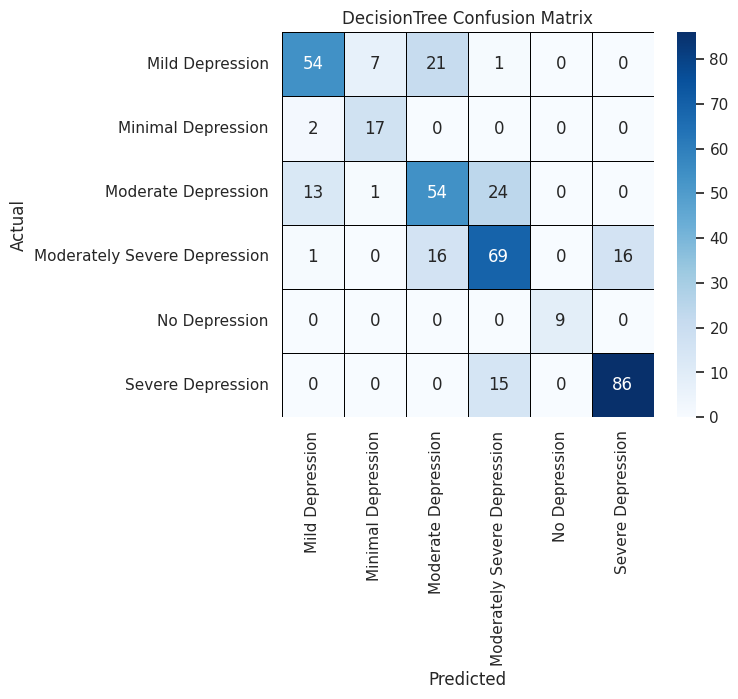

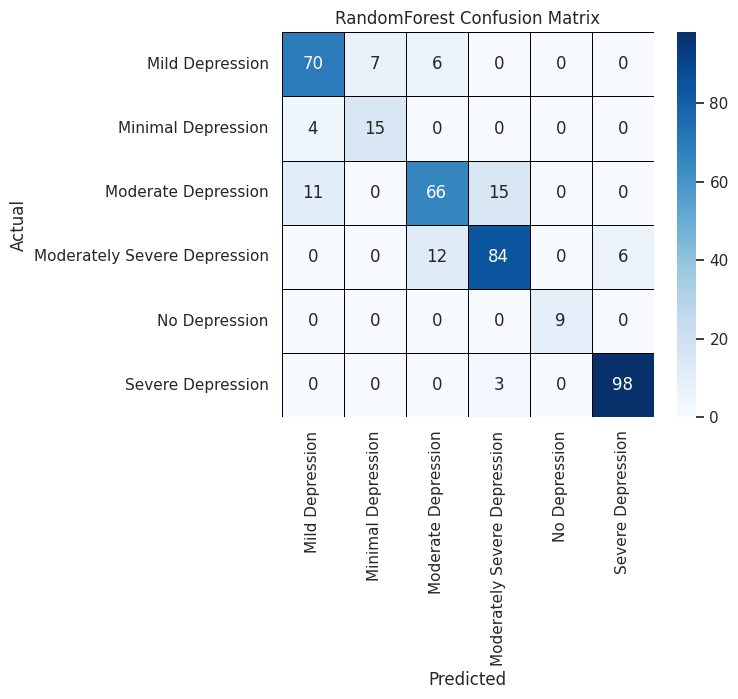

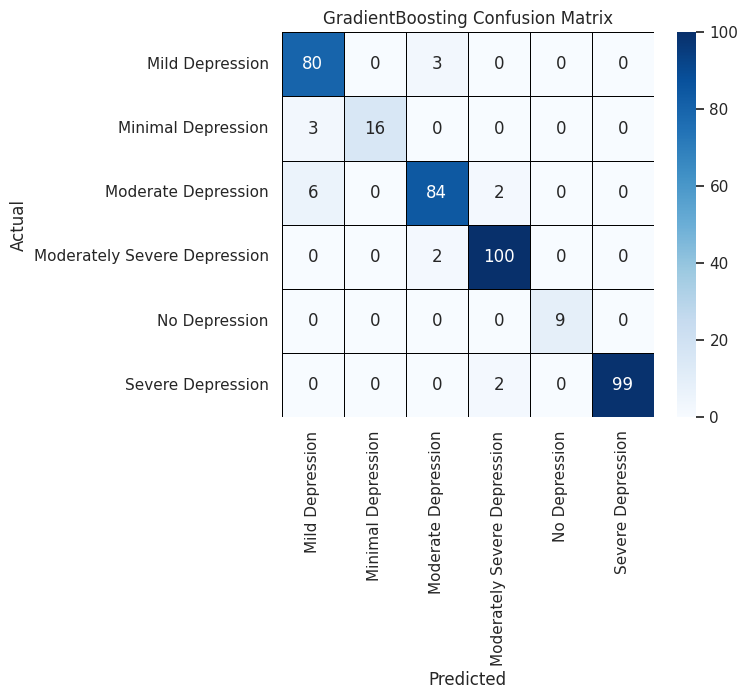

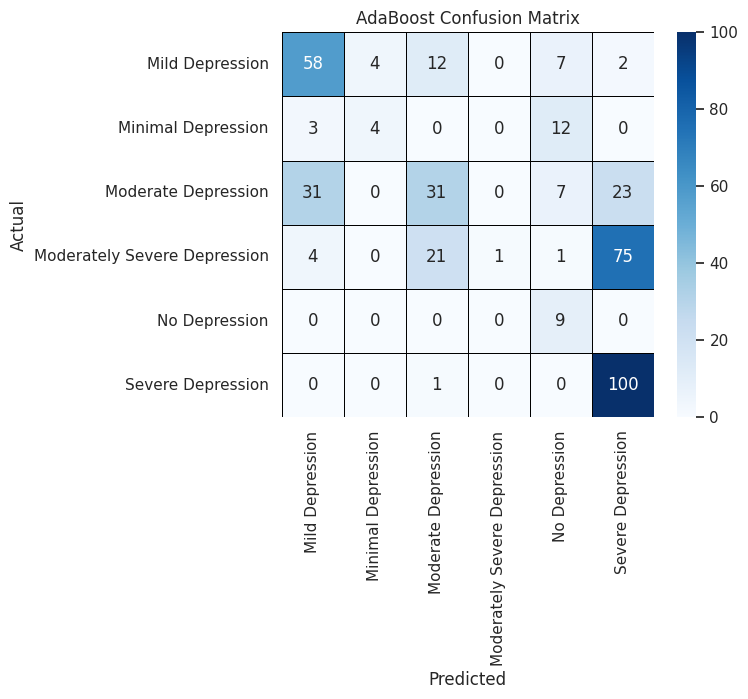

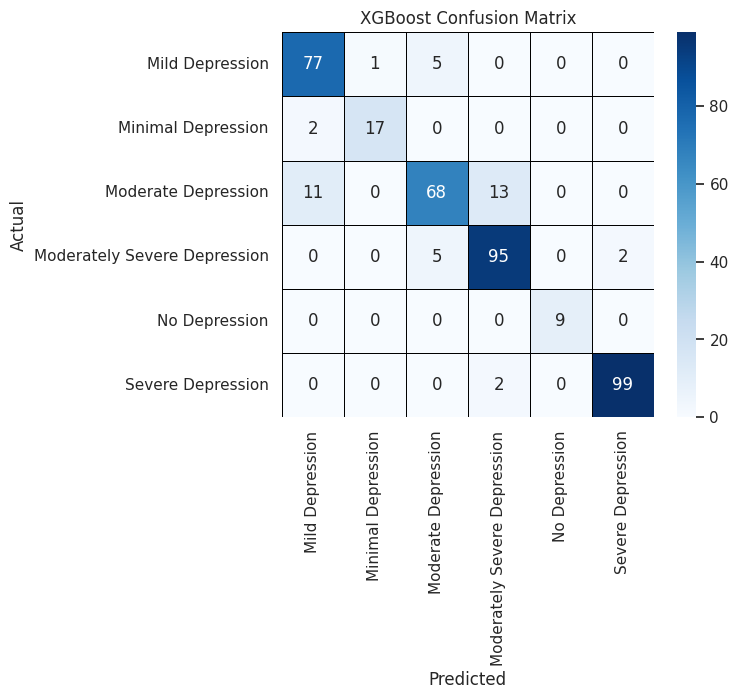

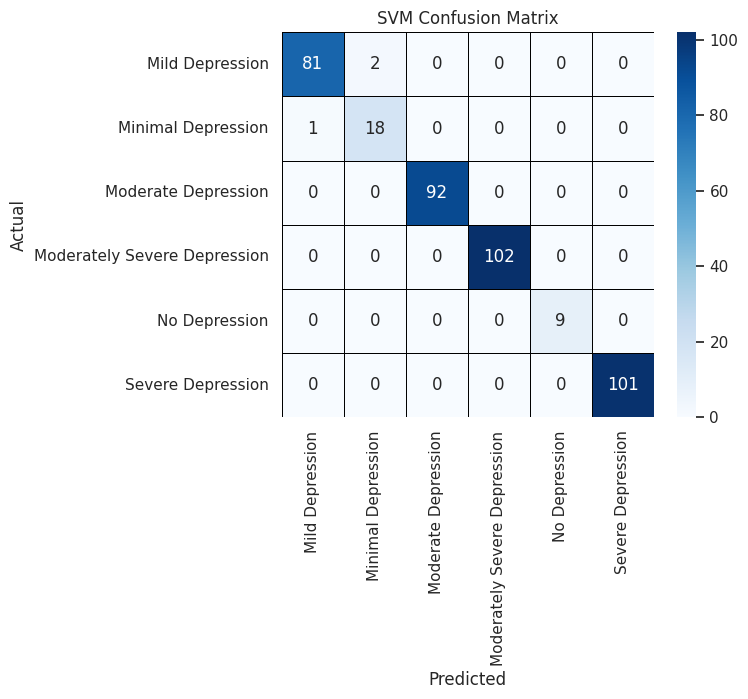

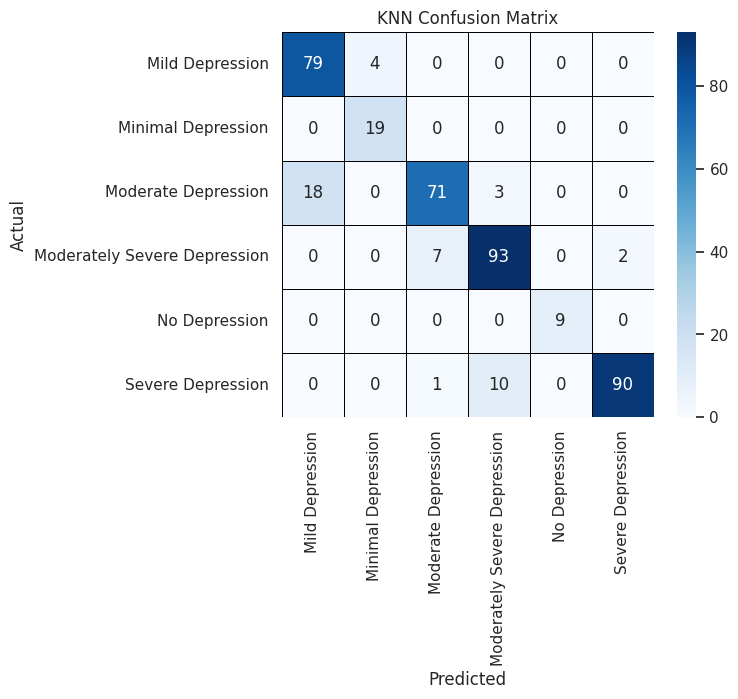

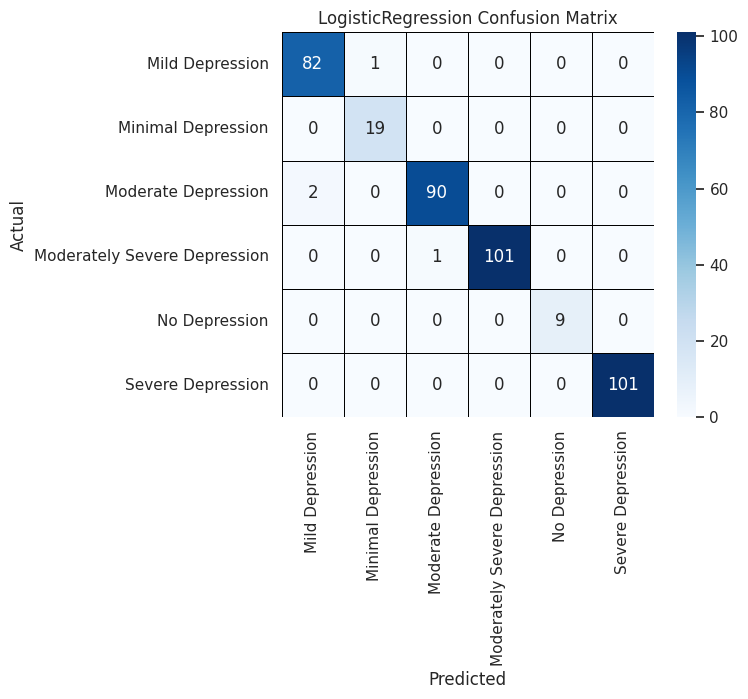

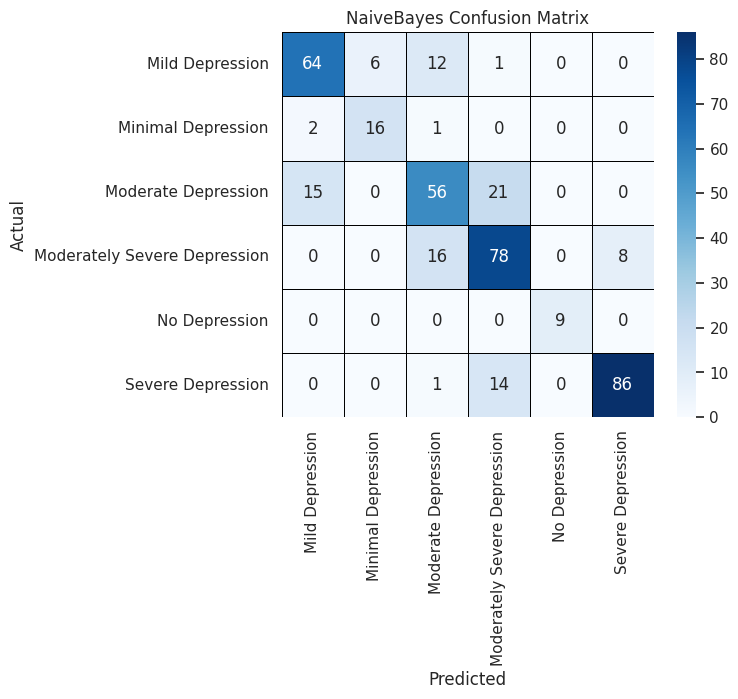

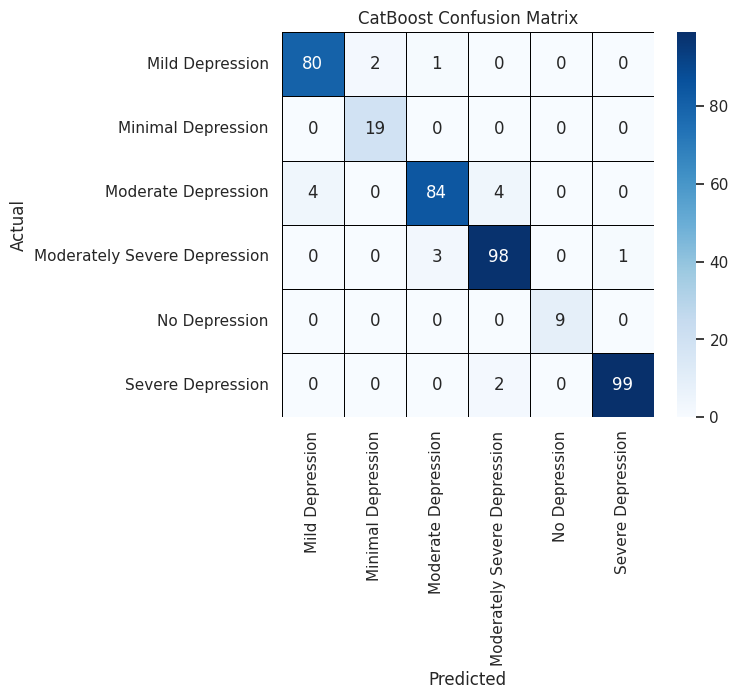

DL Confusion Matrices:


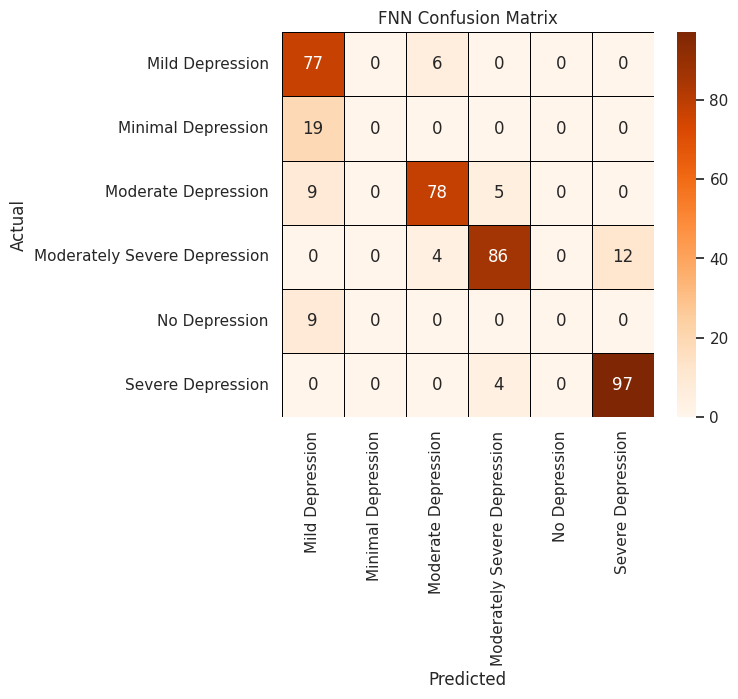

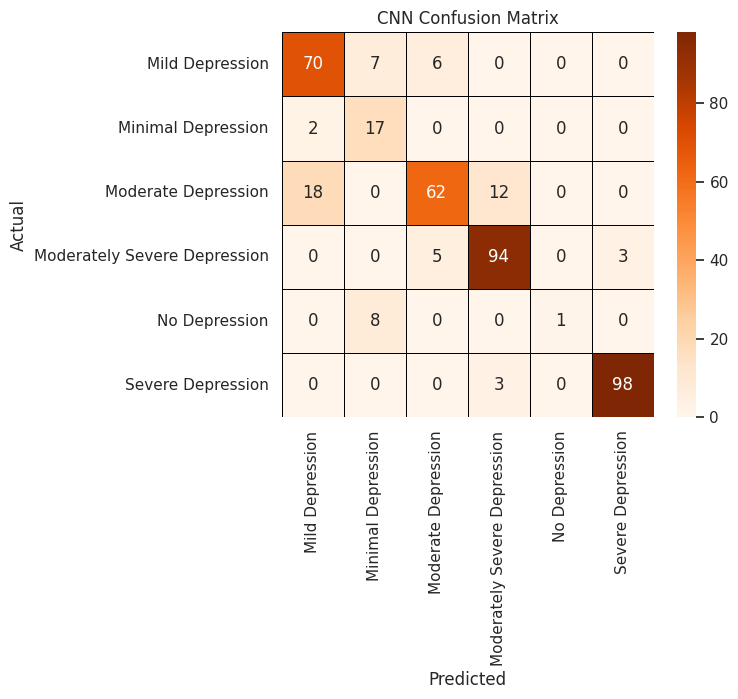

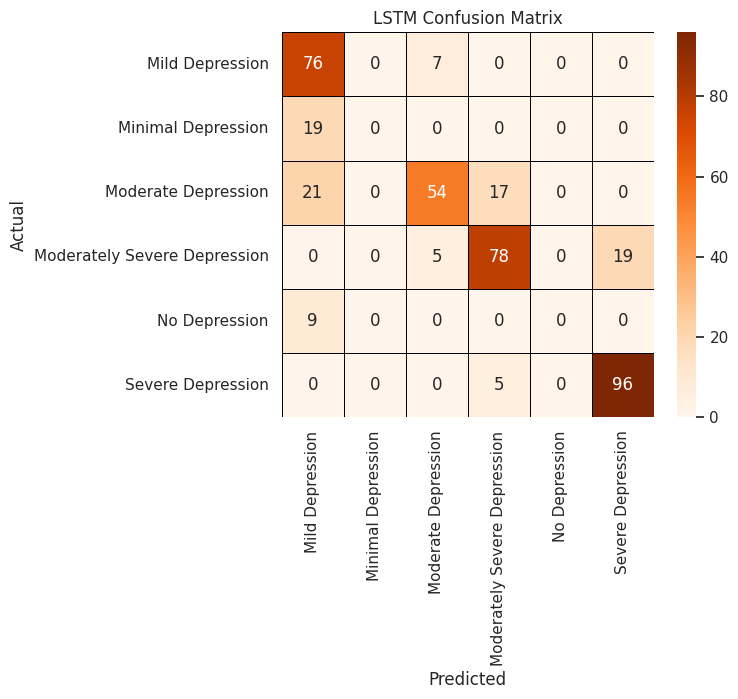

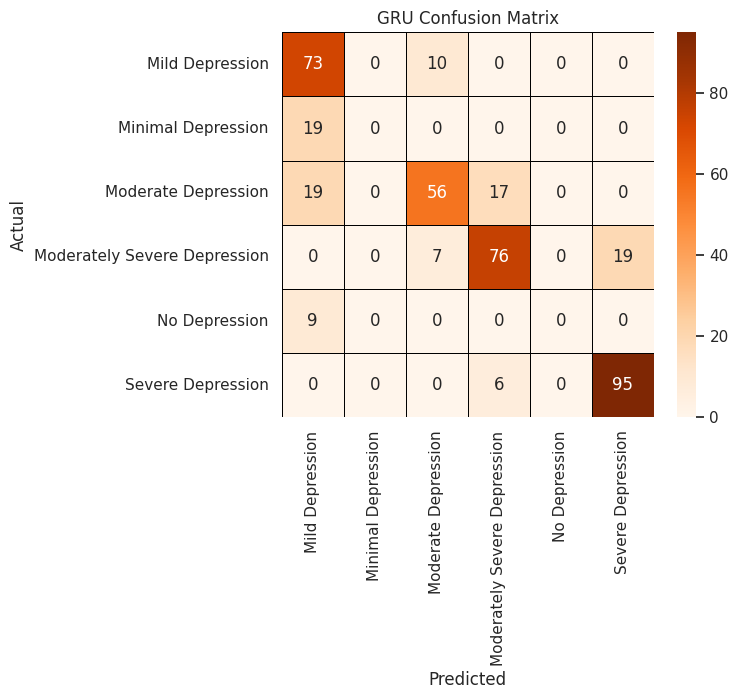

,Accuracy,F1-weighted,Precision-weighted,Recall-weighted,Type,Model
Model,,,,,,
SVM,0.994129,0.994129,0.994132,0.994129,ML,nan
Hybrid ML+DL,0.992611,0.992683,0.992827,0.992611,Hybrid,Hybrid ML+DL
LogisticRegression,0.961513,0.961461,0.961969,0.961513,ML,nan
CatBoost,0.915851,0.915678,0.916274,0.915851,ML,nan
GradientBoosting,0.889106,0.889272,0.889767,0.889106,ML,nan
XGBoost,0.860404,0.858664,0.860075,0.860404,ML,nan
RandomForest,0.850946,0.848798,0.850732,0.850946,ML,nan
CNN,0.842365,0.836589,0.856526,0.842365,DL,CNN
KNN,0.820287,0.816968,0.819522,0.820287,ML,nan


✅ Best ML Model: SVM
✅ Best DL Model: CNN
✅ Best Hybrid Model: Hybrid ML+DL


In [ ]:
# ===============================
# INSTALL
# ===============================
!pip install torchviz shap imbalanced-learn xgboost catboost -q

# ===============================
# IMPORTS
# ===============================
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader

from sklearn.model_selection import StratifiedKFold, cross_val_predict, train_test_split, GridSearchCV, learning_curve
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score

from sklearn.feature_selection import SelectKBest, f_classif, SelectFromModel
from sklearn.base import clone

# ML models
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from xgboost import XGBClassifier
from catboost import CatBoostClassifier

# SMOTE
from imblearn.over_sampling import BorderlineSMOTE

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="whitegrid")

# ===============================
# RANDOM SEED
# ===============================
RANDOM_STATE = 42
np.random.seed(RANDOM_STATE)
torch.manual_seed(RANDOM_STATE)

# ===============================
# LOAD DATA
# ===============================
import os
import kagglehub
# Re-download the dataset to ensure 'path' is defined in this scope
path = kagglehub.dataset_download("puspitahelal/public-private-university-student")
DATA_PATH = os.path.join(path, "Processed.csv")
df = pd.read_csv(DATA_PATH)

# ===============================
# FEATURES & TARGETS
# ===============================
target_col = "Depression Label"
X = df.drop(columns=[
    'Stress Label','Stress Value',
    'Anxiety Label','Anxiety Value',
    'Depression Label','Depression Value'
])

# ===============================
# PREPROCESSING
# ===============================
num_cols = X.select_dtypes(include=np.number).columns
cat_cols = X.select_dtypes(include='object').columns

# Impute missing
X[num_cols] = SimpleImputer(strategy='median').fit_transform(X[num_cols])
X[cat_cols] = SimpleImputer(strategy='most_frequent').fit_transform(X[cat_cols])

# Encode categorical
for col in cat_cols:
    if X[col].nunique() == 2:
        X[col] = LabelEncoder().fit_transform(X[col])
    else:
        X = pd.get_dummies(X, columns=[col], drop_first=True)

# Scale numeric
X[num_cols] = StandardScaler().fit_transform(X[num_cols])
X_np = X.values.astype(np.float32)

# Encode target numerically
le = LabelEncoder()
y = le.fit_transform(df[target_col])
n_classes = len(np.unique(y))
print("Classes:", le.classes_)

# ===============================
# FEATURE SELECTION
# ===============================
def anova_selection(X, y, k=30):
    selector = SelectKBest(f_classif, k=min(k,X.shape[1]))
    selector.fit(X, y)
    return X.columns[selector.get_support()]

def embedded_rf_selection(X, y):
    rf = RandomForestClassifier(random_state=RANDOM_STATE)
    selector = SelectFromModel(rf)
    selector.fit(X, y)
    return X.columns[selector.get_support()]

def embedded_l1_selection(X, y):
    l1 = LogisticRegression(penalty='l1', solver='liblinear', C=0.1, max_iter=500)
    selector = SelectFromModel(l1)
    selector.fit(X, y)
    return X.columns[selector.get_support()]

def combined_features(X, y):
    f1 = set(anova_selection(X, y))
    f2 = set(embedded_rf_selection(X, y))
    f3 = set(embedded_l1_selection(X, y))
    combined = list(f1 & f2 | f3)
    return X[combined]

X_fs = combined_features(X, y)
X_np = X_fs.values.astype(np.float32)

# ===============================
# ML MODELS & HYPERPARAMS
# ===============================
models = {
    "DecisionTree": DecisionTreeClassifier(random_state=RANDOM_STATE),
    "RandomForest": RandomForestClassifier(random_state=RANDOM_STATE),
    "GradientBoosting": GradientBoostingClassifier(random_state=RANDOM_STATE),
    "AdaBoost": AdaBoostClassifier(random_state=RANDOM_STATE),
    "XGBoost": XGBClassifier(eval_metric='mlogloss', random_state=RANDOM_STATE),
    "SVM": SVC(probability=True),
    "KNN": KNeighborsClassifier(),
    "LogisticRegression": LogisticRegression(max_iter=500),
    "NaiveBayes": GaussianNB(),
    "CatBoost": CatBoostClassifier(verbose=0, random_state=RANDOM_STATE)
}

param_grids = {
    "DecisionTree": {"max_depth":[5], "min_samples_split":[2]},
    "RandomForest": {"n_estimators":[50], "max_depth":[5]},
    "GradientBoosting":{"n_estimators":[50], "learning_rate":[0.1], "max_depth":[3]},
    "AdaBoost":{"n_estimators":[50],"learning_rate":[0.1]},
    "XGBoost":{"n_estimators":[50],"learning_rate":[0.1],"max_depth":[3]},
    "SVM":{"C":[1], "kernel":["linear"]},
    "KNN":{"n_neighbors":[3]},
    "LogisticRegression":{"C":[1]},
    "NaiveBayes":{},
    "CatBoost":{"iterations":[50], "learning_rate":[0.1]}
}

# ===============================
# DL MODELS
# ===============================
class FNN(nn.Module):
    def __init__(self, d, c):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(d,32), nn.ReLU(),
            nn.Linear(32,32), nn.ReLU(),
            nn.Linear(32,c)
        )
    def forward(self, x):
        return self.net(x)

class CNN(nn.Module):
    def __init__(self,d,c):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv1d(1,16,3,padding=1), nn.ReLU(),
            nn.Conv1d(16,32,3,padding=1), nn.ReLU()
        )
        # Fix: Add the fully connected layer here
        self.fc = nn.Linear(32*d,c)
    def forward(self,x):
        x = self.conv(x.unsqueeze(1))
        return self.fc(x.view(x.size(0),-1))

class LSTM(nn.Module):
    def __init__(self,d,c):
        super().__init__()
        self.lstm = nn.LSTM(d,32,batch_first=True)
        self.fc = nn.Linear(32,c)
    def forward(self,x):
        out,_ = self.lstm(x.unsqueeze(1))
        return self.fc(out[:,-1])

class GRU(nn.Module):
    def __init__(self,d,c):
        super().__init__()
        self.gru = nn.GRU(d,32,batch_first=True)
        self.fc = nn.Linear(32,c)
    def forward(self,x):
        out,_ = self.gru(x.unsqueeze(1))
        return self.fc(out[:,-1])

# ===============================
# DATA LOADERS & TRAINING UTILITIES
# ===============================
def create_loader(X, y, bs=32):
    dataset = TensorDataset(torch.tensor(X,dtype=torch.float32),
                            torch.tensor(y,dtype=torch.long))
    return DataLoader(dataset, batch_size=bs, shuffle=True)

def train_dl_with_curve(model, Xtr, ytr, Xval, yval, epochs=5):
    train_loss, val_loss = [], []
    opt = torch.optim.Adam(model.parameters(), lr=0.001)
    loss_fn = nn.CrossEntropyLoss()
    for _ in range(epochs):
        model.train()
        tl = 0
        for xb, yb in create_loader(Xtr, ytr):
            opt.zero_grad()
            loss = loss_fn(model(xb), yb)
            loss.backward()
            opt.step()
            tl += loss.item()
        train_loss.append(tl)

        model.eval()
        vl = 0
        with torch.no_grad():
            for xb, yb in create_loader(Xval, yval, bs=64):
                vl += loss_fn(model(xb), yb).item()
        val_loss.append(vl)
    return model, train_loss, val_loss

def plot_ml_learning_curve(model, X, y, name):
    train_sizes, train_scores, val_scores = learning_curve(
        model, X, y, cv=3, scoring='f1_weighted',
        train_sizes=np.linspace(0.1,1.0,3), n_jobs=-1
    )
    plt.figure(figsize=(6,4))
    plt.plot(train_sizes, train_scores.mean(axis=1),'o-',label='Train F1')
    plt.plot(train_sizes, val_scores.mean(axis=1),'o-',label='Validation F1')
    plt.xlabel("Training Samples"); plt.ylabel("F1-weighted")
    plt.title(f"{name} Learning Curve"); plt.legend(); plt.grid(True); plt.show()

# ===============================
# SMOTE
# ===============================
smote = BorderlineSMOTE(random_state=RANDOM_STATE)
X_res, y_res = smote.fit_resample(X_np, y)

# ===============================
# STRATIFIED K-FOLD
# ===============================
kf = StratifiedKFold(3, shuffle=True, random_state=RANDOM_STATE)

# ===============================
# ML TRAINING & HYPERPARAMETER TUNING
# ===============================
ml_results=[]
ml_best_models={}
for name, model in models.items():
    if name in param_grids and param_grids[name]:
        grid = GridSearchCV(model, param_grids[name], cv=kf, scoring='f1_weighted', n_jobs=-1)
        grid.fit(X_res, y_res)
        best_model = grid.best_estimator_
        print(f"{name} best params:", grid.best_params_)
    else:
        best_model = clone(model).fit(X_res, y_res)
    ml_best_models[name] = best_model
    y_pred = cross_val_predict(best_model, X_res, y_res, cv=kf)
    report = classification_report(y_res, y_pred, output_dict=True, zero_division=0)
    ml_results.append({
        "Model":name,
        "Accuracy":report['accuracy'],
        "F1-weighted":report['weighted avg']['f1-score'],
        "Precision-weighted":report['weighted avg']['precision'],
        "Recall-weighted":report['weighted avg']['recall']
    })
ml_df = pd.DataFrame(ml_results).set_index("Model")
display(ml_df)

# ML Learning Curve for best ML
best_ml_name = ml_df['F1-weighted'].idxmax()
plot_ml_learning_curve(ml_best_models[best_ml_name], X_np, y, best_ml_name)

# ===============================
# DL TRAINING
# ===============================
dl_models = {"FNN":FNN, "CNN":CNN, "LSTM":LSTM, "GRU":GRU}
dl_results=[]
dl_trained={}
Xtr, Xte, ytr, yte = train_test_split(X_np, y, test_size=0.2, stratify=y, random_state=RANDOM_STATE)
for name, cls in dl_models.items():
    Xtr_, Xval_, ytr_, yval_ = train_test_split(Xtr, ytr, test_size=0.2, stratify=ytr, random_state=RANDOM_STATE)
    model, tr_loss, val_loss = train_dl_with_curve(cls(X_np.shape[1], n_classes), Xtr_, ytr_, Xval_, yval_, epochs=5)
    dl_trained[name] = model
    y_pred = torch.softmax(model(torch.tensor(Xte)),1).argmax(1).numpy()
    dl_results.append({
        "Model":name,
        "Accuracy":accuracy_score(yte, y_pred),
        "F1-weighted":f1_score(yte, y_pred, average='weighted'),
        "Precision-weighted":precision_score(yte, y_pred, average='weighted'),
        "Recall-weighted":recall_score(yte, y_pred, average='weighted')
    })
    # DL learning curve
    plt.figure(figsize=(5,4))
    plt.plot(tr_loss,label="Train Loss")
    plt.plot(val_loss,label="Validation Loss")
    plt.title(f"{name} DL Learning Curve"); plt.xlabel("Epochs"); plt.ylabel("Loss"); plt.legend(); plt.show()
dl_df = pd.DataFrame(dl_results)
display(dl_df)
best_dl_name = dl_df.sort_values("F1-weighted",ascending=False).iloc[0]["Model"]

# ===============================
# HYBRID ML + DL
# ===============================
best_ml_model = ml_best_models[best_ml_name]
best_dl_model = dl_trained[best_dl_name]
best_ml_model.fit(Xtr, ytr)

# ML probabilities
if hasattr(best_ml_model,"predict_proba"):
    ml_prob = best_ml_model.predict_proba(Xte)
else:
    ml_prob = best_ml_model.decision_function(Xte)
    ml_prob = np.exp(ml_prob)/np.sum(np.exp(ml_prob),axis=1,keepdims=True)

# DL probabilities
best_dl_model.eval()
with torch.no_grad():
    dl_prob = torch.softmax(best_dl_model(torch.tensor(Xte,dtype=torch.float32)),1).numpy()

# Hybrid averaging
hybrid_prob = (ml_prob + dl_prob)/2
hybrid_pred = hybrid_prob.argmax(1)

# Confusion Matrix function
def plot_cm(y_true, y_pred, title="Confusion Matrix", cmap="Blues"):
    labels = np.arange(len(le.classes_))
    cm = confusion_matrix(y_true, y_pred, labels=labels)

    plt.figure(figsize=(6,5))
    sns.heatmap(
        cm, annot=True, fmt='d', cmap=cmap,
        xticklabels=le.classes_,
        yticklabels=le.classes_,
        linewidths=0.5, linecolor='black'
    )
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title(title)
    plt.show()


# Hybrid confusion matrix
plot_cm(yte, hybrid_pred, "Hybrid ML+DL Confusion Matrix", cmap="Greens")

# Hybrid metrics
hybrid_metrics = {
    "Model":"Hybrid ML+DL",
    "Accuracy":accuracy_score(yte, hybrid_pred),
    "F1-weighted":f1_score(yte, hybrid_pred, average='weighted'),
    "Precision-weighted":precision_score(yte, hybrid_pred, average='weighted'),
    "Recall-weighted":recall_score(yte, hybrid_pred, average='weighted')
}

hybrid_df = pd.DataFrame([hybrid_metrics])
display(hybrid_df)

# ===============================
# ML & DL Confusion Matrices
# ===============================
print("ML Confusion Matrices:")
ml_cm_dict = {}
for name, model in ml_best_models.items():
    y_pred = model.predict(Xte)
    ml_cm_dict[name] = confusion_matrix(yte, y_pred)
    plot_cm(yte, y_pred, f"{name} Confusion Matrix", cmap="Blues")

print("DL Confusion Matrices:")
dl_cm_dict = {}
for name, model in dl_trained.items():
    y_pred = torch.softmax(model(torch.tensor(Xte)),1).argmax(1).numpy()
    dl_cm_dict[name] = confusion_matrix(yte, y_pred)
    plot_cm(yte, y_pred, f"{name} Confusion Matrix", cmap="Oranges")

# ===============================
# SUMMARY TABLE FOR ALL MODELS
# ===============================
ml_summary = ml_df.copy()
ml_summary["Type"]="ML"
dl_summary = dl_df.copy()
dl_summary["Type"]="DL"
dl_summary.index=dl_summary["Model"]
hybrid_summary = hybrid_df.copy()
hybrid_summary["Type"]="Hybrid"
hybrid_summary.index=hybrid_summary["Model"]

all_summary = pd.concat([ml_summary, dl_summary, hybrid_summary], axis=0)
all_summary = all_summary.sort_values("F1-weighted", ascending=False)
display(all_summary.style.background_gradient(subset=["F1-weighted","Accuracy"], cmap="viridis"))

# ===============================
# BEST MODELS
# ===============================
print(f"✅ Best ML Model: {best_ml_name}")
print(f"✅ Best DL Model: {best_dl_name}")
print(f"✅ Best Hybrid Model: Hybrid ML+DL")


# Depression Shap

PermutationExplainer explainer: 407it [07:27,  1.12s/it]


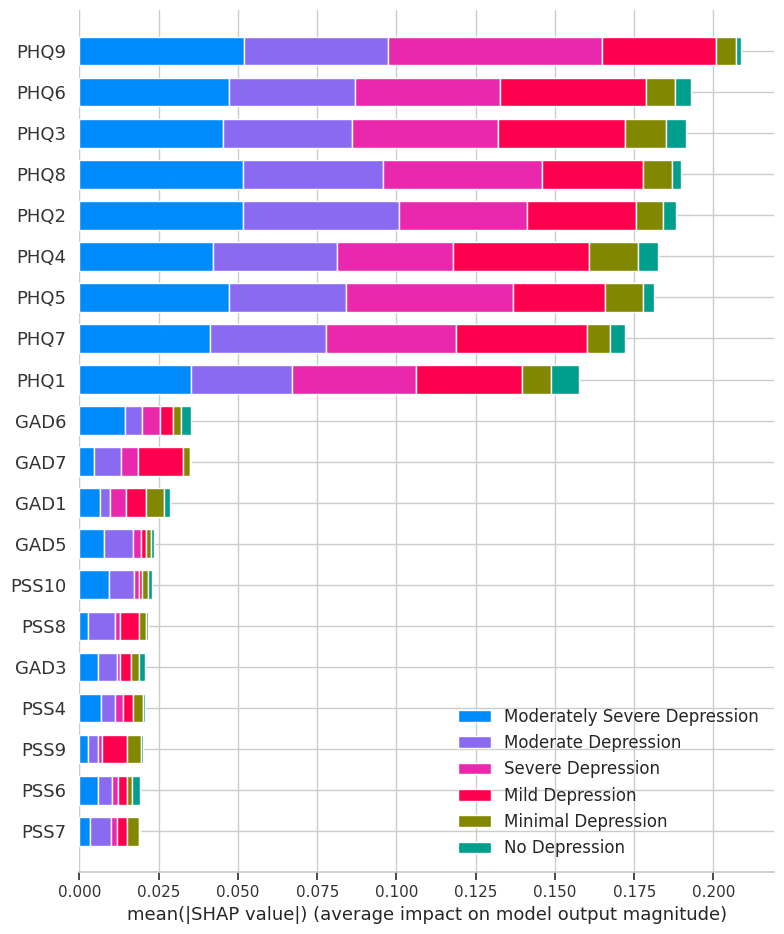

In [ ]:
# ===============================
# SHAP for Hybrid ML + DL Model
# ===============================

import shap

# Define a wrapper function for the hybrid predictions
def hybrid_predict(X_input):
    """
    X_input: numpy array of shape (n_samples, n_features)
    Returns: predicted probabilities for each class
    """
    # ML model probabilities
    if hasattr(best_ml_model, "predict_proba"):
        ml_prob = best_ml_model.predict_proba(X_input)
    else:
        ml_prob = best_ml_model.decision_function(X_input)
        ml_prob = np.exp(ml_prob)/np.sum(np.exp(ml_prob), axis=1, keepdims=True)

    # DL model probabilities
    dl_prob = torch.softmax(best_dl_model(torch.tensor(X_input, dtype=torch.float32)), dim=1).detach().numpy()

    # Average probabilities (hybrid)
    hybrid_prob = (ml_prob + dl_prob) / 2
    return hybrid_prob

# Use the hybrid_predict function as a model in SHAP
explainer = shap.Explainer(hybrid_predict, Xtr)

# Compute SHAP values on test set
shap_values = explainer(Xte)

# Plot summary
plt.figure(figsize=(12,8))
shap.summary_plot(
    shap_values,
    Xte,
    feature_names=X_fs.columns,  # features after selection
    class_names=le.classes_,      # all target classes
    show=False
)
plt.tight_layout()
plt.show()

# Depression Bar Plot

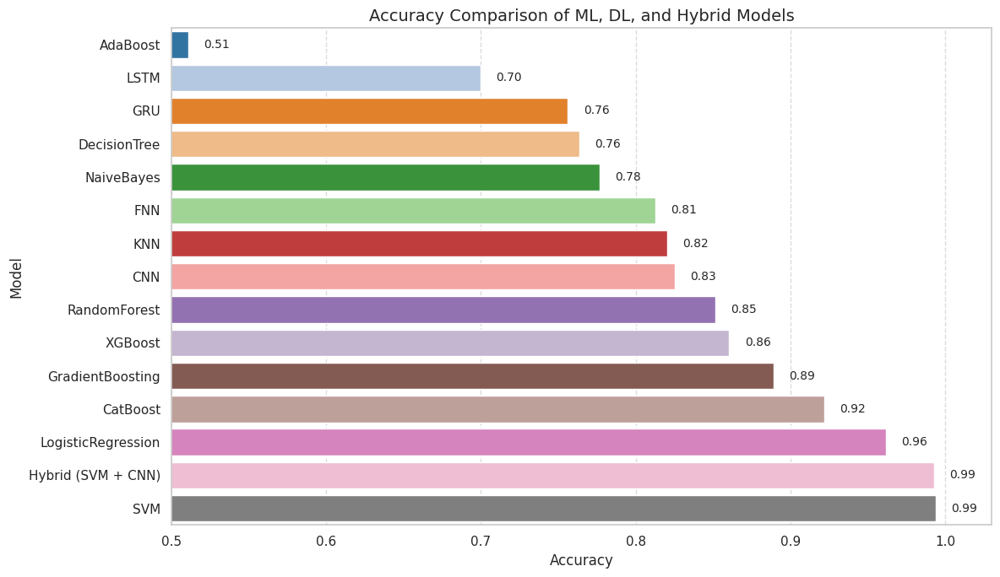

In [ ]:
# ===============================
# COMBINE ALL MODELS (FINAL)
# ===============================

# --- Prepare ML ---
ml_plot_df = ml_df.reset_index()[['Model', 'Accuracy']].copy()

# --- Prepare DL ---
dl_plot_df = dl_df[['Model', 'Accuracy']].copy()

# --- Prepare Hybrid ---
hybrid_plot_df = hybrid_df[['Model', 'Accuracy']].copy()
hybrid_plot_df['Model'] = f"Hybrid ({best_ml_name} + {best_dl_name})"

# --- Combine all ---
all_df = pd.concat(
    [ml_plot_df, dl_plot_df, hybrid_plot_df],
    ignore_index=True
)

# --- Force numeric ---
all_df['Accuracy'] = pd.to_numeric(all_df['Accuracy'], errors='coerce')
all_df = all_df.dropna(subset=['Accuracy'])

# --- Sort ---
all_df = all_df.sort_values('Accuracy', ascending=True)

# ===============================
# PLOT (UNIQUE COLOR PER MODEL)
# ===============================
plt.figure(figsize=(12, 7))

# Generate unique colors
palette = sns.color_palette("tab20", n_colors=len(all_df))

ax = sns.barplot(
    data=all_df,
    y="Model",
    x="Accuracy",
    palette=palette
)

# --- Annotate ---
for p in ax.patches:
    width = p.get_width()
    ax.text(
        width + 0.01,
        p.get_y() + p.get_height() / 2,
        f"{width:.2f}",
        va="center",
        fontsize=10
    )

# --- Formatting ---
ax.set_xlim(0.5, 1.03)
ax.set_title("Accuracy Comparison of ML, DL, and Hybrid Models", fontsize=14)
ax.set_xlabel("Accuracy")
ax.set_ylabel("Model")
ax.grid(axis="x", linestyle="--", alpha=0.7)

plt.tight_layout()
plt.show()


# Roc-Auc curve


===== TARGET: Stress Label =====
ML DecisionTree AUC: 0.874257065884303


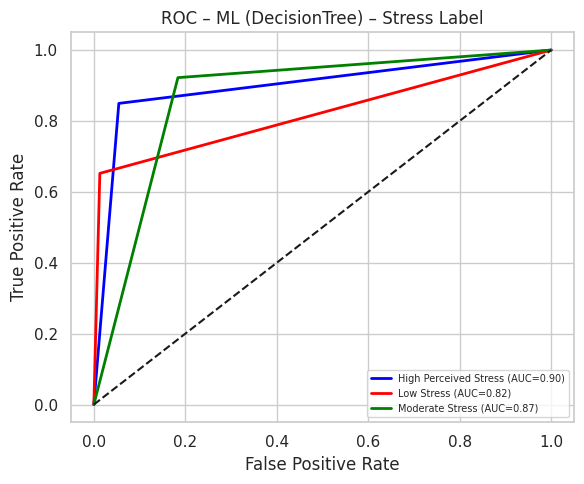

ML RandomForest AUC: 0.9914661534387851


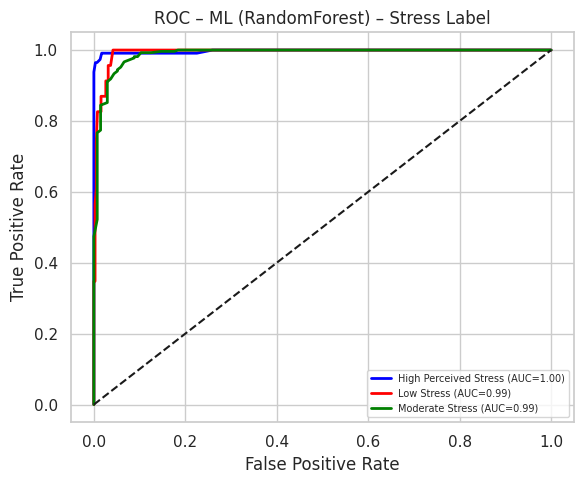

ML GradientBoosting AUC: 0.9962369084670716


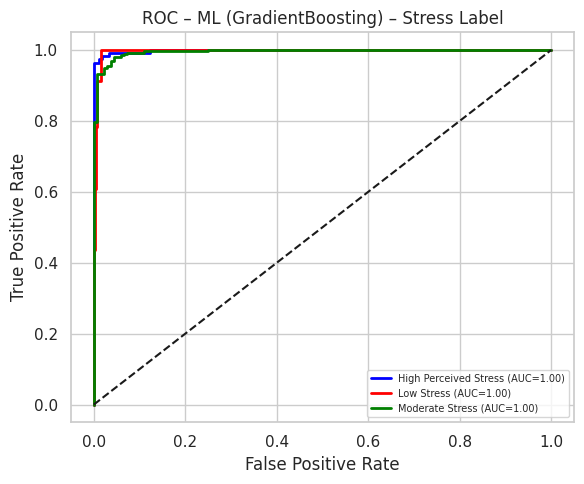

ML AdaBoost AUC: 0.9226310486285265


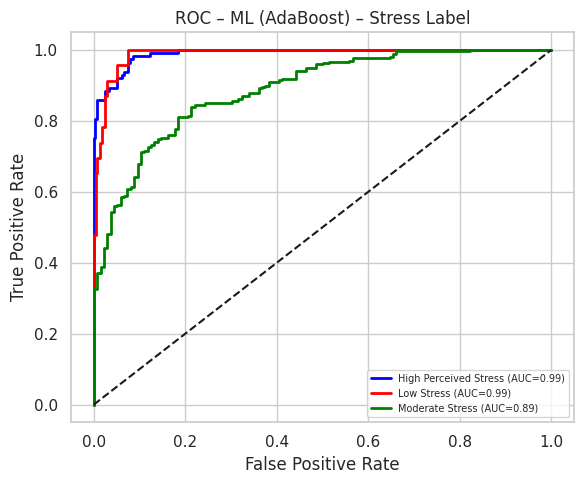

ML XGBoost AUC: 0.9937797442613923


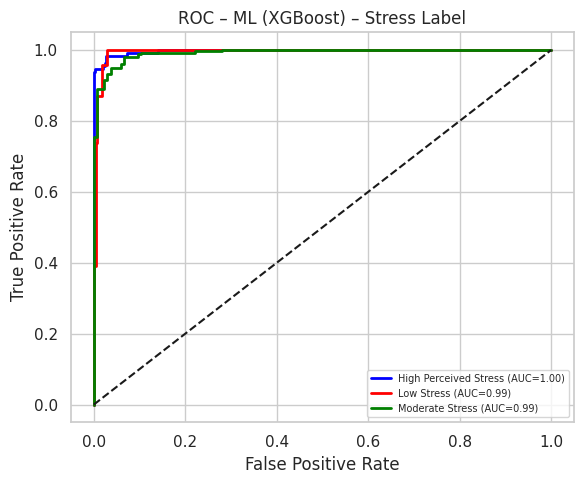

ML SVM AUC: 0.998342513594257


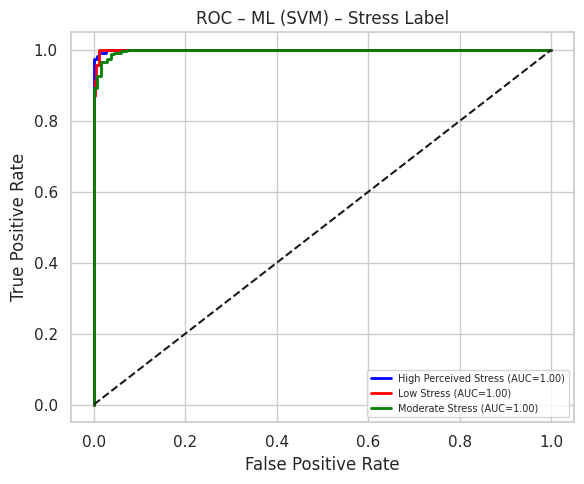

ML KNN AUC: 0.9659224183977986


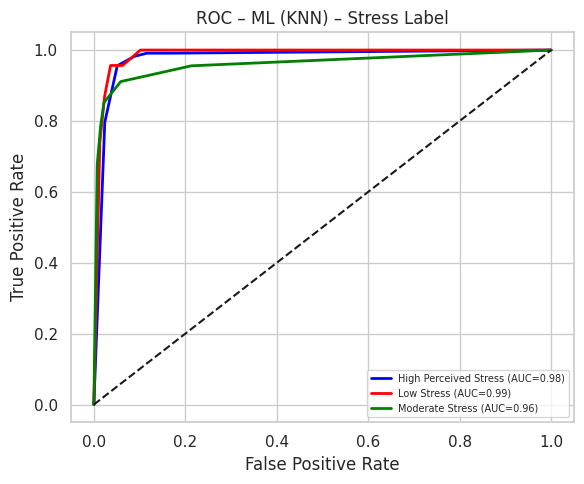

ML LogisticRegression AUC: 0.9996858031516171


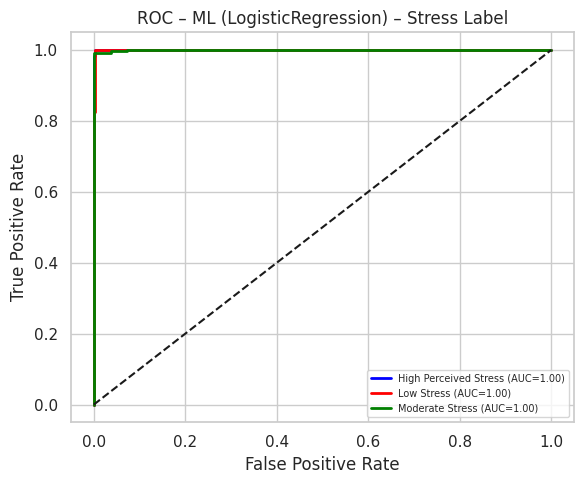

ML NaiveBayes AUC: 0.785256811224587


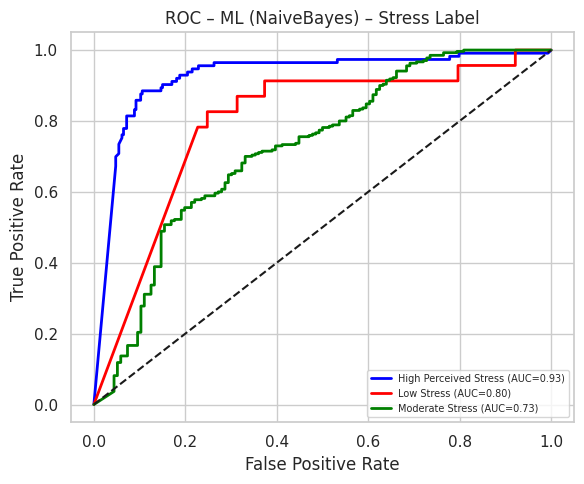

ML CatBoost AUC: 0.9971788783176531


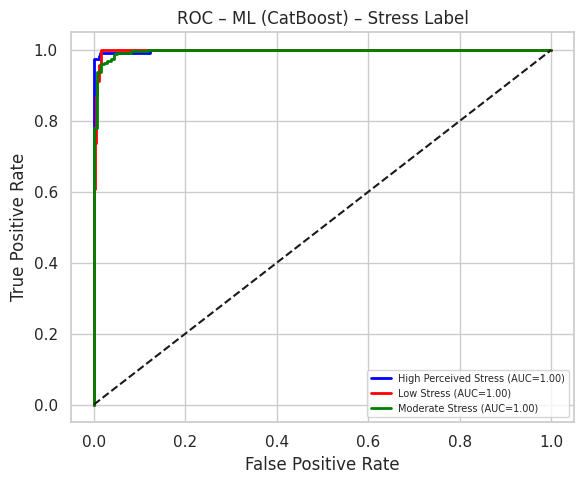

DL FNN AUC: 0.9984072427093719


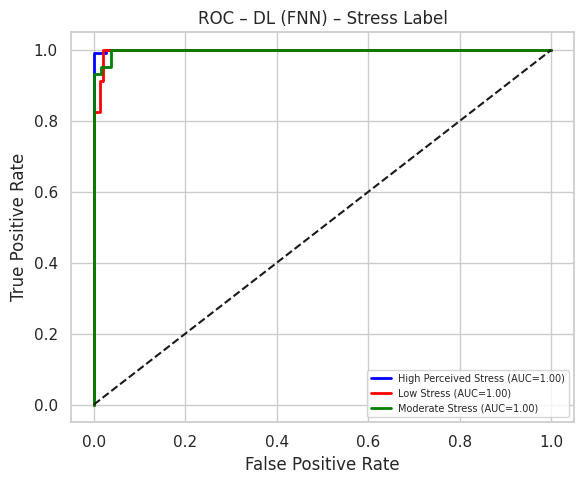

DL CNN AUC: 0.9976683666708653


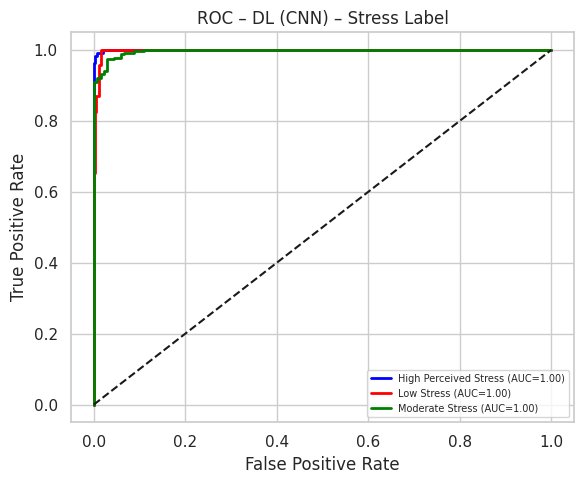

DL LSTM AUC: 0.9988617536488043


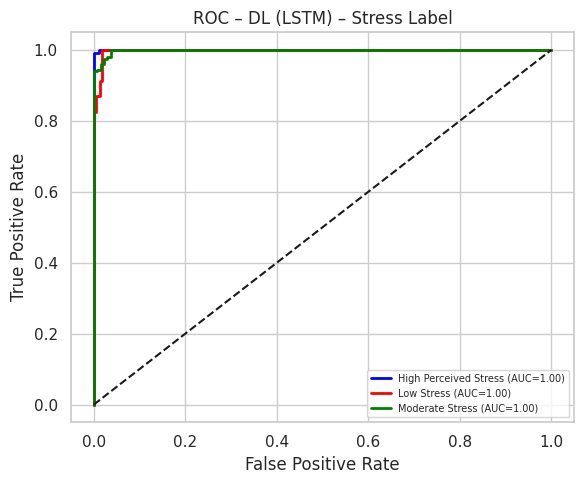

DL GRU AUC: 0.9993096611146074


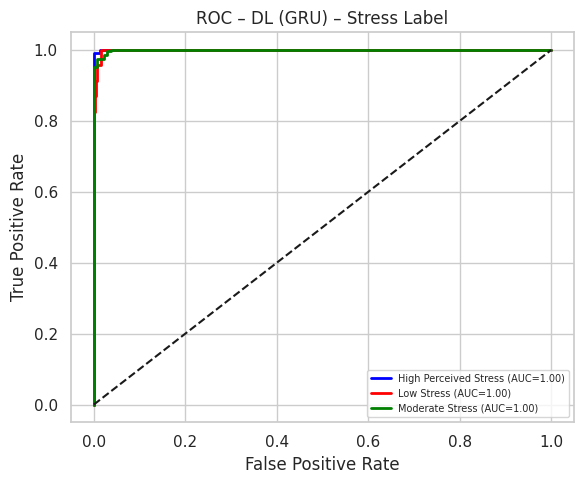

HYBRID AUC: 0.987143342107693


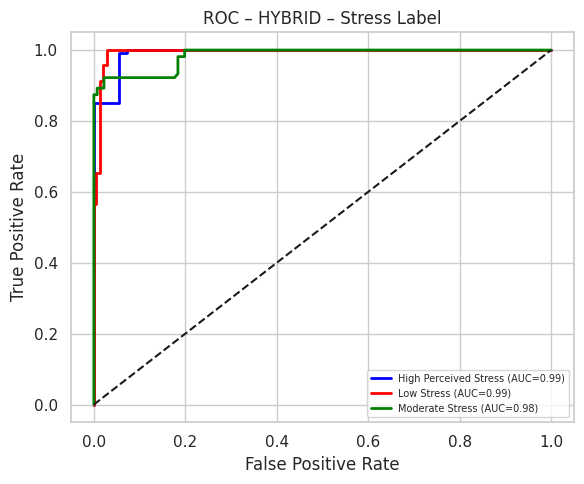


===== TARGET: Anxiety Label =====
ML DecisionTree AUC: 0.8849262108087944


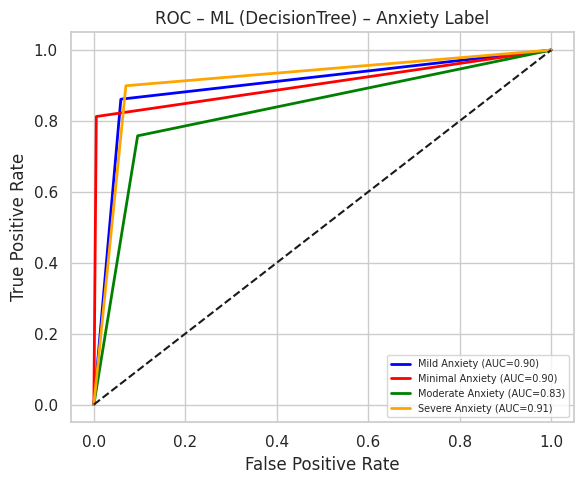

ML RandomForest AUC: 0.9852946994490034


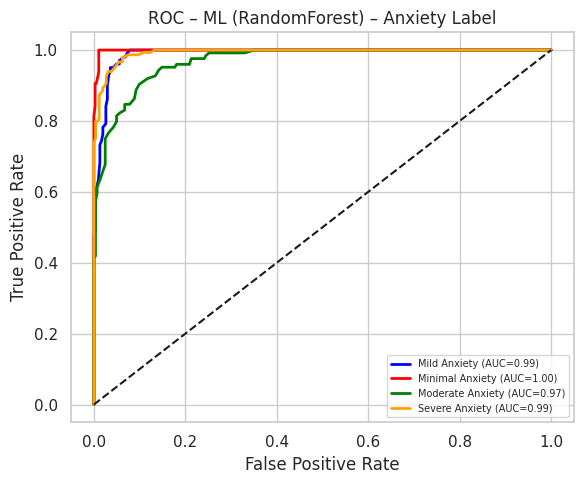

ML GradientBoosting AUC: 0.9943040494216298


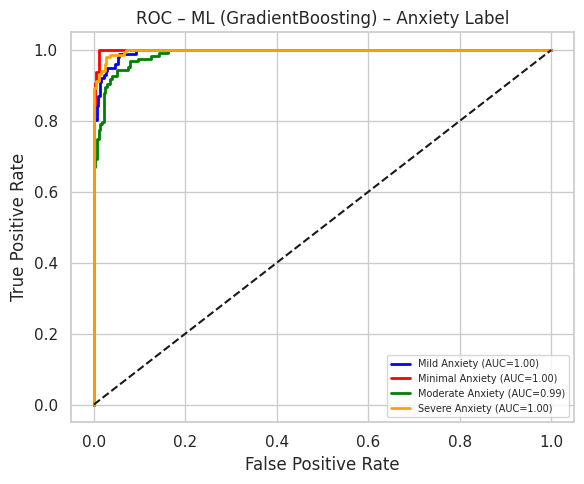

ML AdaBoost AUC: 0.8422584480966196


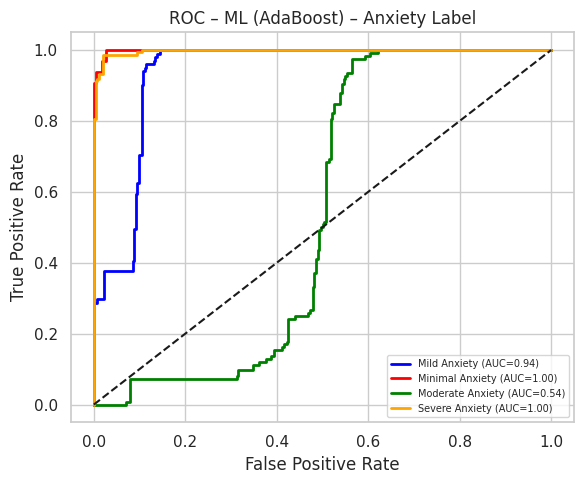

ML XGBoost AUC: 0.9937365620315791


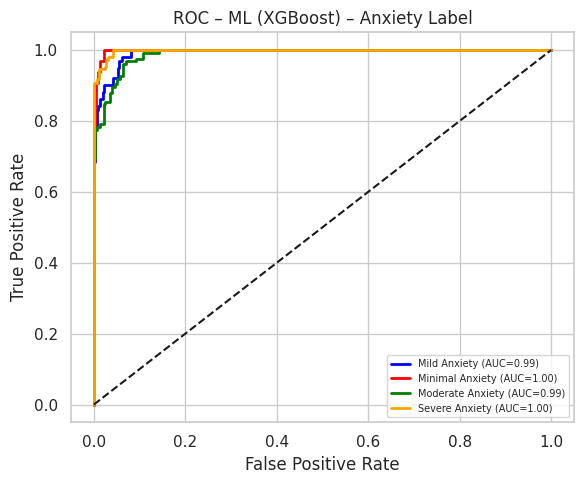

ML SVM AUC: 0.9971544705658055


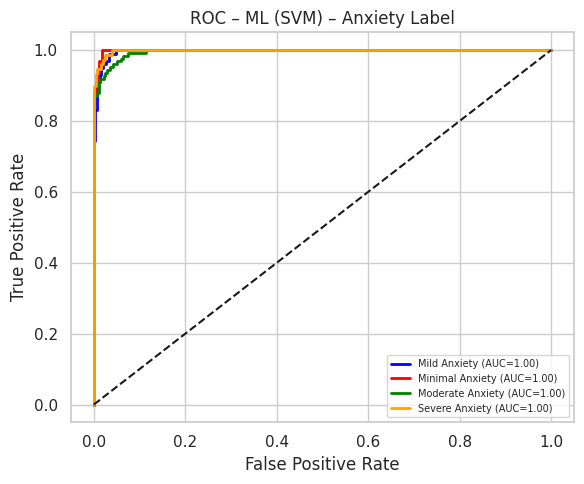

ML KNN AUC: 0.9234351714947372


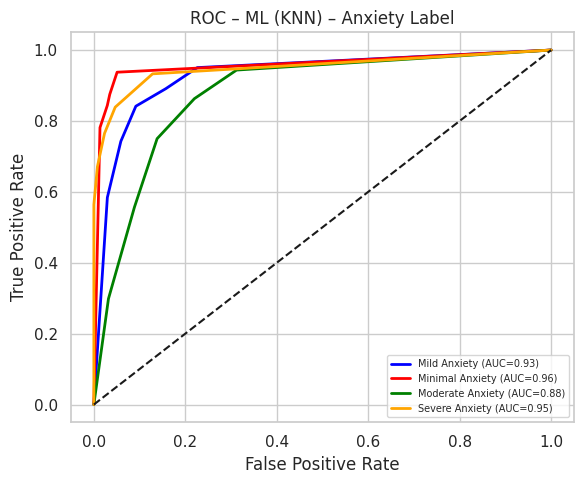

ML LogisticRegression AUC: 0.9996722539791193


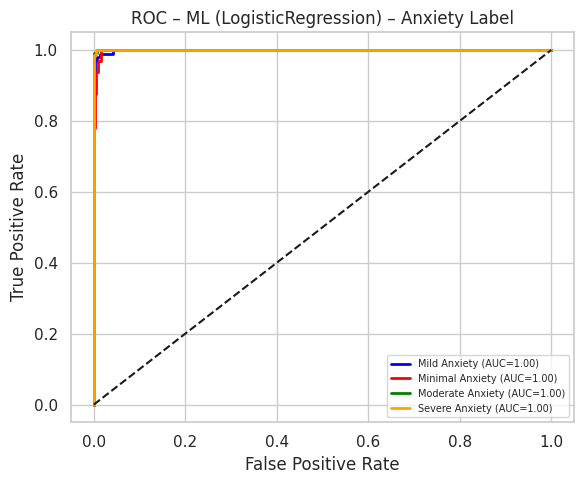

ML NaiveBayes AUC: 0.8266537930406381


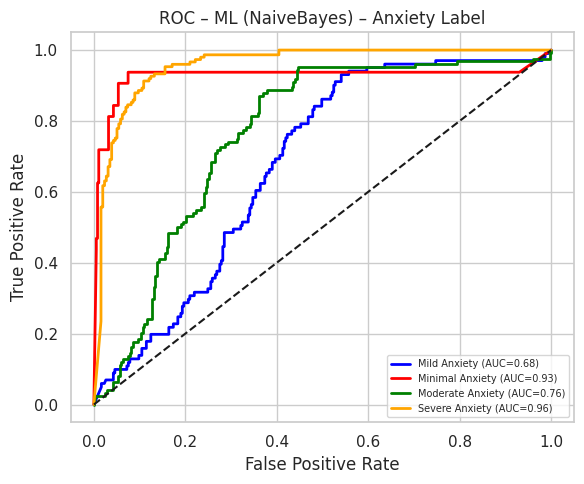

ML CatBoost AUC: 0.9982340323984394


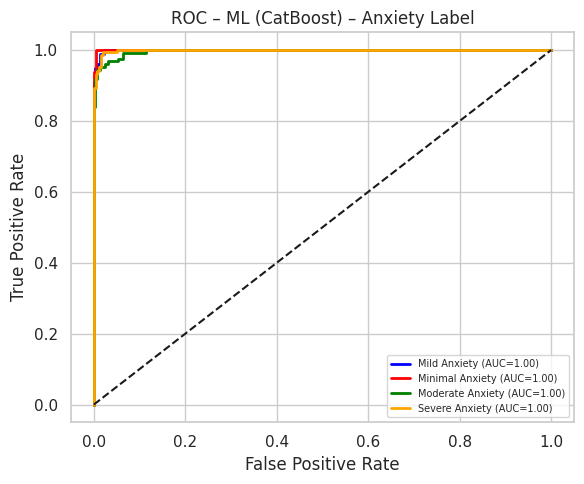

DL FNN AUC: 0.9995404467899411


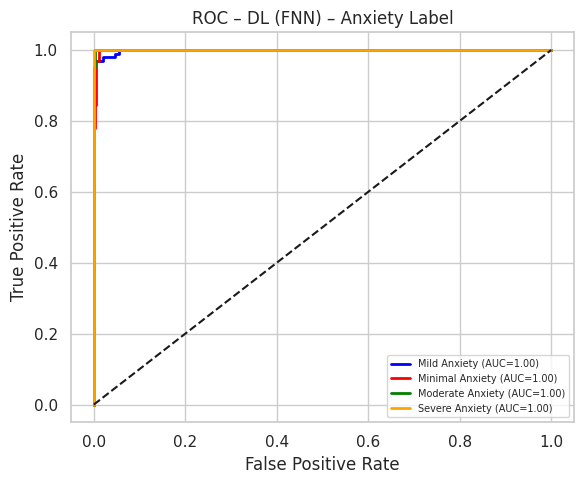

DL CNN AUC: 0.9981764540256108


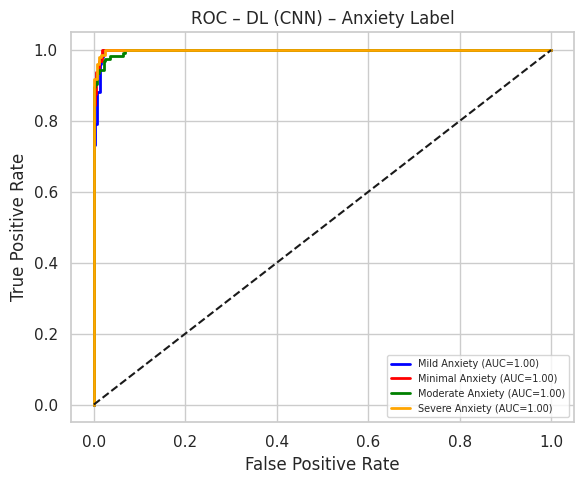

DL LSTM AUC: 0.999736722892045


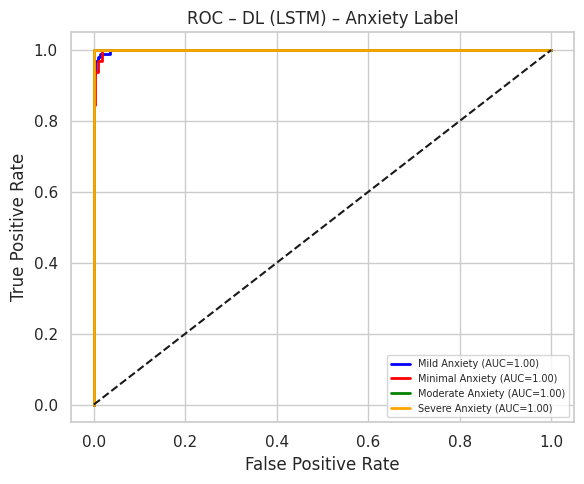

DL GRU AUC: 0.999763929416774


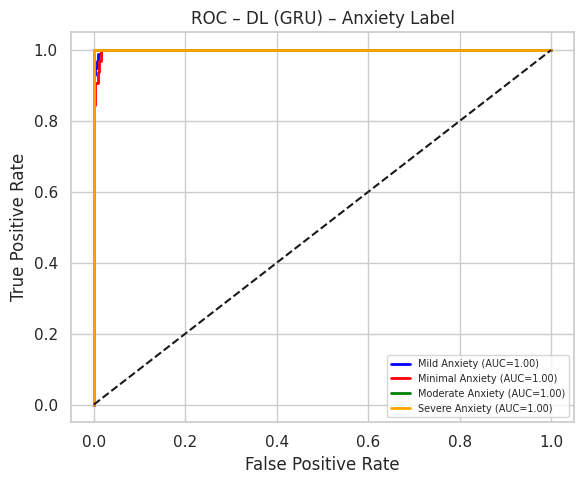

HYBRID AUC: 0.988003078485384


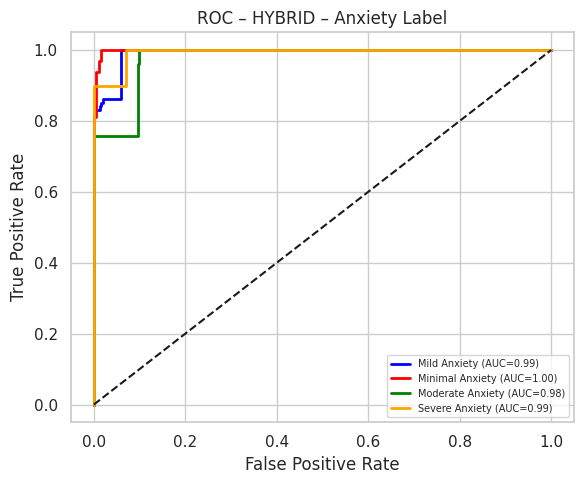


===== TARGET: Depression Label =====
ML DecisionTree AUC: 0.830134939561603


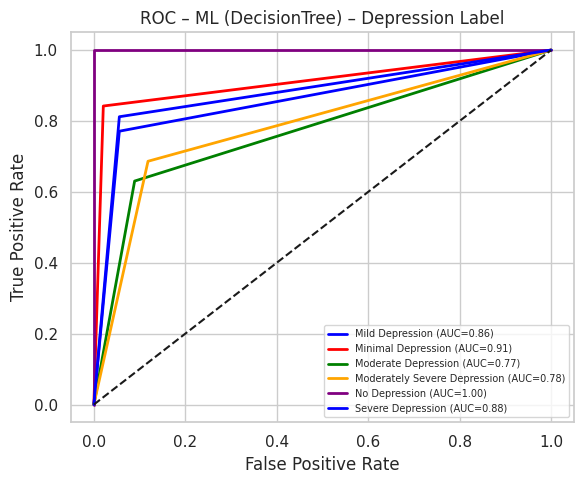

ML RandomForest AUC: 0.9703018158054726


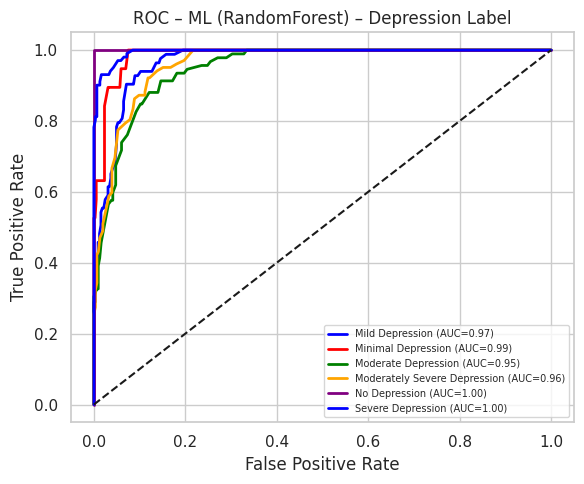

ML GradientBoosting AUC: 0.9827614806657415


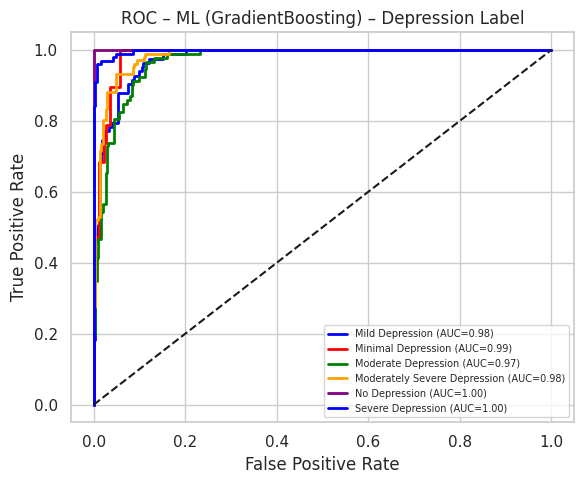

ML AdaBoost AUC: 0.8264330564047279


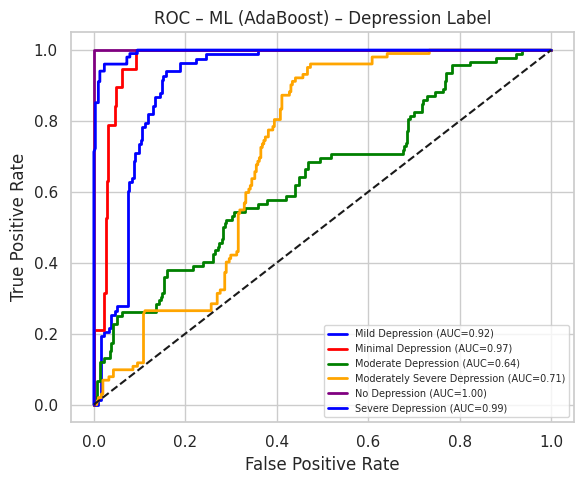

ML XGBoost AUC: 0.9813708670033294


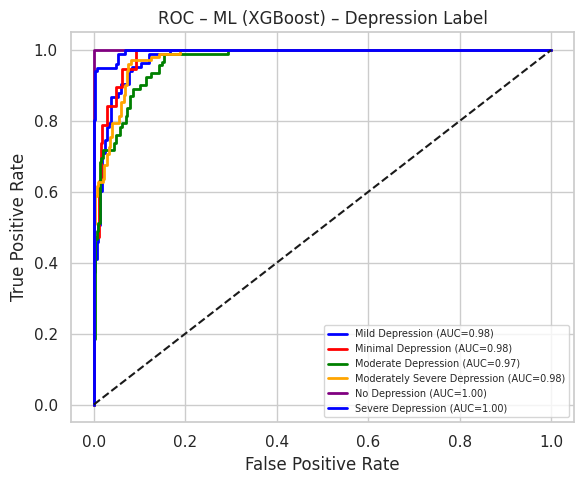

ML SVM AUC: 0.9963362668760011


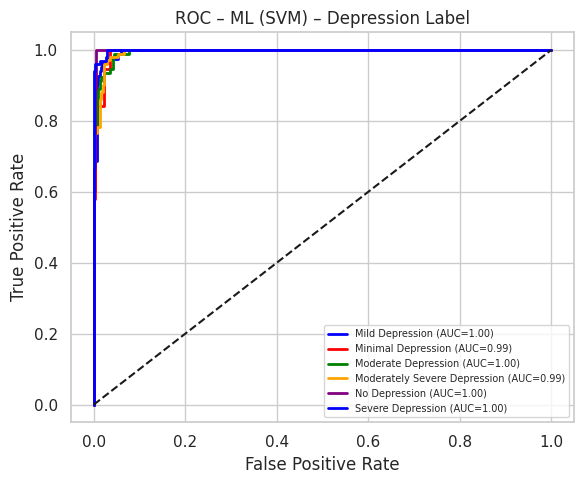

ML KNN AUC: 0.9123744009817505


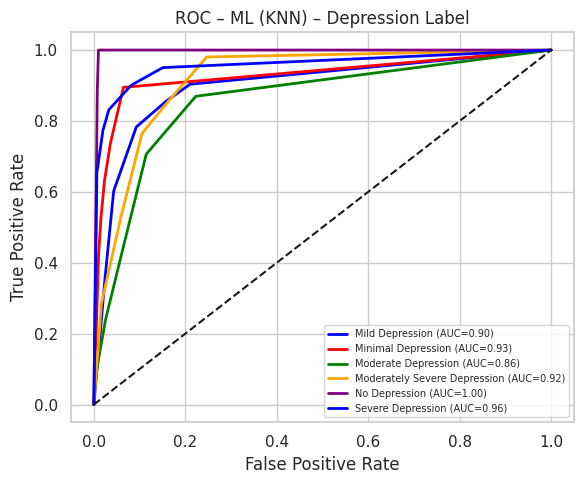

ML LogisticRegression AUC: 0.9974865261374308


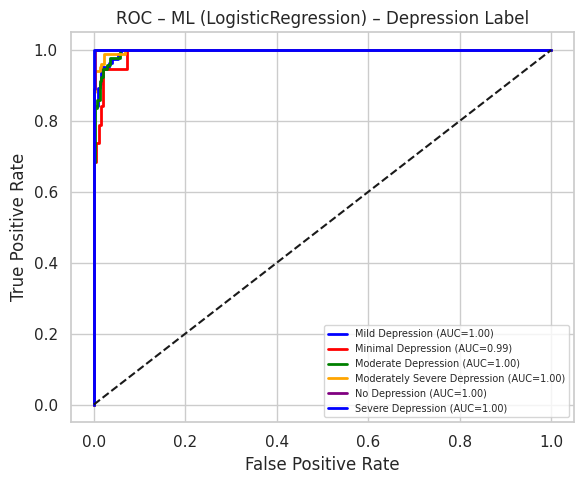

ML NaiveBayes AUC: 0.7612732778172453


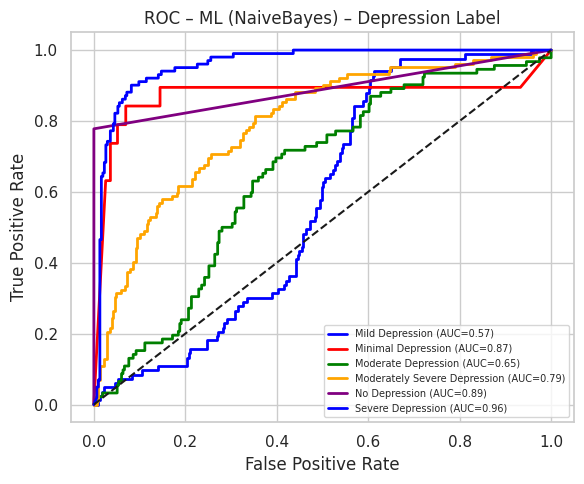

ML CatBoost AUC: 0.9935181051963684


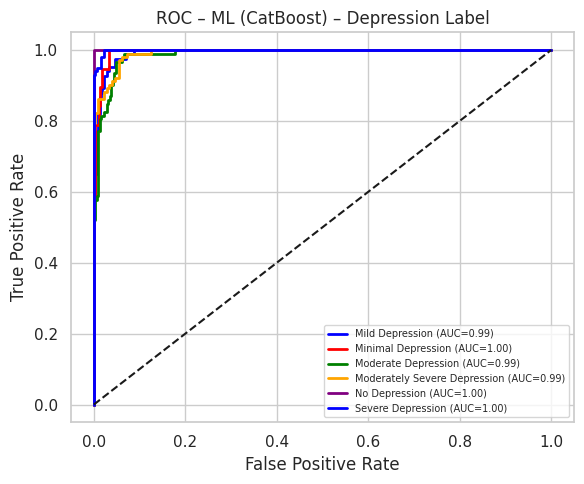

DL FNN AUC: 0.9980561983211369


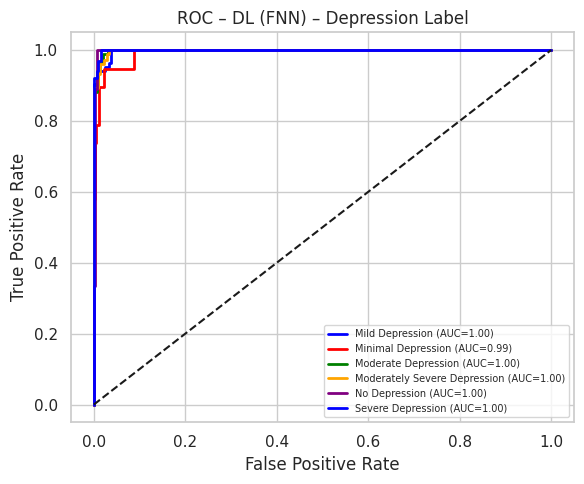

DL CNN AUC: 0.9973553463256981


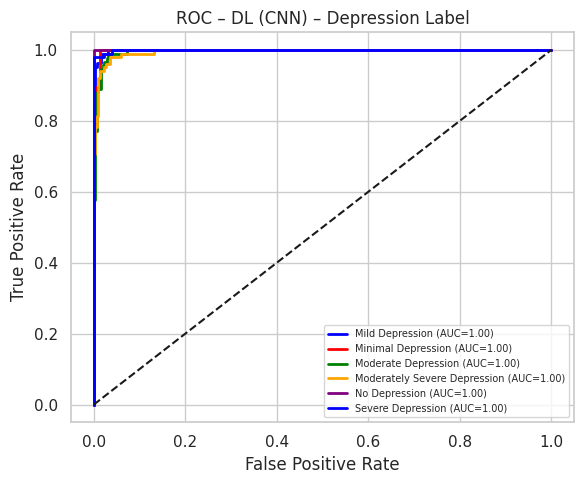

DL LSTM AUC: 0.9969789398172366


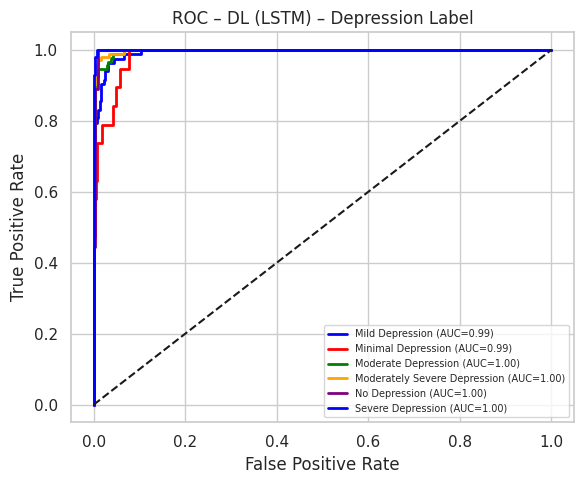

DL GRU AUC: 0.9970084641741785


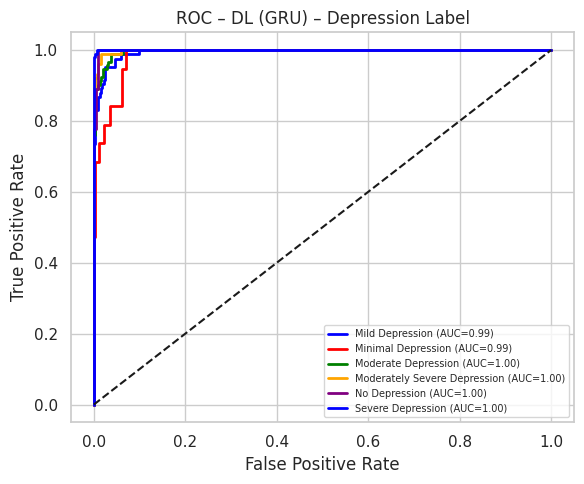

HYBRID AUC: 0.9769935205166626


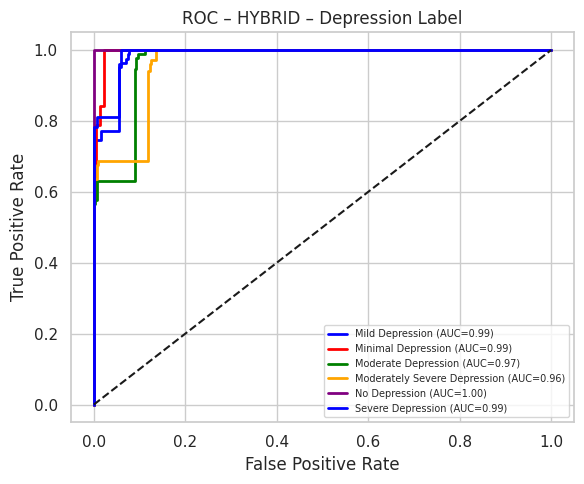

In [ ]:
# ===============================
# FULL PIPELINE: ROC-AUC FOR ML, DL, HYBRID
# ===============================

# --- IMPORTS ---
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import TensorDataset, DataLoader
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler, label_binarize

from sklearn.impute import SimpleImputer
from sklearn.metrics import roc_curve, auc, roc_auc_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from imblearn.over_sampling import SMOTE
from itertools import cycle
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
import seaborn as sns
sns.set(style="whitegrid")
import os # Import os module for path manipulation

# --- RANDOM SEED ---
RANDOM_STATE = 42
torch.manual_seed(RANDOM_STATE)
np.random.seed(RANDOM_STATE)

# --- LOAD DATA ---
# Corrected DATA_PATH to use the 'path' variable obtained from kagglehub.dataset_download
DATA_PATH = os.path.join(path, "Processed.csv")
df = pd.read_csv(DATA_PATH)

# --- FEATURES & TARGETS ---
X = df.drop(columns=[
    'Stress Label', 'Stress Value',
    'Anxiety Label', 'Anxiety Value',
    'Depression Label', 'Depression Value'
])
targets = ['Stress Label', 'Anxiety Label', 'Depression Label']

# --- PREPROCESSING ---
num_cols = X.select_dtypes(include=np.number).columns
cat_cols = X.select_dtypes(include='object').columns

# Impute missing
X[num_cols] = SimpleImputer(strategy='median').fit_transform(X[num_cols])
X[cat_cols] = SimpleImputer(strategy='most_frequent').fit_transform(X[cat_cols])

# Encode categorical
for col in cat_cols:
    if X[col].nunique() == 2:
        X[col] = LabelEncoder().fit_transform(X[col])
    else:
        X = pd.get_dummies(X, columns=[col], drop_first=True)

# Scale numeric
X[num_cols] = StandardScaler().fit_transform(X[num_cols])
X_np = X.values.astype(np.float32)

# --- ML MODELS ---
models = {
    "DecisionTree": DecisionTreeClassifier(random_state=RANDOM_STATE),
    "RandomForest": RandomForestClassifier(random_state=RANDOM_STATE),
    "GradientBoosting": GradientBoostingClassifier(random_state=RANDOM_STATE),
    "AdaBoost": AdaBoostClassifier(random_state=RANDOM_STATE),
    "XGBoost": XGBClassifier(eval_metric='mlogloss', random_state=RANDOM_STATE),
    "SVM": SVC(probability=True, random_state=RANDOM_STATE),
    "KNN": KNeighborsClassifier(),
    "LogisticRegression": LogisticRegression(max_iter=1000, random_state=RANDOM_STATE),
    "NaiveBayes": GaussianNB(),
    "CatBoost": CatBoostClassifier(verbose=0, random_state=RANDOM_STATE)
}

# --- DL MODELS ---
class FNN(nn.Module):
    def __init__(self, input_dim, output_dim, hidden_dim=64):
        super(FNN, self).__init__()
        self.fc1 = nn.Linear(input_dim, hidden_dim)
        self.fc2 = nn.Linear(hidden_dim, hidden_dim)
        self.out = nn.Linear(hidden_dim, output_dim)
    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        return self.out(x)

class CNN(nn.Module):
    def __init__(self, input_dim, output_dim):
        super(CNN, self).__init__()
        self.conv1 = nn.Conv1d(1, 16, 3, padding=1)
        self.conv2 = nn.Conv1d(16, 32, 3, padding=1)
        self.fc = nn.Linear(32*input_dim, output_dim)
    def forward(self, x):
        x = x.unsqueeze(1)
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        x = x.view(x.size(0), -1)
        return self.fc(x)

class LSTM(nn.Module):
    def __init__(self, input_dim, output_dim, hidden_dim=64):
        super(LSTM, self).__init__()
        self.lstm = nn.LSTM(input_dim, hidden_dim, batch_first=True)
        self.fc = nn.Linear(hidden_dim, output_dim)
    def forward(self, x):
        x = x.unsqueeze(1)
        out, _ = self.lstm(x)
        return self.fc(out[:, -1, :])

class GRU(nn.Module):
    def __init__(self, input_dim, output_dim, hidden_dim=64):
        super(GRU, self).__init__()
        self.gru = nn.GRU(input_dim, hidden_dim, batch_first=True)
        self.fc = nn.Linear(hidden_dim, output_dim)
    def forward(self, x):
        x = x.unsqueeze(1)
        out, _ = self.gru(x)
        return self.fc(out[:, -1, :])

dl_models = {"FNN": FNN, "CNN": CNN, "LSTM": LSTM, "GRU": GRU}

def create_loader(X, y, batch_size=32):
    dataset = TensorDataset(torch.tensor(X, dtype=torch.float32),
                            torch.tensor(y, dtype=torch.long))
    return DataLoader(dataset, batch_size=batch_size, shuffle=True)

def train_dl(model, X, y, epochs=15, lr=0.001):
    loader = create_loader(X, y)
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    model.train()
    for _ in range(epochs):
        for xb, yb in loader:
            optimizer.zero_grad()
            loss = criterion(model(xb), yb)
            loss.backward()
            optimizer.step()
    return model

# --- ROC PLOT FUNCTION ---
def plot_multiclass_roc(y_true, y_prob, class_names, title):
    n_classes = len(class_names)
    y_bin = label_binarize(y_true, classes=range(n_classes))

    plt.figure(figsize=(6,5))
    colors = cycle(['blue','red','green','orange','purple'])
    for i, color in zip(range(n_classes), colors):
        fpr, tpr, _ = roc_curve(y_bin[:, i], y_prob[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, color=color, lw=2, label=f"{class_names[i]} (AUC={roc_auc:.2f})")
    plt.plot([0,1],[0,1],'k--')
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title(title)
    plt.legend(fontsize=7)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# --- FULL PIPELINE ---
for target_col in targets:
    print(f"\n===== TARGET: {target_col} =====")

    # Encode target
    y = df[target_col].values
    le = LabelEncoder()
    y_enc = le.fit_transform(y)
    class_names = le.classes_
    num_classes = len(class_names)

    # Train/test split
    Xtr, Xte, ytr, yte = train_test_split(X_np, y_enc, test_size=0.2,
                                          stratify=y_enc, random_state=RANDOM_STATE)

    # Apply SMOTE
    sm = SMOTE(random_state=RANDOM_STATE)
    Xtr_res, ytr_res = sm.fit_resample(Xtr, ytr)

    ml_probs, dl_probs = {}, {}

    # --- ML MODELS ---
    for name, model in models.items():
        model.fit(Xtr_res, ytr_res)
        if hasattr(model, "predict_proba"):
            y_prob = model.predict_proba(Xte)
        else:
            scores = model.decision_function(Xte)
            y_prob = np.exp(scores)/np.sum(np.exp(scores),axis=1,keepdims=True)
        ml_probs[name] = y_prob
        print(f"ML {name} AUC:", roc_auc_score(yte, y_prob, multi_class="ovr", average="weighted"))
        plot_multiclass_roc(yte, y_prob, class_names, f"ROC – ML ({name}) – {target_col}")

    # --- DL MODELS ---
    for name, cls in dl_models.items():
        model = cls(X_np.shape[1], num_classes)
        model = train_dl(model, Xtr_res, ytr_res)
        model.eval()
        with torch.no_grad():
            y_prob = torch.softmax(model(torch.tensor(Xte,dtype=torch.float32)),1).numpy()
        dl_probs[name] = y_prob
        print(f"DL {name} AUC:", roc_auc_score(yte, y_prob, multi_class="ovr", average="weighted"))
        plot_multiclass_roc(yte, y_prob, class_names, f"ROC – DL ({name}) – {target_col}")

    # --- HYBRID MODEL: average first ML + first DL ---
    hybrid_prob = 0.5 * list(ml_probs.values())[0] + 0.5 * list(dl_probs.values())[0]
    print("HYBRID AUC:", roc_auc_score(yte, hybrid_prob, multi_class="ovr", average="weighted"))
    plot_multiclass_roc(yte, hybrid_prob, class_names, f"ROC – HYBRID – {target_col}")


===== Stress Label =====


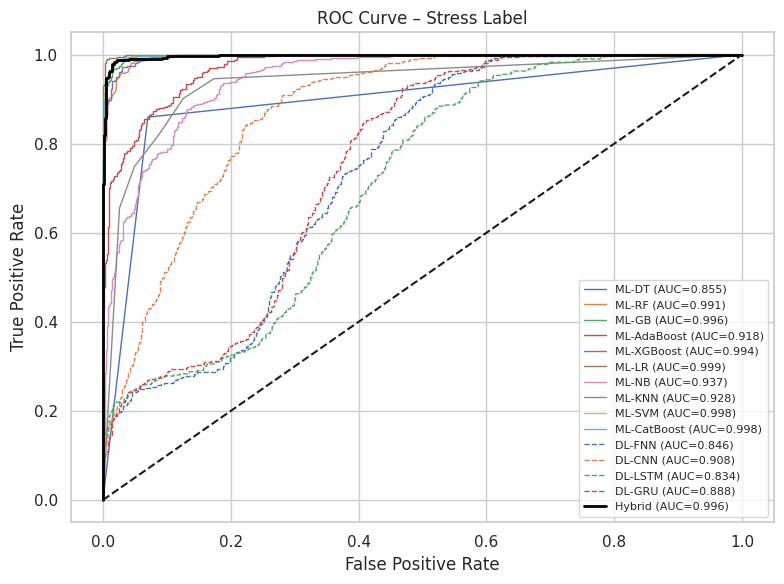


===== Anxiety Label =====


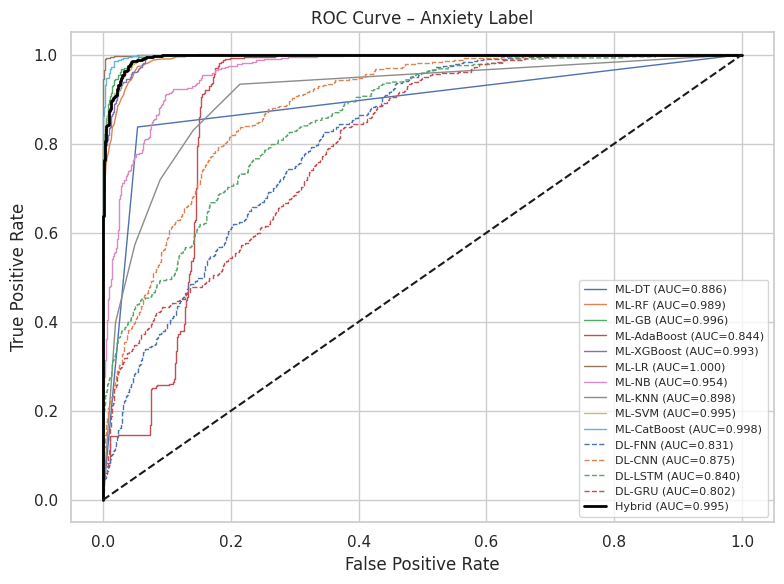


===== Depression Label =====


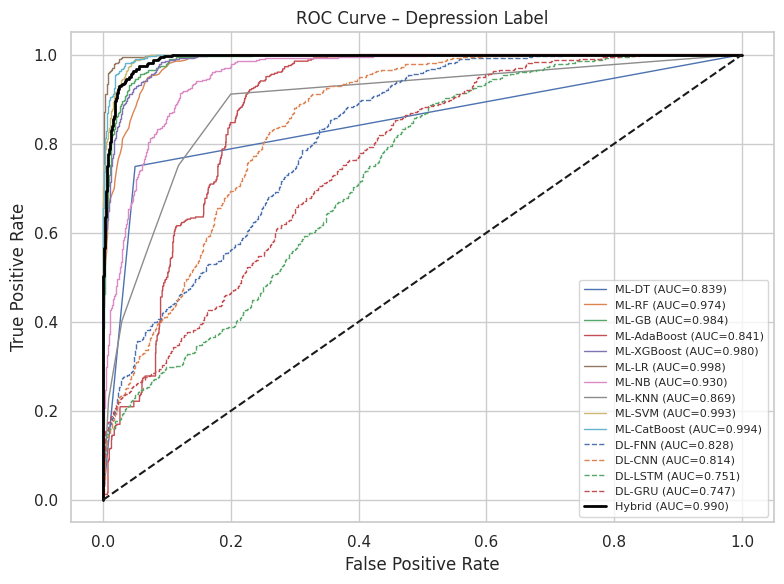

In [ ]:
!pip install imbalanced-learn xgboost catboost -q
# ===============================
# IMPORTS
# ===============================
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler, label_binarize
from sklearn.impute import SimpleImputer
from sklearn.metrics import roc_curve, roc_auc_score

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from catboost import CatBoostClassifier

from imblearn.over_sampling import SMOTE

import matplotlib.pyplot as plt
import os, warnings
warnings.filterwarnings("ignore")

RANDOM_STATE = 42
np.random.seed(RANDOM_STATE)
torch.manual_seed(RANDOM_STATE)

# ===============================
# LOAD DATA
# ===============================
DATA_PATH = os.path.join(path, "Processed.csv")
df = pd.read_csv(DATA_PATH)

targets = ['Stress Label', 'Anxiety Label', 'Depression Label']

X = df.drop(columns=[
    'Stress Label','Stress Value',
    'Anxiety Label','Anxiety Value',
    'Depression Label','Depression Value'
])

# ===============================
# PREPROCESSING
# ===============================
num_cols = X.select_dtypes(include=np.number).columns
cat_cols = X.select_dtypes(include='object').columns

X[num_cols] = SimpleImputer(strategy='median').fit_transform(X[num_cols])
X[cat_cols] = SimpleImputer(strategy='most_frequent').fit_transform(X[cat_cols])

for c in cat_cols:
    X[c] = LabelEncoder().fit_transform(X[c])

X[num_cols] = StandardScaler().fit_transform(X[num_cols])
X = X.values.astype(np.float32)

# ===============================
# ML MODELS (10)
# ===============================
ml_models = {
    "DT": DecisionTreeClassifier(),
    "RF": RandomForestClassifier(),
    "GB": GradientBoostingClassifier(),
    "AdaBoost": AdaBoostClassifier(),
    "XGBoost": XGBClassifier(eval_metric='mlogloss'),
    "LR": LogisticRegression(max_iter=1000),
    "NB": GaussianNB(),
    "KNN": KNeighborsClassifier(),
    "SVM": SVC(probability=True),
    "CatBoost": CatBoostClassifier(verbose=0)
}

# ===============================
# DL MODELS (4)
# ===============================
class FNN(nn.Module):
    def __init__(self, d, c):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(d,64), nn.ReLU(),
            nn.Linear(64,64), nn.ReLU(),
            nn.Linear(64,c)
        )
    def forward(self,x): return self.net(x)

class CNN(nn.Module):
    def __init__(self,d,c):
        super().__init__()
        self.conv = nn.Conv1d(1,16,3,padding=1)
        self.fc = nn.Linear(16*d,c)
    def forward(self,x):
        x = self.conv(x.unsqueeze(1))
        return self.fc(x.view(x.size(0),-1))

class LSTM(nn.Module):
    def __init__(self,d,c):
        super().__init__()
        self.lstm = nn.LSTM(d,64,batch_first=True)
        self.fc = nn.Linear(64,c)
    def forward(self,x):
        o,_ = self.lstm(x.unsqueeze(1))
        return self.fc(o[:,-1,:])

class GRU(nn.Module):
    def __init__(self,d,c):
        super().__init__()
        self.gru = nn.GRU(d,64,batch_first=True)
        self.fc = nn.Linear(64,c)
    def forward(self,x):
        o,_ = self.gru(x.unsqueeze(1))
        return self.fc(o[:,-1,:])

dl_models = {
    "FNN": FNN,
    "CNN": CNN,
    "LSTM": LSTM,
    "GRU": GRU
}

# ===============================
# TRAIN DL
# ===============================
def train_dl(model, X, y, epochs=15):
    opt = torch.optim.Adam(model.parameters(), lr=0.001)
    loss_fn = nn.CrossEntropyLoss()
    X = torch.tensor(X)
    y = torch.tensor(y)

    for _ in range(epochs):
        opt.zero_grad()
        loss = loss_fn(model(X), y)
        loss.backward()
        opt.step()
    return model

# ===============================
# MAIN LOOP (15 CURVES)
# ===============================
for target in targets:
    print(f"\n===== {target} =====")

    y = LabelEncoder().fit_transform(df[target])
    classes = np.unique(y)

    Xtr, Xte, ytr, yte = train_test_split(
        X, y, test_size=0.2, stratify=y, random_state=RANDOM_STATE
    )

    Xtr, ytr = SMOTE(random_state=RANDOM_STATE).fit_resample(Xtr, ytr)

    y_bin = label_binarize(yte, classes=classes)

    plt.figure(figsize=(8,6))

    # -------- ML CURVES (10) --------
    ml_probs = []
    for name, model in ml_models.items():
        model.fit(Xtr, ytr)
        prob = model.predict_proba(Xte)
        ml_probs.append(prob)

        fpr, tpr, _ = roc_curve(y_bin.ravel(), prob.ravel())
        auc = roc_auc_score(yte, prob, multi_class='ovr', average='weighted')
        plt.plot(fpr, tpr, lw=1, label=f"ML-{name} (AUC={auc:.3f})")

    # -------- DL CURVES (4) --------
    dl_probs = []
    for name, cls in dl_models.items():
        model = cls(X.shape[1], len(classes))
        model = train_dl(model, Xtr, ytr)
        with torch.no_grad():
            prob = torch.softmax(model(torch.tensor(Xte)),1).numpy()
        dl_probs.append(prob)

        fpr, tpr, _ = roc_curve(y_bin.ravel(), prob.ravel())
        auc = roc_auc_score(yte, prob, multi_class='ovr', average='weighted')
        plt.plot(fpr, tpr, lw=1, linestyle='--', label=f"DL-{name} (AUC={auc:.3f})")

    # -------- HYBRID (1) --------
    hybrid_prob = 0.5*np.mean(ml_probs,0) + 0.5*np.mean(dl_probs,0)
    fpr, tpr, _ = roc_curve(y_bin.ravel(), hybrid_prob.ravel())
    auc = roc_auc_score(yte, hybrid_prob, multi_class='ovr', average='weighted')
    plt.plot(fpr, tpr, lw=2, color='black', label=f"Hybrid (AUC={auc:.3f})")

    plt.plot([0,1],[0,1],'k--')
    plt.title(f"ROC Curve – {target}")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend(fontsize=8)
    plt.tight_layout()
    plt.show()


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 4.6 MB/s eta 0:00:00

===== TARGET: Stress Label =====


,Accuracy,F1-weighted,Precision-weighted,Recall-weighted
Model,,,,
DecisionTree,0.926311,0.926179,0.926099,0.926311
RandomForest,0.976756,0.976796,0.976879,0.976756
GradientBoosting,0.980218,0.980241,0.980292,0.980218
AdaBoost,0.928783,0.929477,0.931917,0.928783
XGBoost,0.978734,0.978749,0.978783,0.978734
SVM,0.984174,0.984103,0.984322,0.984174
KNN,0.932987,0.931238,0.937044,0.932987
LogisticRegression,0.989862,0.989834,0.989929,0.989862
NaiveBayes,0.690653,0.616987,0.710039,0.690653


Best ML Model: LogisticRegression


,Accuracy,F1-weighted,Precision-weighted,Recall-weighted
Model,,,,
FNN,0.980296,0.979919,0.980060,0.980296
CNN,0.980296,0.980464,0.980832,0.980296
LSTM,0.985222,0.984546,0.985543,0.985222
GRU,0.985222,0.984546,0.985543,0.985222


Best DL Model: LSTM
Best hyperparameters: {'C': 10}


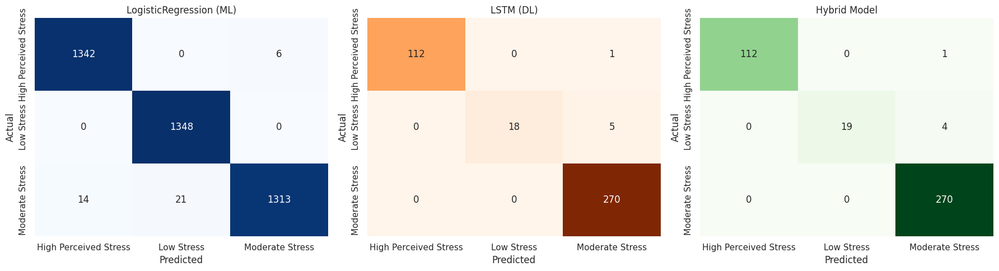

,Accuracy,F1-weighted,Precision-weighted,Recall-weighted
Model,,,,
Hybrid (LogisticRegression+LSTM),0.987685,0.987267,0.987909,0.987685


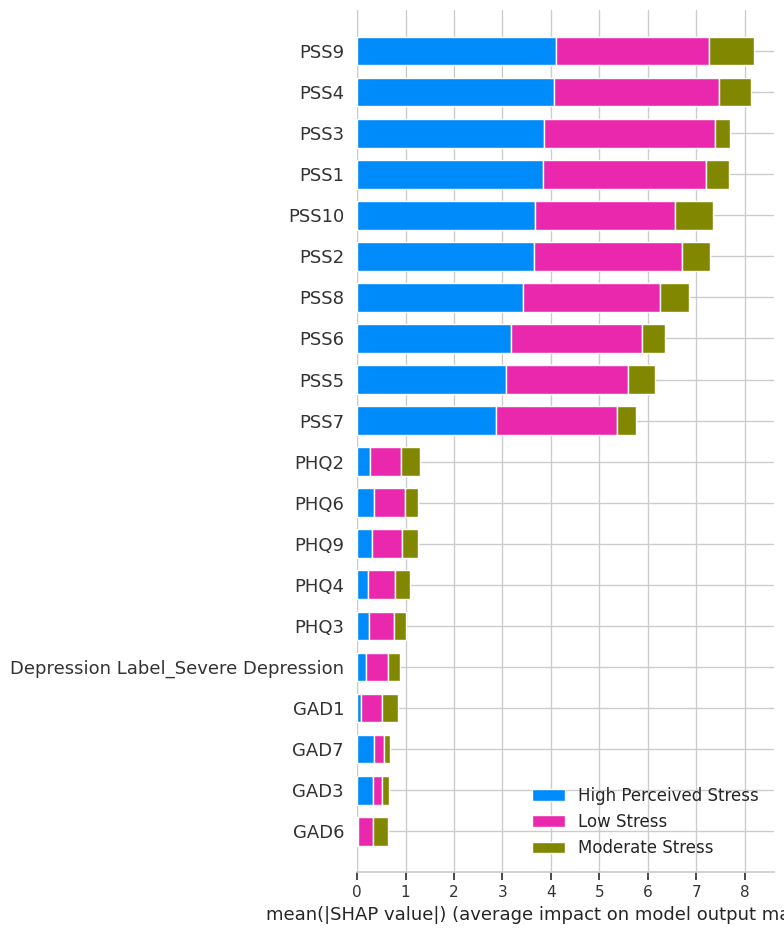


===== TARGET: Anxiety Label =====


,Accuracy,F1-weighted,Precision-weighted,Recall-weighted
Model,,,,
DecisionTree,0.878360,0.878358,0.878421,0.878360
RandomForest,0.933132,0.933439,0.933918,0.933132
GradientBoosting,0.954973,0.955027,0.955100,0.954973
AdaBoost,0.700941,0.682112,0.803970,0.700941
XGBoost,0.963038,0.963064,0.963118,0.963038
SVM,0.971774,0.971788,0.971891,0.971774
KNN,0.862903,0.862803,0.869030,0.862903
LogisticRegression,0.989247,0.989249,0.989276,0.989247
NaiveBayes,0.664987,0.591259,0.658735,0.664987


Best ML Model: LogisticRegression


,Accuracy,F1-weighted,Precision-weighted,Recall-weighted
Model,,,,
FNN,0.982759,0.982640,0.982769,0.982759
CNN,0.965517,0.965224,0.966797,0.965517
LSTM,0.987685,0.987659,0.987655,0.987685
GRU,0.987685,0.987726,0.987888,0.987685


Best DL Model: GRU
Best hyperparameters: {'C': 10}


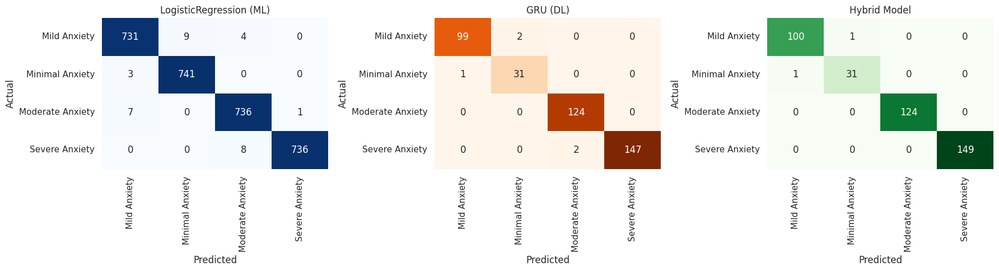

,Accuracy,F1-weighted,Precision-weighted,Recall-weighted
Model,,,,
Hybrid (LogisticRegression+GRU),0.995074,0.995074,0.995074,0.995074


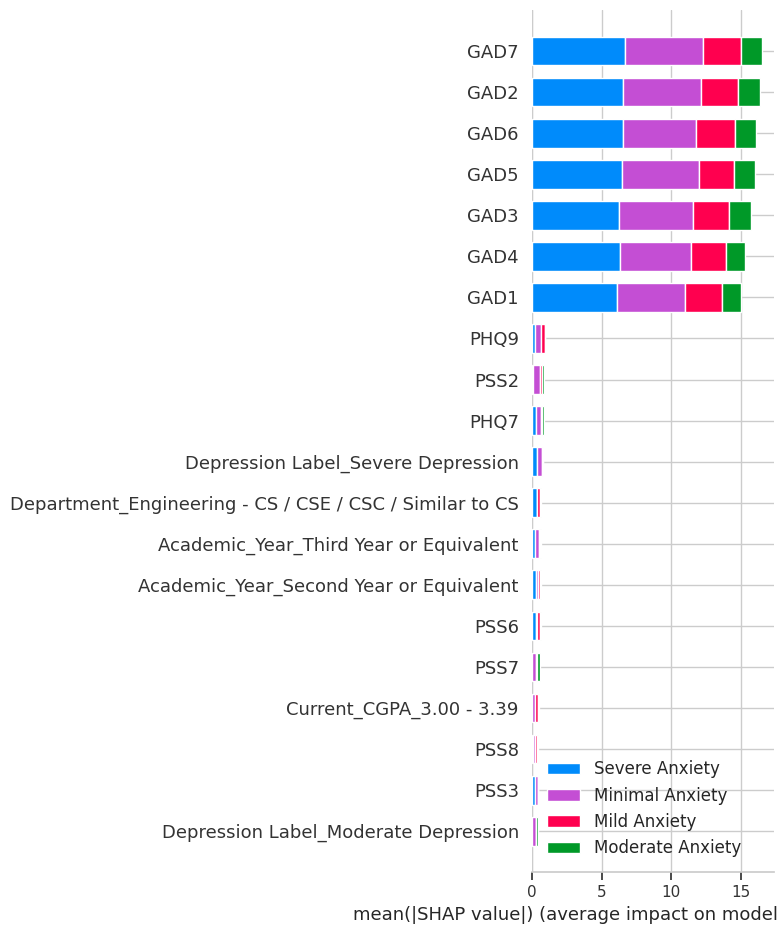

In [ ]:
!pip install torchviz shap imbalanced-learn xgboost catboost -q

# ===============================
# IMPORTS
# ===============================
import os
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import TensorDataset, DataLoader

from sklearn.model_selection import StratifiedKFold, cross_val_predict, train_test_split, GridSearchCV
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.metrics import classification_report, confusion_matrix, f1_score, accuracy_score, precision_score, recall_score
from sklearn.base import clone
import warnings
warnings.filterwarnings("ignore", category=UserWarning)
warnings.simplefilter(action='ignore', category=FutureWarning)

# ML models
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from imblearn.over_sampling import SMOTE

# Visualizations
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="whitegrid")
from torchviz import make_dot
import shap

# ===============================
# RANDOM SEED
# ===============================
RANDOM_STATE = 42
torch.manual_seed(RANDOM_STATE)
np.random.seed(RANDOM_STATE)

# ===============================
# LOAD DATA
# ===============================
DATA_PATH = os.path.join(path, "Processed.csv")  # 'path' from kagglehub.dataset_download
df = pd.read_csv(DATA_PATH)

# ===============================
# FEATURES & TARGETS
# ===============================
X = df.drop(columns=[
    'Stress Label', 'Stress Value',
    'Anxiety Label', 'Anxiety Value'
])
targets = ['Stress Label', 'Anxiety Label']

# ===============================
# PREPROCESSING
# ===============================
num_cols = X.select_dtypes(include=np.number).columns
cat_cols = X.select_dtypes(include='object').columns

# Impute missing values
X[num_cols] = SimpleImputer(strategy='median').fit_transform(X[num_cols])
X[cat_cols] = SimpleImputer(strategy='most_frequent').fit_transform(X[cat_cols])

# Encode categorical
for col in cat_cols:
    if X[col].nunique() == 2:
        X[col] = LabelEncoder().fit_transform(X[col])
    else:
        X = pd.get_dummies(X, columns=[col], drop_first=True)

# Scale numeric
X[num_cols] = StandardScaler().fit_transform(X[num_cols])
X_np = X.values.astype(np.float32)

# ===============================
# ML MODELS
# ===============================
models = {
    "DecisionTree": DecisionTreeClassifier(random_state=RANDOM_STATE),
    "RandomForest": RandomForestClassifier(random_state=RANDOM_STATE),
    "GradientBoosting": GradientBoostingClassifier(random_state=RANDOM_STATE),
    "AdaBoost": AdaBoostClassifier(random_state=RANDOM_STATE),
    "XGBoost": XGBClassifier(eval_metric='mlogloss', random_state=RANDOM_STATE),
    "SVM": SVC(probability=True, random_state=RANDOM_STATE),
    "KNN": KNeighborsClassifier(),
    "LogisticRegression": LogisticRegression(max_iter=1000, random_state=RANDOM_STATE),
    "NaiveBayes": GaussianNB(),
    "CatBoost": CatBoostClassifier(verbose=0, random_state=RANDOM_STATE)
}

param_grids = {
    "DecisionTree": {"max_depth": [3, 5, 10, None], "min_samples_split": [2, 5, 10]},
    "RandomForest": {"n_estimators": [50, 100], "max_depth": [5, 10, None]},
    "GradientBoosting": {"n_estimators": [50, 100], "learning_rate": [0.01, 0.1], "max_depth": [3, 5]},
    "AdaBoost": {"n_estimators": [50, 100], "learning_rate": [0.01, 0.1]},
    "XGBoost": {"n_estimators": [50, 100], "learning_rate": [0.01, 0.1], "max_depth": [3, 5]},
    "SVM": {"C": [0.1, 1, 10], "kernel": ["linear", "rbf"]},
    "KNN": {"n_neighbors": [3, 5, 7]},
    "LogisticRegression": {"C": [0.1, 1, 10]},
    "NaiveBayes": {},
    "CatBoost": {"iterations": [50, 100], "learning_rate": [0.01, 0.1]}
}

# ===============================
# DEEP LEARNING MODELS
# ===============================
class FNN(nn.Module):
    def __init__(self, input_dim, output_dim, hidden_dim=64):
        super(FNN, self).__init__()
        self.fc1 = nn.Linear(input_dim, hidden_dim)
        self.fc2 = nn.Linear(hidden_dim, hidden_dim)
        self.out = nn.Linear(hidden_dim, output_dim)
    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        return self.out(x)

class CNN(nn.Module):
    def __init__(self, input_dim, output_dim):
        super(CNN, self).__init__()
        self.conv1 = nn.Conv1d(1, 16, 3, padding=1)
        self.conv2 = nn.Conv1d(16, 32, 3, padding=1)
        self.fc = nn.Linear(32*input_dim, output_dim)
    def forward(self, x):
        x = x.unsqueeze(1)
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        x = x.view(x.size(0), -1)
        return self.fc(x)

class LSTM(nn.Module):
    def __init__(self, input_dim, output_dim, hidden_dim=64):
        super(LSTM, self).__init__()
        self.lstm = nn.LSTM(input_dim, hidden_dim, batch_first=True)
        self.fc = nn.Linear(hidden_dim, output_dim)
    def forward(self, x):
        x = x.unsqueeze(1)
        out, _ = self.lstm(x)
        return self.fc(out[:, -1, :])

class GRU(nn.Module):
    def __init__(self, input_dim, output_dim, hidden_dim=64):
        super(GRU, self).__init__()
        self.gru = nn.GRU(input_dim, hidden_dim, batch_first=True)
        self.fc = nn.Linear(hidden_dim, output_dim)
    def forward(self, x):
        x = x.unsqueeze(1)
        out, _ = self.gru(x)
        return self.fc(out[:, -1, :])

def create_loader(X, y, batch_size=32):
    dataset = TensorDataset(torch.tensor(X, dtype=torch.float32),
                            torch.tensor(y, dtype=torch.long))
    return DataLoader(dataset, batch_size=batch_size, shuffle=True)

def train_dl(model, X, y, epochs=20, lr=0.001):
    loader = create_loader(X, y)
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    model.train()
    for _ in range(epochs):
        for xb, yb in loader:
            optimizer.zero_grad()
            loss = criterion(model(xb), yb)
            loss.backward()
            optimizer.step()
    return model

# ===============================
# HELPER FUNCTION: COMBINED CM
# ===============================
def plot_cm(cm, class_names, title, ax, cmap='Blues'):
    sns.heatmap(cm, annot=True, fmt='d', xticklabels=class_names, yticklabels=class_names,
                cmap=cmap, cbar=False, ax=ax)
    ax.set_title(title)
    ax.set_xlabel("Predicted")
    ax.set_ylabel("Actual")

# ===============================
# TRAINING AND EVALUATION
# ===============================
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=RANDOM_STATE)

for target_col in targets:
    print(f"\n===== TARGET: {target_col} =====")

    y = df[target_col].values
    le = LabelEncoder()
    y_encoded = le.fit_transform(y)
    class_names = le.classes_
    num_classes = len(class_names)

    # ----------------------
    # ML MODELS
    # ----------------------
    ml_cms = {}
    ml_results = []
    for name, model in models.items():
        sm = SMOTE(random_state=RANDOM_STATE)
        X_res, y_res = sm.fit_resample(X_np, y_encoded)
        y_pred = cross_val_predict(model, X_res, y_res, cv=kf)
        ml_cms[name] = confusion_matrix(y_res, y_pred)

        report = classification_report(y_res, y_pred, output_dict=True, zero_division=0)
        ml_results.append({
            'Model': name,
            'Accuracy': report['accuracy'],
            'F1-weighted': report['weighted avg']['f1-score'],
            'Precision-weighted': report['weighted avg']['precision'],
            'Recall-weighted': report['weighted avg']['recall']
        })
    ml_df = pd.DataFrame(ml_results).set_index('Model')
    display(ml_df)
    best_ml_name = ml_df['F1-weighted'].idxmax()
    print(f"Best ML Model: {best_ml_name}")

    # ----------------------
    # DL MODELS
    # ----------------------
    Xtr, Xte, ytr, yte = train_test_split(X_np, y_encoded, test_size=0.2, stratify=y_encoded, random_state=RANDOM_STATE)
    dl_models = {"FNN": FNN, "CNN": CNN, "LSTM": LSTM, "GRU": GRU}

    dl_cms = {}
    dl_trained = {}
    dl_results = []
    for name, cls in dl_models.items():
        model = cls(X_np.shape[1], num_classes)
        model = train_dl(model, Xtr, ytr, epochs=15)
        model.eval()
        y_prob = torch.softmax(model(torch.tensor(Xte)),1).detach().numpy()
        y_pred = y_prob.argmax(1)
        dl_trained[name] = model
        dl_cms[name] = confusion_matrix(yte, y_pred)

        report = classification_report(yte, y_pred, output_dict=True, zero_division=0)
        dl_results.append({
            'Model': name,
            'Accuracy': report['accuracy'],
            'F1-weighted': report['weighted avg']['f1-score'],
            'Precision-weighted': report['weighted avg']['precision'],
            'Recall-weighted': report['weighted avg']['recall']
        })
    dl_df = pd.DataFrame(dl_results).set_index('Model')
    display(dl_df)
    best_dl_name = dl_df['F1-weighted'].idxmax()
    print(f"Best DL Model: {best_dl_name}")

    # ----------------------
    # BEST ML MODEL TUNING
    # ----------------------
    best_model = models[best_ml_name]
    if best_ml_name in param_grids and param_grids[best_ml_name]:
        grid = GridSearchCV(best_model, param_grids[best_ml_name], cv=5, scoring='f1_weighted', n_jobs=-1)
        grid.fit(Xtr, ytr)
        best_ml_model = grid.best_estimator_
        print(f"Best hyperparameters: {grid.best_params_}")
    else:
        best_ml_model = clone(best_model)
        best_ml_model.fit(Xtr, ytr)

    best_dl_model = dl_trained[best_dl_name]

    # ----------------------
    # HYBRID PREDICTION
    # ----------------------
    if hasattr(best_ml_model, "predict_proba"):
        ml_prob = best_ml_model.predict_proba(Xte)
    else:
        ml_prob = best_ml_model.decision_function(Xte)
        ml_prob = np.exp(ml_prob)/np.sum(np.exp(ml_prob), axis=1, keepdims=True)

    dl_prob = torch.softmax(best_dl_model(torch.tensor(Xte)),1).detach().numpy()
    hybrid_prob = (ml_prob + dl_prob)/2
    hybrid_pred = hybrid_prob.argmax(1)
    hybrid_cm = confusion_matrix(yte, hybrid_pred)

    # ----------------------
    # PLOT ALL CONFUSION MATRICES TOGETHER
    # ----------------------
    fig, axes = plt.subplots(1, 3, figsize=(18,5))
    plot_cm(ml_cms[best_ml_name], class_names, f"{best_ml_name} (ML)", axes[0], cmap='Blues')
    plot_cm(dl_cms[best_dl_name], class_names, f"{best_dl_name} (DL)", axes[1], cmap='Oranges')
    plot_cm(hybrid_cm, class_names, "Hybrid Model", axes[2], cmap='Greens')
    plt.tight_layout()
    plt.show()

    # ----------------------
    # HYBRID METRICS
    # ----------------------
    hybrid_acc = accuracy_score(yte, hybrid_pred)
    hybrid_prec = precision_score(yte, hybrid_pred, average='weighted', zero_division=0)
    hybrid_rec = recall_score(yte, hybrid_pred, average='weighted', zero_division=0)
    hybrid_f1 = f1_score(yte, hybrid_pred, average='weighted', zero_division=0)

    hybrid_df = pd.DataFrame([{
        'Model': f'Hybrid ({best_ml_name}+{best_dl_name})',
        'Accuracy': hybrid_acc,
        'F1-weighted': hybrid_f1,
        'Precision-weighted': hybrid_prec,
        'Recall-weighted': hybrid_rec
    }]).set_index('Model')
    display(hybrid_df)

    # ----------------------
    # SHAP PLOT
    # ----------------------
    explainer = shap.Explainer(best_ml_model, Xtr)
    shap_values = explainer(Xte)
    plt.figure(figsize=(12, 8))
    shap.summary_plot(shap_values, Xte, feature_names=X.columns, class_names=class_names, show=False)
    plt.tight_layout()
    plt.show()


Using Colab cache for faster access to the 'public-private-university-student' dataset.
Classes: ['Mild Depression' 'Minimal Depression' 'Moderate Depression'
 'Moderately Severe Depression' 'No Depression' 'Severe Depression']
DecisionTree best params: {'max_depth': 5, 'min_samples_split': 2}
RandomForest best params: {'max_depth': 5, 'n_estimators': 50}
GradientBoosting best params: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50}
AdaBoost best params: {'learning_rate': 0.1, 'n_estimators': 50}
XGBoost best params: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 50}
SVM best params: {'C': 1, 'kernel': 'linear'}
KNN best params: {'n_neighbors': 3}
LogisticRegression best params: {'C': 1}
CatBoost best params: {'iterations': 50, 'learning_rate': 0.1}


,Accuracy,F1-weighted,Precision-weighted,Recall-weighted
Model,,,,
DecisionTree,0.762883,0.760777,0.761398,0.762883
RandomForest,0.853229,0.850457,0.852246,0.853229
GradientBoosting,0.886497,0.886669,0.887173,0.886497
AdaBoost,0.510763,0.455367,0.472188,0.510763
XGBoost,0.861383,0.859578,0.861165,0.861383
SVM,0.994129,0.994129,0.994132,0.994129
KNN,0.820287,0.816968,0.819522,0.820287
LogisticRegression,0.960861,0.960801,0.961351,0.960861
NaiveBayes,0.776582,0.778434,0.781041,0.776582


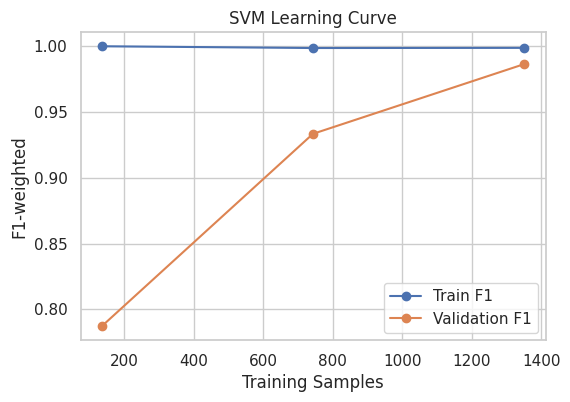

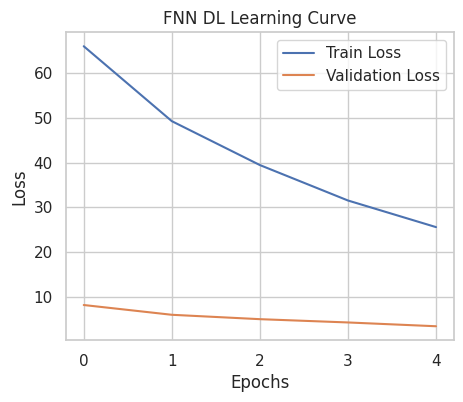

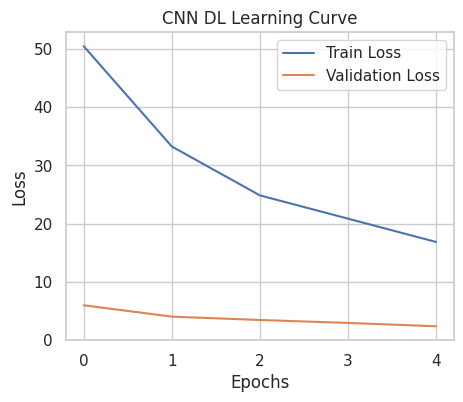

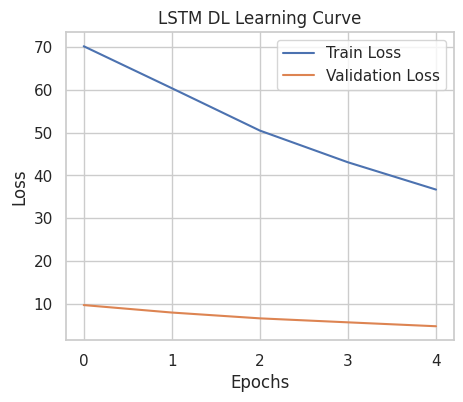

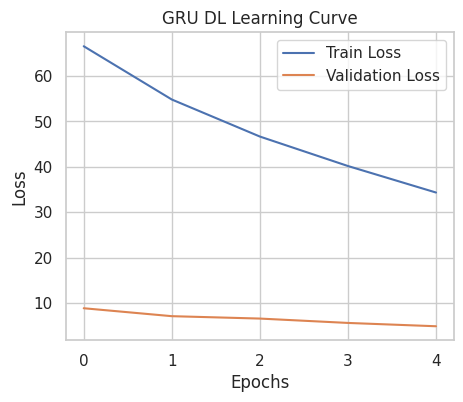

,Model,Accuracy,F1-weighted,Precision-weighted,Recall-weighted
0,FNN,0.793103,0.767004,0.748197,0.793103
1,CNN,0.832512,0.831350,0.849660,0.832512
2,LSTM,0.751232,0.720882,0.721358,0.751232
3,GRU,0.729064,0.697963,0.691274,0.729064


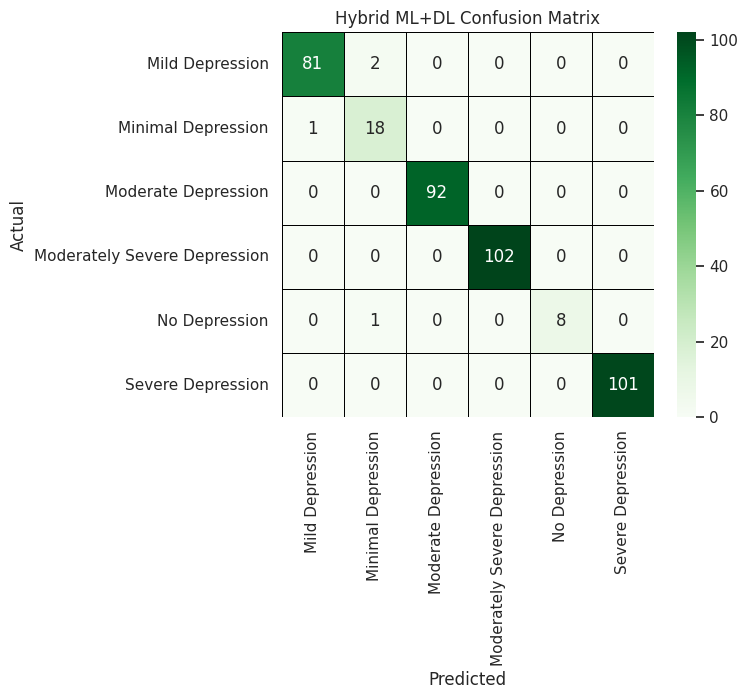

,Model,Accuracy,F1-weighted,Precision-weighted,Recall-weighted
0,Hybrid ML+DL,0.990148,0.990299,0.990821,0.990148


ML Confusion Matrices:


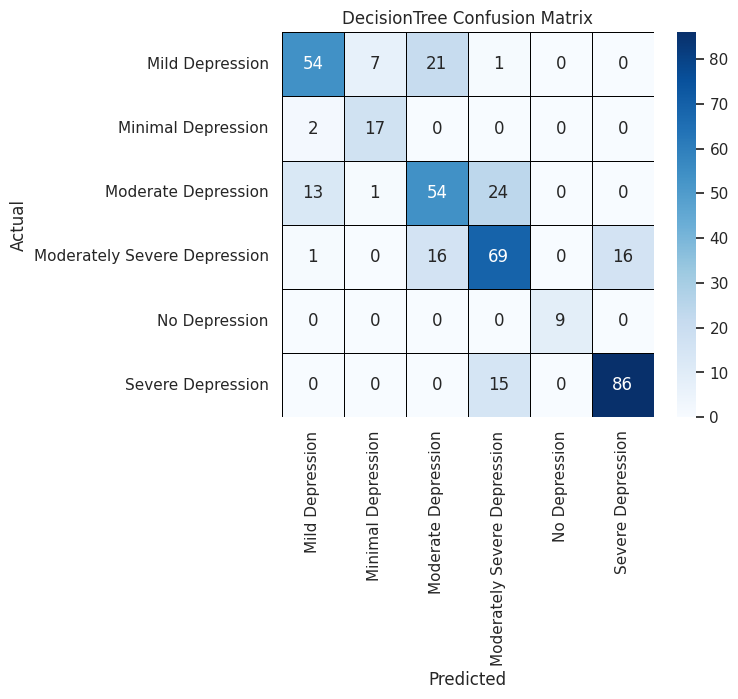

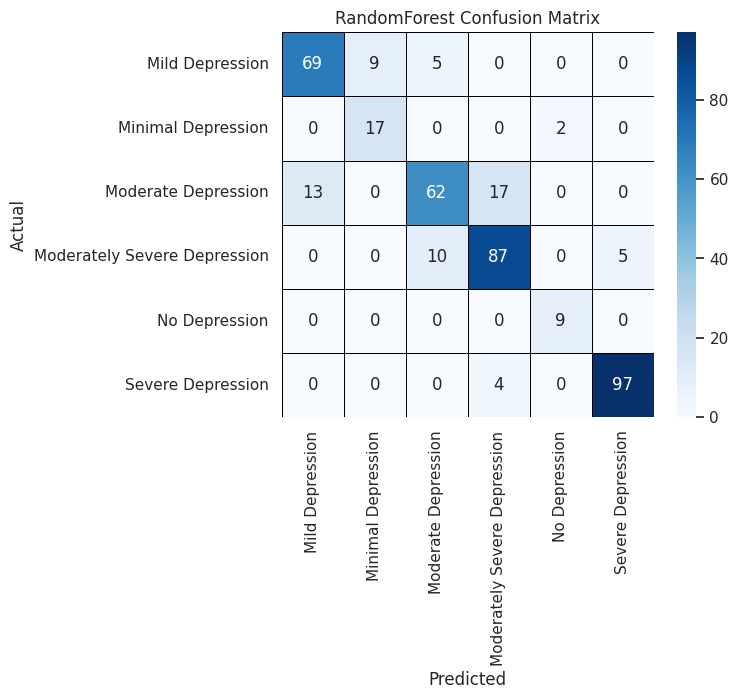

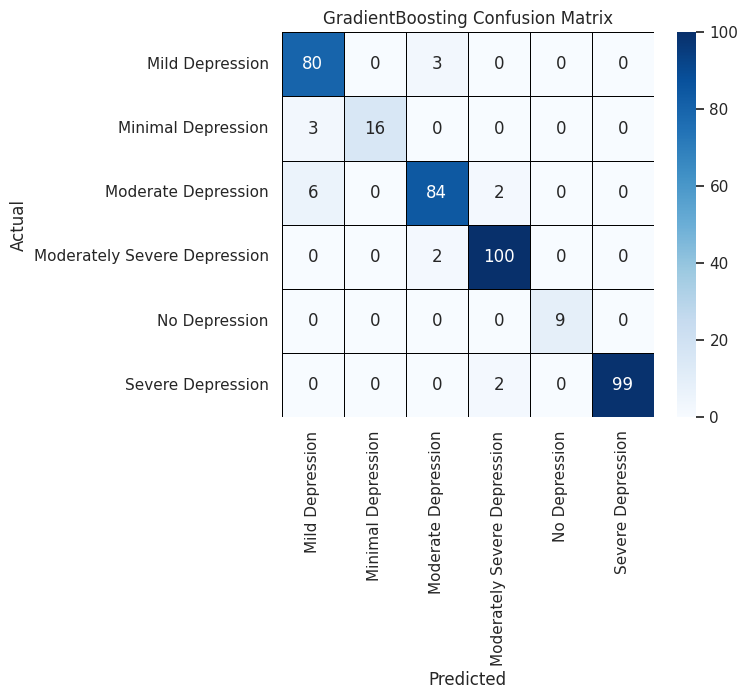

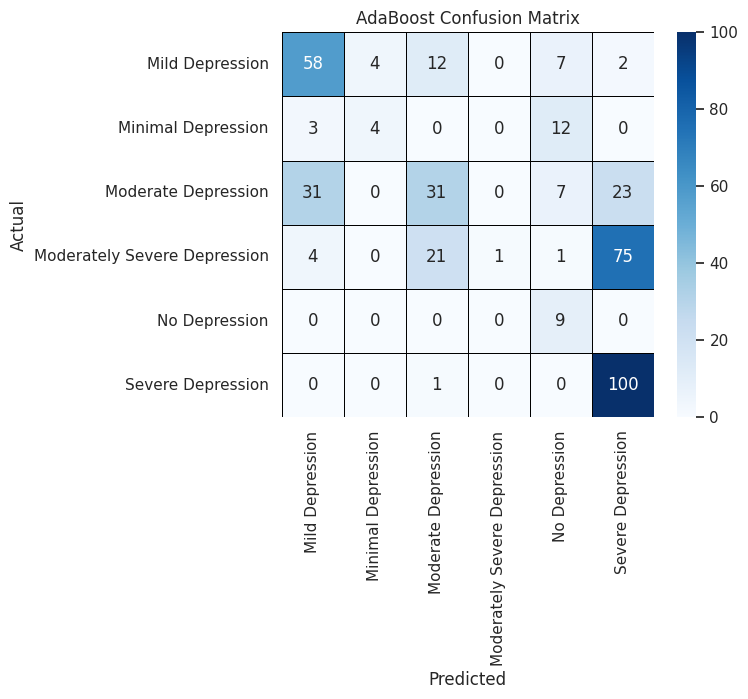

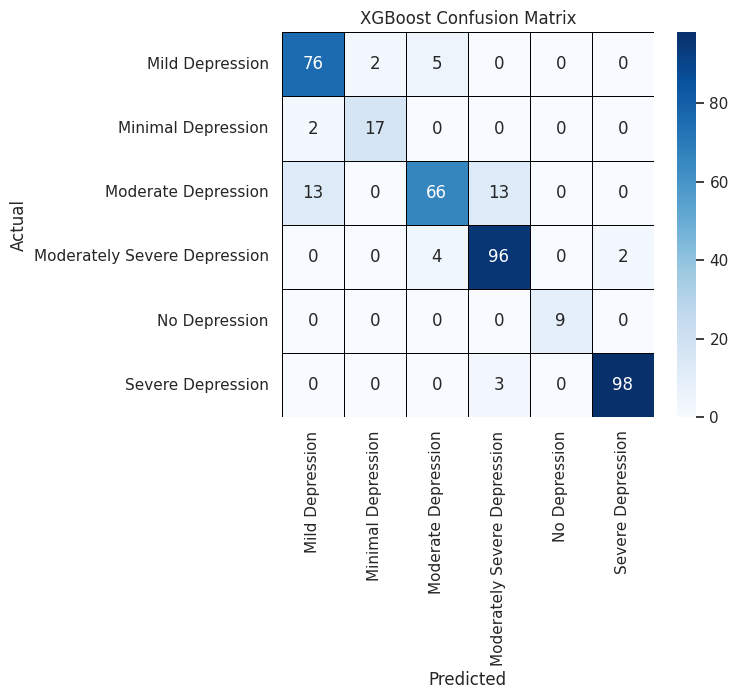

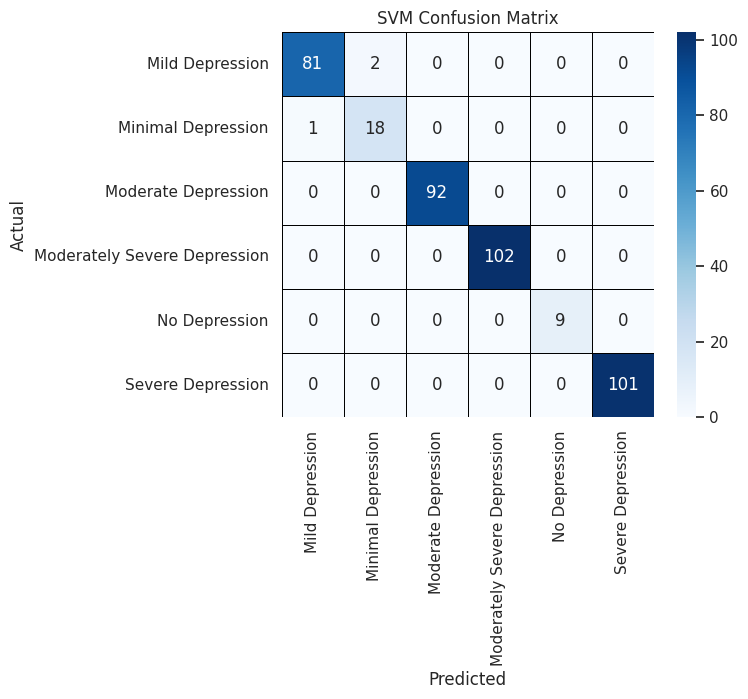

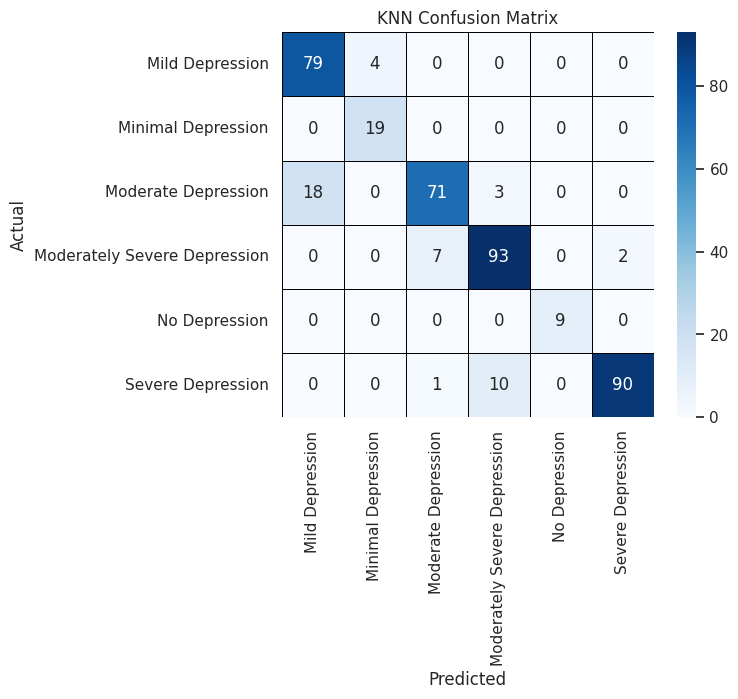

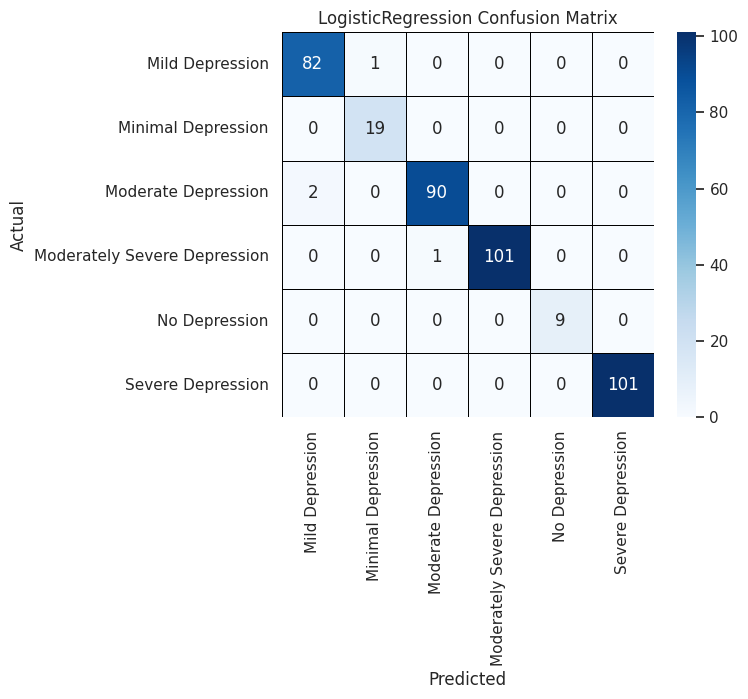

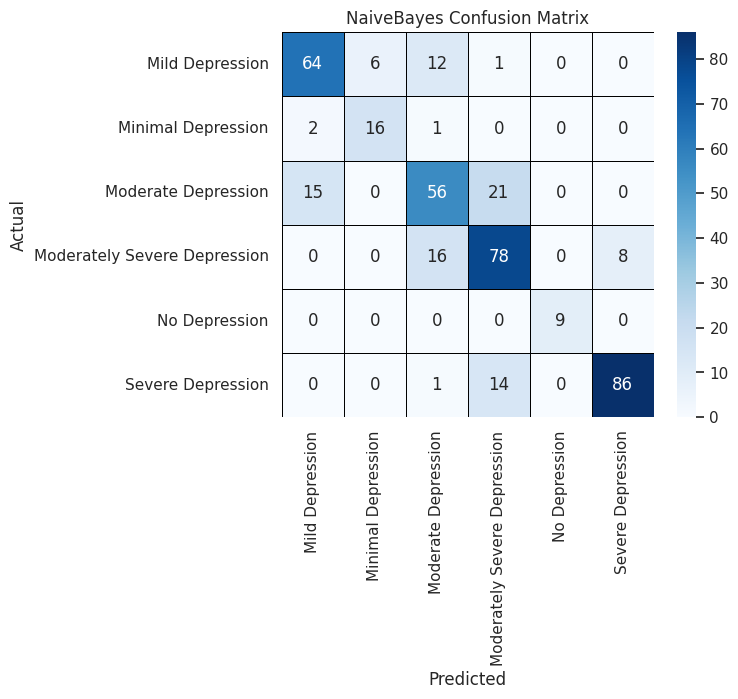

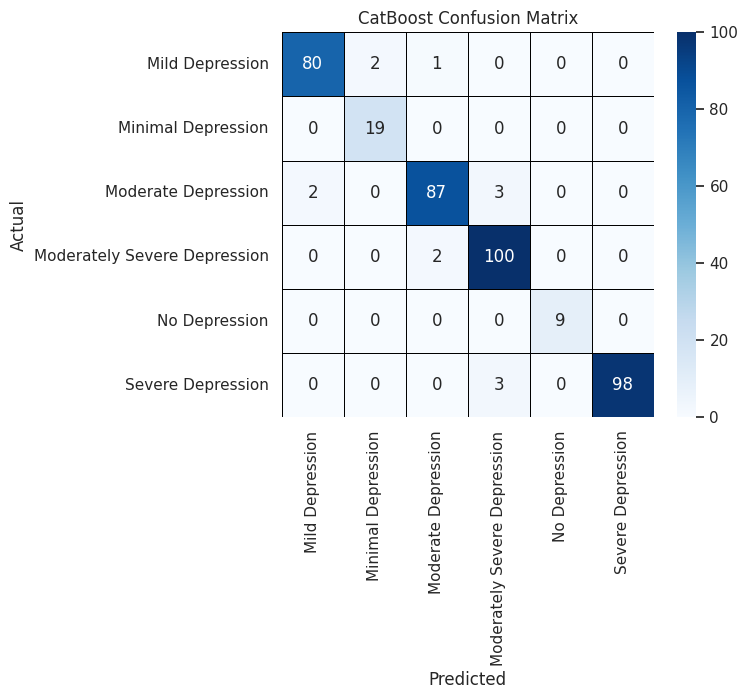

DL Confusion Matrices:


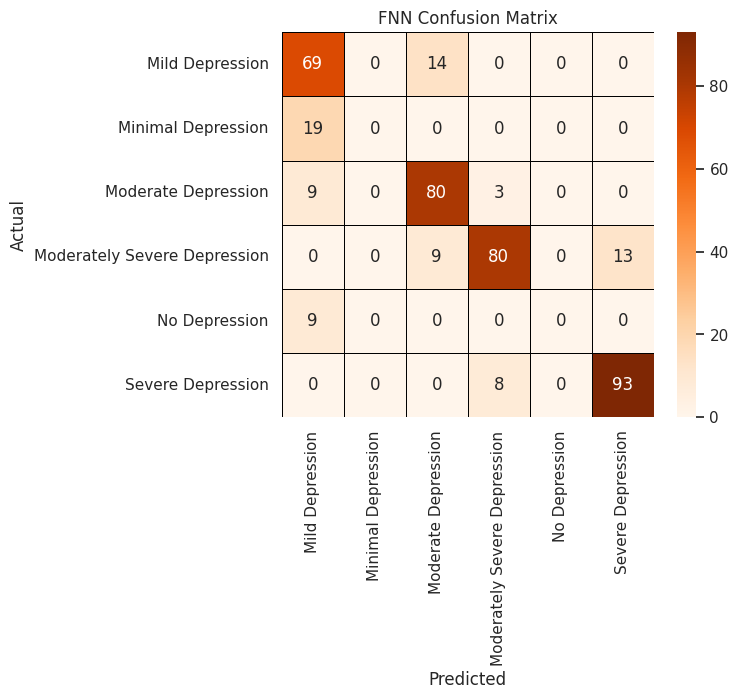

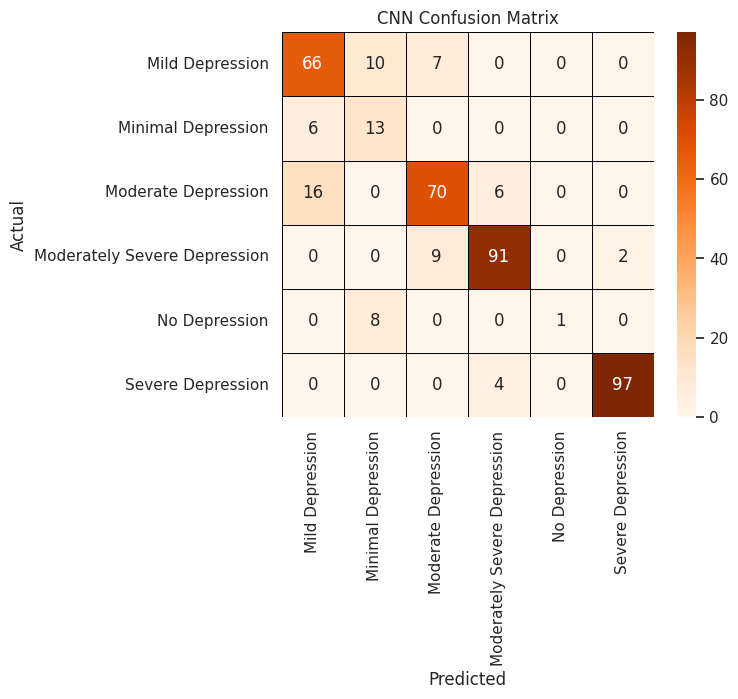

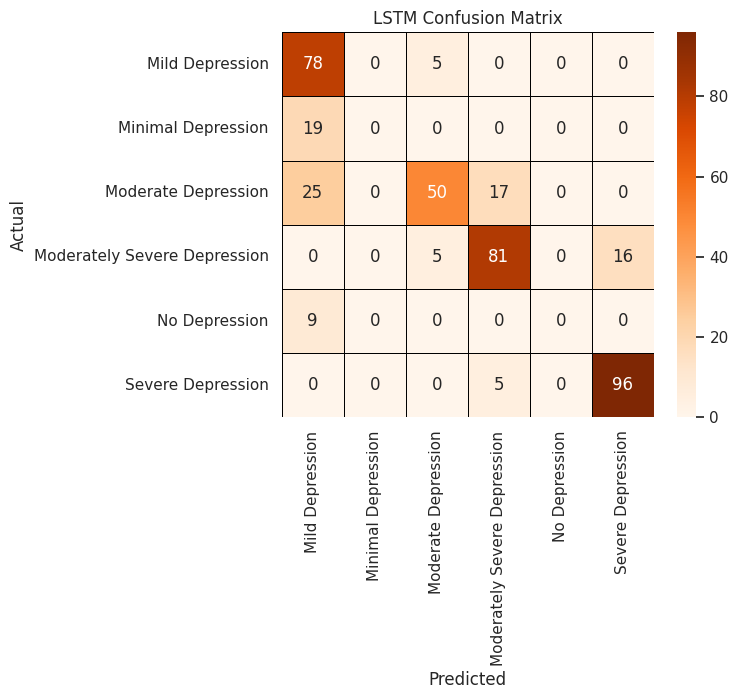

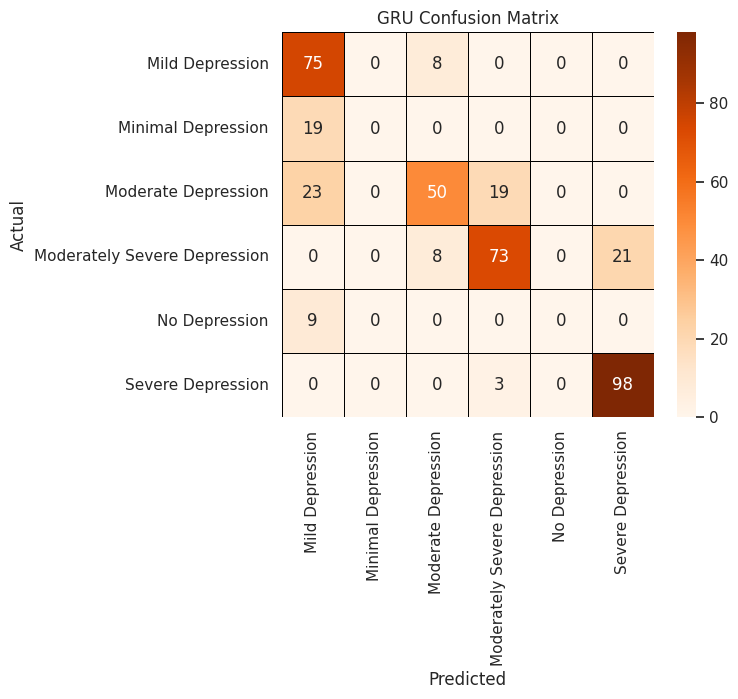

,Accuracy,F1-weighted,Precision-weighted,Recall-weighted,Type,Model
Model,,,,,,
SVM,0.994129,0.994129,0.994132,0.994129,ML,nan
Hybrid ML+DL,0.990148,0.990299,0.990821,0.990148,Hybrid,Hybrid ML+DL
LogisticRegression,0.960861,0.960801,0.961351,0.960861,ML,nan
CatBoost,0.920744,0.920739,0.921427,0.920744,ML,nan
GradientBoosting,0.886497,0.886669,0.887173,0.886497,ML,nan
XGBoost,0.861383,0.859578,0.861165,0.861383,ML,nan
RandomForest,0.853229,0.850457,0.852246,0.853229,ML,nan
CNN,0.832512,0.831350,0.849660,0.832512,DL,CNN
KNN,0.820287,0.816968,0.819522,0.820287,ML,nan


✅ Best ML Model: SVM
✅ Best DL Model: CNN
✅ Best Hybrid Model: Hybrid ML+DL


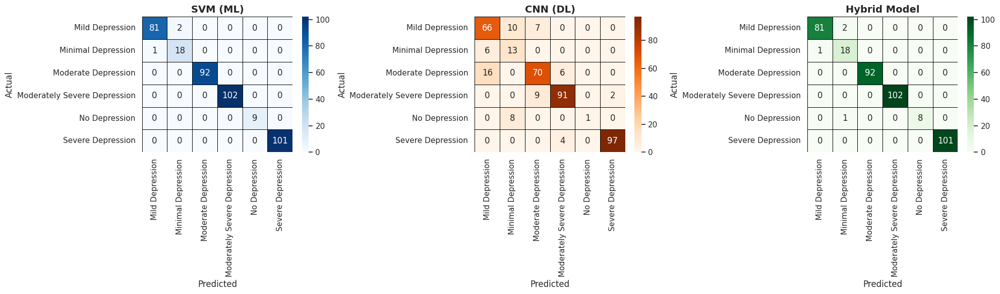

In [ ]:
# ===============================
# INSTALL
# ===============================
!pip install torchviz shap imbalanced-learn xgboost catboost -q

# ===============================
# IMPORTS
# ===============================
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader

from sklearn.model_selection import StratifiedKFold, cross_val_predict, train_test_split, GridSearchCV, learning_curve
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score

from sklearn.feature_selection import SelectKBest, f_classif, SelectFromModel
from sklearn.base import clone

# ML models
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from xgboost import XGBClassifier
from catboost import CatBoostClassifier

# SMOTE
from imblearn.over_sampling import BorderlineSMOTE

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="whitegrid")

# ===============================
# RANDOM SEED
# ===============================
RANDOM_STATE = 42
np.random.seed(RANDOM_STATE)
torch.manual_seed(RANDOM_STATE)

# ===============================
# LOAD DATA
# ===============================
import os
import kagglehub
# Re-download the dataset to ensure 'path' is defined in this scope
path = kagglehub.dataset_download("puspitahelal/public-private-university-student")
DATA_PATH = os.path.join(path, "Processed.csv")
df = pd.read_csv(DATA_PATH)

# ===============================
# FEATURES & TARGETS
# ===============================
target_col = "Depression Label"
X = df.drop(columns=[
    'Stress Label','Stress Value',
    'Anxiety Label','Anxiety Value',
    'Depression Label','Depression Value'
])

# ===============================
# PREPROCESSING
# ===============================
num_cols = X.select_dtypes(include=np.number).columns
cat_cols = X.select_dtypes(include='object').columns

# Impute missing
X[num_cols] = SimpleImputer(strategy='median').fit_transform(X[num_cols])
X[cat_cols] = SimpleImputer(strategy='most_frequent').fit_transform(X[cat_cols])

# Encode categorical
for col in cat_cols:
    if X[col].nunique() == 2:
        X[col] = LabelEncoder().fit_transform(X[col])
    else:
        X = pd.get_dummies(X, columns=[col], drop_first=True)

# Scale numeric
X[num_cols] = StandardScaler().fit_transform(X[num_cols])
X_np = X.values.astype(np.float32)

# Encode target numerically
le = LabelEncoder()
y = le.fit_transform(df[target_col])
n_classes = len(np.unique(y))
print("Classes:", le.classes_)

# ===============================
# FEATURE SELECTION
# ===============================
def anova_selection(X, y, k=30):
    selector = SelectKBest(f_classif, k=min(k,X.shape[1]))
    selector.fit(X, y)
    return X.columns[selector.get_support()]

def embedded_rf_selection(X, y):
    rf = RandomForestClassifier(random_state=RANDOM_STATE)
    selector = SelectFromModel(rf)
    selector.fit(X, y)
    return X.columns[selector.get_support()]

def embedded_l1_selection(X, y):
    l1 = LogisticRegression(penalty='l1', solver='liblinear', C=0.1, max_iter=500)
    selector = SelectFromModel(l1)
    selector.fit(X, y)
    return X.columns[selector.get_support()]

def combined_features(X, y):
    f1 = set(anova_selection(X, y))
    f2 = set(embedded_rf_selection(X, y))
    f3 = set(embedded_l1_selection(X, y))
    combined = list(f1 & f2 | f3)
    return X[combined]

X_fs = combined_features(X, y)
X_np = X_fs.values.astype(np.float32)

# ===============================
# ML MODELS & HYPERPARAMS
# ===============================
models = {
    "DecisionTree": DecisionTreeClassifier(random_state=RANDOM_STATE),
    "RandomForest": RandomForestClassifier(random_state=RANDOM_STATE),
    "GradientBoosting": GradientBoostingClassifier(random_state=RANDOM_STATE),
    "AdaBoost": AdaBoostClassifier(random_state=RANDOM_STATE),
    "XGBoost": XGBClassifier(eval_metric='mlogloss', random_state=RANDOM_STATE),
    "SVM": SVC(probability=True),
    "KNN": KNeighborsClassifier(),
    "LogisticRegression": LogisticRegression(max_iter=500),
    "NaiveBayes": GaussianNB(),
    "CatBoost": CatBoostClassifier(verbose=0, random_state=RANDOM_STATE)
}

param_grids = {
    "DecisionTree": {"max_depth":[5], "min_samples_split":[2]},
    "RandomForest": {"n_estimators":[50], "max_depth":[5]},
    "GradientBoosting":{"n_estimators":[50], "learning_rate":[0.1], "max_depth":[3]},
    "AdaBoost":{"n_estimators":[50],"learning_rate":[0.1]},
    "XGBoost":{"n_estimators":[50],"learning_rate":[0.1],"max_depth":[3]},
    "SVM":{"C":[1], "kernel":["linear"]},
    "KNN":{"n_neighbors":[3]},
    "LogisticRegression":{"C":[1]},
    "NaiveBayes":{},
    "CatBoost":{"iterations":[50], "learning_rate":[0.1]}
}

# ===============================
# DL MODELS
# ===============================
class FNN(nn.Module):
    def __init__(self, d, c):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(d,32), nn.ReLU(),
            nn.Linear(32,32), nn.ReLU(),
            nn.Linear(32,c)
        )
    def forward(self, x):
        return self.net(x)

class CNN(nn.Module):
    def __init__(self,d,c):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv1d(1,16,3,padding=1), nn.ReLU(),
            nn.Conv1d(16,32,3,padding=1), nn.ReLU()
        )
        # Fix: Add the fully connected layer here
        self.fc = nn.Linear(32*d,c)
    def forward(self,x):
        x = self.conv(x.unsqueeze(1))
        return self.fc(x.view(x.size(0),-1))

class LSTM(nn.Module):
    def __init__(self,d,c):
        super().__init__()
        self.lstm = nn.LSTM(d,32,batch_first=True)
        self.fc = nn.Linear(32,c)
    def forward(self,x):
        out,_ = self.lstm(x.unsqueeze(1))
        return self.fc(out[:,-1])

class GRU(nn.Module):
    def __init__(self,d,c):
        super().__init__()
        self.gru = nn.GRU(d,32,batch_first=True)
        self.fc = nn.Linear(32,c)
    def forward(self,x):
        out,_ = self.gru(x.unsqueeze(1))
        return self.fc(out[:,-1])

# ===============================
# DATA LOADERS & TRAINING UTILITIES
# ===============================
def create_loader(X, y, bs=32):
    dataset = TensorDataset(torch.tensor(X,dtype=torch.float32),
                            torch.tensor(y,dtype=torch.long))
    return DataLoader(dataset, batch_size=bs, shuffle=True)

def train_dl_with_curve(model, Xtr, ytr, Xval, yval, epochs=5):
    train_loss, val_loss = [], []
    opt = torch.optim.Adam(model.parameters(), lr=0.001)
    loss_fn = nn.CrossEntropyLoss()
    for _ in range(epochs):
        model.train()
        tl = 0
        for xb, yb in create_loader(Xtr, ytr):
            opt.zero_grad()
            loss = loss_fn(model(xb), yb)
            loss.backward()
            opt.step()
            tl += loss.item()
        train_loss.append(tl)

        model.eval()
        vl = 0
        with torch.no_grad():
            for xb, yb in create_loader(Xval, yval, bs=64):
                vl += loss_fn(model(xb), yb).item()
        val_loss.append(vl)
    return model, train_loss, val_loss

def plot_ml_learning_curve(model, X, y, name):
    train_sizes, train_scores, val_scores = learning_curve(
        model, X, y, cv=3, scoring='f1_weighted',
        train_sizes=np.linspace(0.1,1.0,3), n_jobs=-1
    )
    plt.figure(figsize=(6,4))
    plt.plot(train_sizes, train_scores.mean(axis=1),'o-',label='Train F1')
    plt.plot(train_sizes, val_scores.mean(axis=1),'o-',label='Validation F1')
    plt.xlabel("Training Samples"); plt.ylabel("F1-weighted")
    plt.title(f"{name} Learning Curve"); plt.legend(); plt.grid(True); plt.show()

# ===============================
# SMOTE
# ===============================
smote = BorderlineSMOTE(random_state=RANDOM_STATE)
X_res, y_res = smote.fit_resample(X_np, y)

# ===============================
# STRATIFIED K-FOLD
# ===============================
kf = StratifiedKFold(3, shuffle=True, random_state=RANDOM_STATE)

# ===============================
# ML TRAINING & HYPERPARAMETER TUNING
# ===============================
ml_results=[]
ml_best_models={}
for name, model in models.items():
    if name in param_grids and param_grids[name]:
        grid = GridSearchCV(model, param_grids[name], cv=kf, scoring='f1_weighted', n_jobs=-1)
        grid.fit(X_res, y_res)
        best_model = grid.best_estimator_
        print(f"{name} best params:", grid.best_params_)
    else:
        best_model = clone(model).fit(X_res, y_res)
    ml_best_models[name] = best_model
    y_pred = cross_val_predict(best_model, X_res, y_res, cv=kf)
    report = classification_report(y_res, y_pred, output_dict=True, zero_division=0)
    ml_results.append({
        "Model":name,
        "Accuracy":report['accuracy'],
        "F1-weighted":report['weighted avg']['f1-score'],
        "Precision-weighted":report['weighted avg']['precision'],
        "Recall-weighted":report['weighted avg']['recall']
    })
ml_df = pd.DataFrame(ml_results).set_index("Model")
display(ml_df)

# ML Learning Curve for best ML
best_ml_name = ml_df['F1-weighted'].idxmax()
plot_ml_learning_curve(ml_best_models[best_ml_name], X_np, y, best_ml_name)

# ===============================
# DL TRAINING
# ===============================
dl_models = {"FNN":FNN, "CNN":CNN, "LSTM":LSTM, "GRU":GRU}
dl_results=[]
dl_trained={}
Xtr, Xte, ytr, yte = train_test_split(X_np, y, test_size=0.2, stratify=y, random_state=RANDOM_STATE)
for name, cls in dl_models.items():
    Xtr_, Xval_, ytr_, yval_ = train_test_split(Xtr, ytr, test_size=0.2, stratify=ytr, random_state=RANDOM_STATE)
    model, tr_loss, val_loss = train_dl_with_curve(cls(X_np.shape[1], n_classes), Xtr_, ytr_, Xval_, yval_, epochs=5)
    dl_trained[name] = model
    y_pred = torch.softmax(model(torch.tensor(Xte)),1).argmax(1).numpy()
    dl_results.append({
        "Model":name,
        "Accuracy":accuracy_score(yte, y_pred),
        "F1-weighted":f1_score(yte, y_pred, average='weighted'),
        "Precision-weighted":precision_score(yte, y_pred, average='weighted'),
        "Recall-weighted":recall_score(yte, y_pred, average='weighted')
    })
    # DL learning curve
    plt.figure(figsize=(5,4))
    plt.plot(tr_loss,label="Train Loss")
    plt.plot(val_loss,label="Validation Loss")
    plt.title(f"{name} DL Learning Curve"); plt.xlabel("Epochs"); plt.ylabel("Loss"); plt.legend(); plt.show()
dl_df = pd.DataFrame(dl_results)
display(dl_df)
best_dl_name = dl_df.sort_values("F1-weighted",ascending=False).iloc[0]["Model"]

# ===============================
# HYBRID ML + DL
# ===============================
best_ml_model = ml_best_models[best_ml_name]
best_dl_model = dl_trained[best_dl_name]
best_ml_model.fit(Xtr, ytr)

# ML probabilities
if hasattr(best_ml_model,"predict_proba"):
    ml_prob = best_ml_model.predict_proba(Xte)
else:
    ml_prob = best_ml_model.decision_function(Xte)
    ml_prob = np.exp(ml_prob)/np.sum(np.exp(ml_prob),axis=1,keepdims=True)

# DL probabilities
best_dl_model.eval()
with torch.no_grad():
    dl_prob = torch.softmax(best_dl_model(torch.tensor(Xte,dtype=torch.float32)),1).numpy()

# Hybrid averaging
hybrid_prob = (ml_prob + dl_prob)/2
hybrid_pred = hybrid_prob.argmax(1)

# Confusion Matrix function
def plot_cm(y_true, y_pred, title="Confusion Matrix", cmap="Blues"):
    labels = np.arange(len(le.classes_))
    cm = confusion_matrix(y_true, y_pred, labels=labels)

    plt.figure(figsize=(6,5))
    sns.heatmap(
        cm, annot=True, fmt='d', cmap=cmap,
        xticklabels=le.classes_,
        yticklabels=le.classes_,
        linewidths=0.5, linecolor='black'
    )
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title(title)
    plt.show()


# Hybrid confusion matrix
plot_cm(yte, hybrid_pred, "Hybrid ML+DL Confusion Matrix", cmap="Greens")

# Hybrid metrics
hybrid_metrics = {
    "Model":"Hybrid ML+DL",
    "Accuracy":accuracy_score(yte, hybrid_pred),
    "F1-weighted":f1_score(yte, hybrid_pred, average='weighted'),
    "Precision-weighted":precision_score(yte, hybrid_pred, average='weighted'),
    "Recall-weighted":recall_score(yte, hybrid_pred, average='weighted')
}

hybrid_df = pd.DataFrame([hybrid_metrics])
display(hybrid_df)

# ===============================
# ML & DL Confusion Matrices
# ===============================
print("ML Confusion Matrices:")
ml_cm_dict = {}
for name, model in ml_best_models.items():
    y_pred = model.predict(Xte)
    ml_cm_dict[name] = confusion_matrix(yte, y_pred)
    plot_cm(yte, y_pred, f"{name} Confusion Matrix", cmap="Blues")

print("DL Confusion Matrices:")
dl_cm_dict = {}
for name, model in dl_trained.items():
    y_pred = torch.softmax(model(torch.tensor(Xte)),1).argmax(1).numpy()
    dl_cm_dict[name] = confusion_matrix(yte, y_pred)
    plot_cm(yte, y_pred, f"{name} Confusion Matrix", cmap="Oranges")

# ===============================
# SUMMARY TABLE FOR ALL MODELS
# ===============================
ml_summary = ml_df.copy()
ml_summary["Type"]="ML"
dl_summary = dl_df.copy()
dl_summary["Type"]="DL"
dl_summary.index=dl_summary["Model"]
hybrid_summary = hybrid_df.copy()
hybrid_summary["Type"]="Hybrid"
hybrid_summary.index=hybrid_summary["Model"]

all_summary = pd.concat([ml_summary, dl_summary, hybrid_summary], axis=0)
all_summary = all_summary.sort_values("F1-weighted", ascending=False)
display(all_summary.style.background_gradient(subset=["F1-weighted","Accuracy"], cmap="viridis"))

# ===============================
# BEST MODELS
# ===============================
print(f"✅ Best ML Model: {best_ml_name}")
print(f"✅ Best DL Model: {best_dl_name}")
print(f"✅ Best Hybrid Model: Hybrid ML+DL")
# ===============================
# CONFUSION MATRICES (IMAGE STYLE)
# ===============================

fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# ---------- BEST ML MODEL ----------
cm_ml = confusion_matrix(
    yte,
    ml_best_models[best_ml_name].predict(Xte)
)

sns.heatmap(
    cm_ml,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=le.classes_,
    yticklabels=le.classes_,
    linewidths=0.5,
    linecolor="black",
    ax=axes[0]
)
axes[0].set_title(f"{best_ml_name} (ML)", fontsize=14, fontweight="bold")
axes[0].set_xlabel("Predicted")
axes[0].set_ylabel("Actual")


# ---------- BEST DL MODEL ----------
best_dl_model.eval()
with torch.no_grad():
    dl_pred = torch.softmax(
        best_dl_model(torch.tensor(Xte, dtype=torch.float32)), 1
    ).argmax(1).numpy()

cm_dl = confusion_matrix(yte, dl_pred)

sns.heatmap(
    cm_dl,
    annot=True,
    fmt="d",
    cmap="Oranges",
    xticklabels=le.classes_,
    yticklabels=le.classes_,
    linewidths=0.5,
    linecolor="black",
    ax=axes[1]
)
axes[1].set_title(f"{best_dl_name} (DL)", fontsize=14, fontweight="bold")
axes[1].set_xlabel("Predicted")
axes[1].set_ylabel("Actual")


# ---------- HYBRID MODEL ----------
cm_hybrid = confusion_matrix(yte, hybrid_pred)

sns.heatmap(
    cm_hybrid,
    annot=True,
    fmt="d",
    cmap="Greens",
    xticklabels=le.classes_,
    yticklabels=le.classes_,
    linewidths=0.5,
    linecolor="black",
    ax=axes[2]
)
axes[2].set_title("Hybrid Model", fontsize=14, fontweight="bold")
axes[2].set_xlabel("Predicted")
axes[2].set_ylabel("Actual")


plt.tight_layout()
plt.show()




Using Colab cache for faster access to the 'public-private-university-student' dataset.


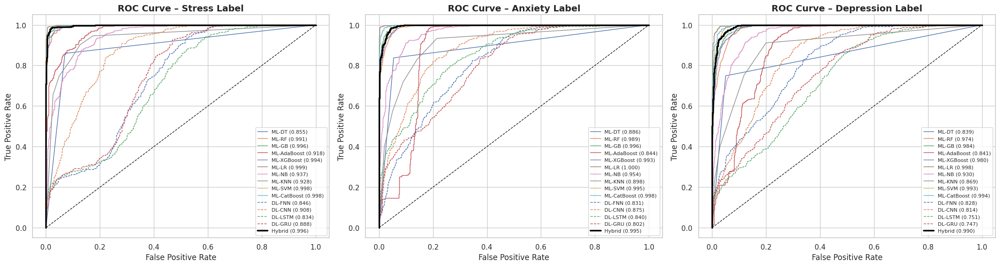

In [ ]:
# ===============================
# INSTALL
# ===============================
!pip install imbalanced-learn xgboost catboost -q

# ===============================
# IMPORTS
# ===============================
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler, label_binarize
from sklearn.impute import SimpleImputer
from sklearn.metrics import roc_curve, roc_auc_score

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from catboost import CatBoostClassifier

from imblearn.over_sampling import SMOTE

import matplotlib.pyplot as plt
import os, warnings
warnings.filterwarnings("ignore")

# ===============================
# RANDOM SEED
# ===============================
RANDOM_STATE = 42
np.random.seed(RANDOM_STATE)
torch.manual_seed(RANDOM_STATE)

# ===============================
# LOAD DATA
# ===============================
import kagglehub
path = kagglehub.dataset_download("puspitahelal/public-private-university-student")
DATA_PATH = os.path.join(path, "Processed.csv")
df = pd.read_csv(DATA_PATH)

targets = ['Stress Label', 'Anxiety Label', 'Depression Label']

X = df.drop(columns=[
    'Stress Label','Stress Value',
    'Anxiety Label','Anxiety Value',
    'Depression Label','Depression Value'
])

# ===============================
# PREPROCESSING
# ===============================
num_cols = X.select_dtypes(include=np.number).columns
cat_cols = X.select_dtypes(include='object').columns

X[num_cols] = SimpleImputer(strategy='median').fit_transform(X[num_cols])
X[cat_cols] = SimpleImputer(strategy='most_frequent').fit_transform(X[cat_cols])

for c in cat_cols:
    X[c] = LabelEncoder().fit_transform(X[c])

X[num_cols] = StandardScaler().fit_transform(X[num_cols])
X = X.values.astype(np.float32)

# ===============================
# ML MODELS (10)
# ===============================
ml_models = {
    "DT": DecisionTreeClassifier(),
    "RF": RandomForestClassifier(),
    "GB": GradientBoostingClassifier(),
    "AdaBoost": AdaBoostClassifier(),
    "XGBoost": XGBClassifier(eval_metric='mlogloss'),
    "LR": LogisticRegression(max_iter=1000),
    "NB": GaussianNB(),
    "KNN": KNeighborsClassifier(),
    "SVM": SVC(probability=True),
    "CatBoost": CatBoostClassifier(verbose=0)
}

# ===============================
# DL MODELS (4)
# ===============================
class FNN(nn.Module):
    def __init__(self, d, c):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(d,64), nn.ReLU(),
            nn.Linear(64,64), nn.ReLU(),
            nn.Linear(64,c)
        )
    def forward(self,x): return self.net(x)

class CNN(nn.Module):
    def __init__(self,d,c):
        super().__init__()
        self.conv = nn.Conv1d(1,16,3,padding=1)
        self.fc = nn.Linear(16*d,c)
    def forward(self,x):
        x = self.conv(x.unsqueeze(1))
        return self.fc(x.view(x.size(0),-1))

class LSTM(nn.Module):
    def __init__(self,d,c):
        super().__init__()
        self.lstm = nn.LSTM(d,64,batch_first=True)
        self.fc = nn.Linear(64,c)
    def forward(self,x):
        o,_ = self.lstm(x.unsqueeze(1))
        return self.fc(o[:,-1,:])

class GRU(nn.Module):
    def __init__(self,d,c):
        super().__init__()
        self.gru = nn.GRU(d,64,batch_first=True)
        self.fc = nn.Linear(64,c)
    def forward(self,x):
        o,_ = self.gru(x.unsqueeze(1))
        return self.fc(o[:,-1,:])

dl_models = {
    "FNN": FNN,
    "CNN": CNN,
    "LSTM": LSTM,
    "GRU": GRU
}

# ===============================
# TRAIN DL
# ===============================
def train_dl(model, X, y, epochs=15):
    opt = torch.optim.Adam(model.parameters(), lr=0.001)
    loss_fn = nn.CrossEntropyLoss()
    X = torch.tensor(X)
    y = torch.tensor(y)

    for _ in range(epochs):
        opt.zero_grad()
        loss = loss_fn(model(X), y)
        loss.backward()
        opt.step()
    return model

# ===============================
# ROC CURVES – ONE FRAME (3 SUBPLOTS)
# ===============================
fig, axes = plt.subplots(1, 3, figsize=(22, 6))

for idx, target in enumerate(targets):
    ax = axes[idx]

    y = LabelEncoder().fit_transform(df[target])
    classes = np.unique(y)

    Xtr, Xte, ytr, yte = train_test_split(
        X, y, test_size=0.2, stratify=y, random_state=RANDOM_STATE
    )

    Xtr, ytr = SMOTE(random_state=RANDOM_STATE).fit_resample(Xtr, ytr)
    y_bin = label_binarize(yte, classes=classes)

    # -------- ML CURVES --------
    ml_probs = []
    for name, model in ml_models.items():
        model.fit(Xtr, ytr)
        prob = model.predict_proba(Xte)
        ml_probs.append(prob)

        fpr, tpr, _ = roc_curve(y_bin.ravel(), prob.ravel())
        auc = roc_auc_score(yte, prob, multi_class='ovr', average='weighted')
        ax.plot(fpr, tpr, lw=1, label=f"ML-{name} ({auc:.3f})")

    # -------- DL CURVES --------
    dl_probs = []
    for name, cls in dl_models.items():
        model = train_dl(cls(X.shape[1], len(classes)), Xtr, ytr)
        with torch.no_grad():
            prob = torch.softmax(model(torch.tensor(Xte)),1).numpy()
        dl_probs.append(prob)

        fpr, tpr, _ = roc_curve(y_bin.ravel(), prob.ravel())
        auc = roc_auc_score(yte, prob, multi_class='ovr', average='weighted')
        ax.plot(fpr, tpr, '--', lw=1, label=f"DL-{name} ({auc:.3f})")

    # -------- HYBRID --------
    hybrid_prob = 0.5*np.mean(ml_probs,0) + 0.5*np.mean(dl_probs,0)
    fpr, tpr, _ = roc_curve(y_bin.ravel(), hybrid_prob.ravel())
    auc = roc_auc_score(yte, hybrid_prob, multi_class='ovr', average='weighted')
    ax.plot(fpr, tpr, color='black', lw=2.5, label=f"Hybrid ({auc:.3f})")

    ax.plot([0,1],[0,1],'k--',lw=1)
    ax.set_title(f"ROC Curve – {target}", fontsize=14, fontweight="bold")
    ax.set_xlabel("False Positive Rate")
    ax.set_ylabel("True Positive Rate")
    ax.legend(fontsize=8)
    ax.grid(True)

plt.tight_layout()
plt.show()
